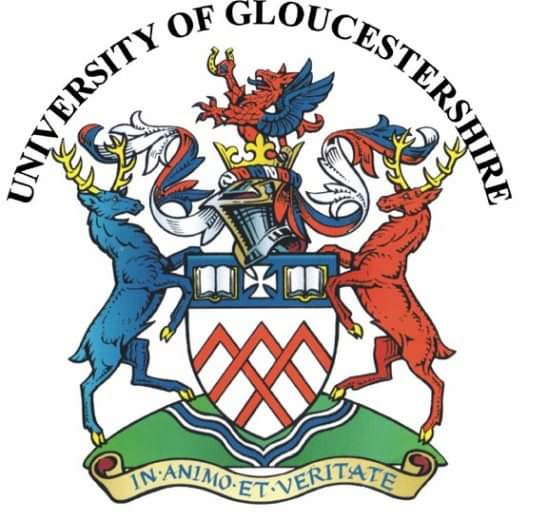

# DAVID JINANWA
# CT7206 - DISSERTATION
# TITLE - ASSESSING THE RELATIONSHIP BETWEEN ENERGY CONSUMPTION 
# AND ENVIRONMENTAL IMPACT: A MULTIVARIATE ANALYSIS OF GLOBAL DATA

In [1]:
# Importing the relevant libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Loading the Dataset

In [2]:
data = pd.read_csv("C:\\Users\\david\\OneDrive\\Desktop\\World Energy Consumption.csv")

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22012 entries, 0 to 22011
Columns: 129 entries, country to wind_share_energy
dtypes: float64(126), int64(1), object(2)
memory usage: 21.7+ MB


In [4]:
data.describe(include ='all')

,country,year,iso_code,population,gdp,biofuel_cons_change_pct,biofuel_cons_change_twh,biofuel_cons_per_capita,biofuel_consumption,biofuel_elec_per_capita,...,solar_share_elec,solar_share_energy,wind_cons_change_pct,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_electricity,wind_energy_per_capita,wind_share_elec,wind_share_energy
count,22012,22012.000000,16512,1.812300e+04,1.111300e+04,1747.000000,2687.000000,2302.000000,2767.000000,5275.000000,...,6849.000000,4035.000000,2413.000000,4639.000000,4744.000000,7065.000000,7996.000000,4065.000000,6886.000000,4101.000000
unique,306,NaN,219,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Zimbabwe,NaN,ZWE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,123,NaN,123,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,1974.213247,NaN,1.053096e+08,3.585114e+11,46.091694,2.719074,133.558459,38.068209,64.716800,...,0.622750,0.210395,267.541206,7.314174,53.422938,62.811828,17.561153,232.108949,1.404910,0.651413
std,NaN,35.058653,NaN,4.640460e+08,2.411179e+12,274.616745,10.057018,264.707851,111.623148,201.043915,...,2.066186,0.643304,5940.944120,37.327922,273.255306,252.734217,101.693172,733.841324,4.489043,1.893820
min,NaN,1900.000000,NaN,1.833000e+03,1.642060e+08,-100.000000,-50.843000,0.000000,0.000000,0.000000,...,0.000000,0.000000,-100.000000,-51.208000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,NaN,1946.000000,NaN,1.712404e+06,1.365898e+10,-0.616500,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,4.029000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,NaN,1984.000000,NaN,6.991543e+06,4.167411e+10,8.179000,0.000000,15.482000,0.673000,0.146000,...,0.000000,0.000000,20.000000,0.000000,0.005000,0.000000,0.000000,0.051000,0.000000,0.003000
75%,NaN,2003.000000,NaN,2.557688e+07,1.744295e+11,26.508500,0.861500,165.266750,13.629500,34.289000,...,0.095000,0.018500,47.971000,0.315000,2.357750,2.101000,0.140000,45.523000,0.372000,0.268000


- The data contains numerous null values especially between the periods of 1900 and 1990, which can impact the quality of the analysis. Therefore, the data will be filtered. 

# Filtering the Dataset

In [5]:
# Count the non-null values for each column
non_null_counts = data.count()

# Sort the counts in descending order
sorted_non_null_counts = non_null_counts.sort_values(ascending=False)

# Get the top 25 features with the highest frequency
top_25_features = sorted_non_null_counts.head(25)

# Display the top 25 features
print("Top 25 features with the highest frequency of non-missing values:\n", top_25_features)

Top 25 features with the highest frequency of non-missing values:
 country                        22012
year                           22012
population                     18123
oil_production                 17405
oil_prod_change_twh            17148
gas_production                 16771
gas_prod_change_twh            16516
iso_code                       16512
coal_production                16494
coal_prod_change_twh           16239
oil_prod_per_capita            15369
gas_prod_per_capita            14896
coal_prod_per_capita           14718
primary_energy_consumption     12588
energy_cons_change_twh         12310
energy_cons_change_pct         12117
gdp                            11113
energy_per_capita              10602
oil_prod_change_pct             9838
coal_prod_change_pct            9657
low_carbon_electricity          8888
hydro_electricity               8884
nuclear_electricity             8516
other_renewable_electricity     8164
renewables_electricity          8023
dtype: i

 - The above result shows the Top 25 features with the highest frequency of non-missing values before filtering the dataset.

In [6]:
# Filtering the dataset to include only the years from 1990 to 2022
filtered_dataset = data[(data['year'] >= 1990) & (data['year'] <= 2022)]

# Displaying the first few rows of the filtered dataset to verify the results
print(filtered_dataset.head())
print(f"\nNumber of rows after filtering: {len(filtered_dataset)}")

         country  year iso_code  population  gdp  biofuel_cons_change_pct  \
0  ASEAN (Ember)  2000      NaN         NaN  NaN                      NaN   
1  ASEAN (Ember)  2001      NaN         NaN  NaN                      NaN   
2  ASEAN (Ember)  2002      NaN         NaN  NaN                      NaN   
3  ASEAN (Ember)  2003      NaN         NaN  NaN                      NaN   
4  ASEAN (Ember)  2004      NaN         NaN  NaN                      NaN   

   biofuel_cons_change_twh  biofuel_cons_per_capita  biofuel_consumption  \
0                      NaN                      NaN                  NaN   
1                      NaN                      NaN                  NaN   
2                      NaN                      NaN                  NaN   
3                      NaN                      NaN                  NaN   
4                      NaN                      NaN                  NaN   

   biofuel_elec_per_capita  ...  solar_share_elec  solar_share_energy  \
0      

In [7]:
# Count the non-null values for each column
non_null_counts = filtered_dataset.count()

# Sort the counts in descending order
sorted_non_null_counts = non_null_counts.sort_values(ascending=False)

# Get the top 25 features with the highest frequency
top_25_features = sorted_non_null_counts.head(25)

# Display the top 25 features
print("Top 25 features with the highest frequency of non-missing values:\n", top_25_features)

Top 25 features with the highest frequency of non-missing values:
 country                        9501
year                           9501
primary_energy_consumption     8688
energy_cons_change_twh         8670
energy_cons_change_pct         8522
population                     7431
energy_per_capita              7343
oil_production                 7181
oil_prod_change_twh            7157
gas_production                 7117
gas_prod_change_twh            7094
iso_code                       7043
coal_production                7020
coal_prod_change_twh           6996
renewables_electricity         6691
electricity_generation         6691
low_carbon_electricity         6691
solar_electricity              6655
wind_electricity               6651
hydro_electricity              6616
other_renewable_electricity    6585
other_renewables_share_elec    6550
low_carbon_share_elec          6550
wind_share_elec                6550
renewables_share_elec          6550
dtype: int64


- The above result shows the Top 25 features with the highest frequency of non-missing values after filtering the dataset.

In [8]:
 filtered_dataset.describe()

,year,population,gdp,biofuel_cons_change_pct,biofuel_cons_change_twh,biofuel_cons_per_capita,biofuel_consumption,biofuel_elec_per_capita,biofuel_electricity,biofuel_share_elec,...,solar_share_elec,solar_share_energy,wind_cons_change_pct,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_electricity,wind_energy_per_capita,wind_share_elec,wind_share_energy
count,9501.000000,7.431000e+03,4.789000e+03,1594.000000,2200.000000,1930.000000,2258.000000,5275.000000,5527.000000,5492.000000,...,6544.000000,3005.000000,2298.000000,3364.000000,3399.000000,5970.000000,6651.000000,2970.000000,6550.000000,3022.000000
mean,2005.838964,1.199987e+08,5.783422e+11,49.214408,3.092273,155.445703,44.668065,64.716800,10.966685,1.954035,...,0.651769,0.282506,73.049715,10.071928,74.543179,74.288327,21.109098,317.421377,1.476269,0.883390
std,9.300071,5.893183e+08,3.556083e+12,287.221208,10.997491,282.298186,122.246742,201.043915,47.953561,5.274155,...,2.109316,0.731682,590.148000,43.518740,320.390270,273.386630,111.167785,842.657817,4.591322,2.159336
min,1990.000000,1.833000e+03,2.571720e+08,-100.000000,-50.843000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,-100.000000,-51.208000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1998.000000,8.478375e+05,1.804298e+10,-0.809500,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,4.017750,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2006.000000,6.323425e+06,5.916690e+10,8.424000,0.017000,24.695000,1.107500,0.146000,0.010000,0.062000,...,0.000000,0.002000,19.352000,0.008000,0.184000,0.000000,0.000000,3.200500,0.000000,0.035000
75%,2014.000000,2.499496e+07,2.847868e+11,26.863750,1.081750,217.663000,16.729000,34.289000,0.690000,1.577500,...,0.128000,0.102000,44.014000,1.118000,8.480000,8.170000,0.390000,152.044000,0.483750,0.718500
max,2022.000000,7.975105e+09,1.136302e+14,5659.328000,141.131000,2588.512000,1199.207000,2514.102000,677.570000,71.429000,...,40.000000,7.586000,21358.332000,665.413000,5487.600000,3219.852000,2139.230000,8422.012000,56.840000,26.157000


In [9]:
energy_data = filtered_dataset  # Renamed dataframe in preparation for merging.

# Loading Two Additional Datasets

In [10]:
# Load the additional datasets
air_quality_data = pd.read_csv('Air Quality.csv', encoding='ISO-8859-1')
ghg_emissions_data = pd.read_csv('GHGas Emissions.csv', encoding='ISO-8859-1')

- Reshaping the dataset (GHG Emissions) from a wide format to a long format to facilitate merging with the original dataset. This transform the columns representing years into rows, making it easier to merge based on **'year'**.

In [11]:
# Reshape the GHG emissions dataset from wide to long format
ghg_emissions_data_long = ghg_emissions_data.melt(
    id_vars=['ISO', 'Country', 'Data source', 'Sector', 'Gas', 'Unit'],
    var_name='year',
    value_name='GHG_emissions'
)

In [12]:
ghg_emissions_data_long.head(10)

,ISO,Country,Data source,Sector,Gas,Unit,year,GHG_emissions
0,WORLD,World,Climate Watch,Total including LUCF,All GHG,MtCOâe,2021,49553.48
1,CHN,China,Climate Watch,Total including LUCF,All GHG,MtCOâe,2021,12791.58
2,USA,United States,Climate Watch,Total including LUCF,All GHG,MtCOâe,2021,5564.83
3,IND,India,Climate Watch,Total including LUCF,All GHG,MtCOâe,2021,3419.89
4,EUU,European Union (27),Climate Watch,Total including LUCF,All GHG,MtCOâe,2021,3140.23
5,RUS,Russia,Climate Watch,Total including LUCF,All GHG,MtCOâe,2021,1975.57
6,BRA,Brazil,Climate Watch,Total including LUCF,All GHG,MtCOâe,2021,1531.51
7,IDN,Indonesia,Climate Watch,Total including LUCF,All GHG,MtCOâe,2021,1484.66
8,JPN,Japan,Climate Watch,Total including LUCF,All GHG,MtCOâe,2021,1071.59
9,IRN,Iran,Climate Watch,Total including LUCF,All GHG,MtCOâe,2021,952.23


In [13]:
# Convert 'year' to numeric
ghg_emissions_data_long['year'] = pd.to_numeric(ghg_emissions_data_long['year'])

In [14]:
# Rename columns in air_quality_data to match with energy_data
air_quality_data.rename(columns={'WHO Country Name': 'country', 'iso_code' : 'ISO3', 'Version of the database' : 'year'}, inplace=True)

# Rename columns in ghg_emissions_data_long to match with energy_data
ghg_emissions_data_long.rename(columns={'Country': 'country',  'Year': 'year'}, inplace=True)

In [15]:
# Display the column names of each dataset
print("Energy Data Columns:", energy_data.columns)
print("Air Quality Data Columns:", air_quality_data.columns)
print("GHG Emissions Data Columns:", ghg_emissions_data_long.columns)

Energy Data Columns: Index(['country', 'year', 'iso_code', 'population', 'gdp',
       'biofuel_cons_change_pct', 'biofuel_cons_change_twh',
       'biofuel_cons_per_capita', 'biofuel_consumption',
       'biofuel_elec_per_capita',
       ...
       'solar_share_elec', 'solar_share_energy', 'wind_cons_change_pct',
       'wind_cons_change_twh', 'wind_consumption', 'wind_elec_per_capita',
       'wind_electricity', 'wind_energy_per_capita', 'wind_share_elec',
       'wind_share_energy'],
      dtype='object', length=129)
Air Quality Data Columns: Index(['WHO Region', 'ISO3', 'country', 'City or Locality', 'Measurement Year',
       'PM2.5 (?g/m3)', 'PM10 (?g/m3)', 'NO2 (?g/m3)',
       'PM25 temporal coverage (%)', 'PM10 temporal coverage (%)',
       'NO2 temporal coverage (%)', 'Reference',
       'Number and type of monitoring stations', 'year', 'Status',
       'Unnamed: 15', 'Unnamed: 16'],
      dtype='object')
GHG Emissions Data Columns: Index(['ISO', 'country', 'Data source', 'S

- Inspecting each of the dataset by checking a few column names to understand their structure and identify common keys. This will also help to standardize the formats, in other words, the columns that are to be merged have the same names, thus ensuring consistency across the datasets.

# Merging the Three Datasets

- Merging the additional datasets with the primary dataset using common keys such as **'country'** and **'year'**.

In [16]:
# Merge the original energy dataset with the air quality dataset
combined_data = pd.merge(energy_data, air_quality_data, left_on=['country', 'year'], right_on=['country', 'year'], how='left')

In [17]:
# Merge the combined dataset with the reshaped GHG emissions dataset
combined_data = pd.merge(combined_data, ghg_emissions_data_long, on=['country', 'year'], how='left')

In [18]:
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39227 entries, 0 to 39226
Columns: 150 entries, country to GHG_emissions
dtypes: float64(137), int64(1), object(12)
memory usage: 45.2+ MB


In [19]:
# Drop the unwanted columns
air_quality_data = air_quality_data.drop(columns=['Unnamed: 15', 'Unnamed: 16'])

# Display the updated column names to confirm the columns have been removed
print("Updated Air Quality Data Columns:", air_quality_data.columns)


Updated Air Quality Data Columns: Index(['WHO Region', 'ISO3', 'country', 'City or Locality', 'Measurement Year',
       'PM2.5 (?g/m3)', 'PM10 (?g/m3)', 'NO2 (?g/m3)',
       'PM25 temporal coverage (%)', 'PM10 temporal coverage (%)',
       'NO2 temporal coverage (%)', 'Reference',
       'Number and type of monitoring stations', 'year', 'Status'],
      dtype='object')


In [20]:
combined_data.describe(include='all')

,country,year,iso_code,population,gdp,biofuel_cons_change_pct,biofuel_cons_change_twh,biofuel_cons_per_capita,biofuel_consumption,biofuel_elec_per_capita,...,Number and type of monitoring stations,Status,Unnamed: 15,Unnamed: 16,ISO,Data source,Sector,Gas,Unit,GHG_emissions
count,39227,39227.000000,36769,3.715700e+04,6.399000e+03,30566.000000,31173.000000,30903.000000,31231.000000,34615.000000,...,8690,0.0,0.0,0.0,7431,7431,7431,7431,7431,7430.000000
unique,305,NaN,219,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,596,NaN,NaN,NaN,183,1,1,1,1,NaN
top,China,NaN,CHN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1 NA,NaN,NaN,NaN,BRA,Climate Watch,Total including LUCF,All GHG,MtCOâe,NaN
freq,3998,NaN,3998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,924,NaN,NaN,NaN,427,7431,7431,7431,7431,NaN
mean,NaN,2017.903332,NaN,2.927286e+08,8.819190e+11,5.921963,1.360449,331.842538,24.441940,234.628489,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,541.505459
std,NaN,8.261493,NaN,5.729337e+08,3.339702e+12,67.823584,5.188392,366.186583,44.651303,296.949443,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2876.821695
min,NaN,1990.000000,NaN,1.833000e+03,2.571720e+08,-100.000000,-50.843000,0.000000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-182.410000
25%,NaN,2018.000000,NaN,1.038497e+07,2.592063e+10,-3.180000,-0.340000,25.542000,4.775000,32.555000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.880000
50%,NaN,2022.000000,NaN,4.755863e+07,1.598139e+11,-0.620000,-0.205000,305.221000,15.480000,143.402000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,57.355000
75%,NaN,2022.000000,NaN,8.336984e+07,8.266931e+11,14.897000,0.664000,416.013000,34.683000,311.328000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,313.230000


# Verify Merged Data
Although the merge was successful, the integrity of the dataset needs to be verified before data analysis or visualisation can be performed.

In [21]:
# Check for duplicated rows
duplicates = combined_data.duplicated()
print(f"Number of duplicated rows: {duplicates.sum()}")

# Display the first few rows of the combined data
print(combined_data.head())

# Check for missing data in key columns
missing_data_summary = combined_data[['country', 'year', 'iso_code', 'GHG_emissions']].isnull().sum()
print("Missing Data Summary for Key Columns:\n", missing_data_summary)

Number of duplicated rows: 0
         country  year iso_code  population  gdp  biofuel_cons_change_pct  \
0  ASEAN (Ember)  2000      NaN         NaN  NaN                      NaN   
1  ASEAN (Ember)  2001      NaN         NaN  NaN                      NaN   
2  ASEAN (Ember)  2002      NaN         NaN  NaN                      NaN   
3  ASEAN (Ember)  2003      NaN         NaN  NaN                      NaN   
4  ASEAN (Ember)  2004      NaN         NaN  NaN                      NaN   

   biofuel_cons_change_twh  biofuel_cons_per_capita  biofuel_consumption  \
0                      NaN                      NaN                  NaN   
1                      NaN                      NaN                  NaN   
2                      NaN                      NaN                  NaN   
3                      NaN                      NaN                  NaN   
4                      NaN                      NaN                  NaN   

   biofuel_elec_per_capita  ...  Number and type of

### Observation

This result confirms that there are no duplicated rows in the merged dataset. It also provides an overview of the data
and highlights some key columns with missing values.

# Handling Missing Data

In [22]:
# Impute missing values for numeric columns with mean (example)
numeric_columns = combined_data.select_dtypes(include=['float64', 'int64']).columns
combined_data[numeric_columns] = combined_data[numeric_columns].fillna(combined_data[numeric_columns].mean())

# Drop columns with more than a certain threshold of missing values (example: 50%)
threshold = 0.5
combined_data = combined_data.loc[:, combined_data.isnull().mean() < threshold]

# Drop remaining rows with any missing values
combined_data = combined_data.dropna()

# Summary of remaining missing data
remaining_missing_data = combined_data.isnull().sum().sum()
print(f"Remaining missing data after handling: {remaining_missing_data}")


Remaining missing data after handling: 0


In [23]:
# Sample ISO code mapping dictionary (partial)
iso_code_mapping = {
    'United States': 'USA',
    'China': 'CHN',
    'India': 'IND',
    # Add more mappings as needed
}

# Fill missing iso_code based on the country name
combined_data['iso_code'] = combined_data.apply(
    lambda row: iso_code_mapping.get(row['country'], row['iso_code']), axis=1)

# Check remaining missing iso_code values
missing_iso_codes = combined_data['iso_code'].isnull().sum()
print(f"Remaining missing iso_code values: {missing_iso_codes}")


Remaining missing iso_code values: 0


Missing data has been successfully handled. Proceeding to the next step.

# Exploratory Data Analysis (EDA)

### Descriptive Statistics and Initial Visualizations

               year    population           gdp  biofuel_cons_change_pct  \
count  29877.000000  2.987700e+04  2.987700e+04             29877.000000   
mean    2021.747565  3.346166e+08  9.310811e+11                 3.620528   
std        1.044532  5.596248e+08  5.990539e+11                14.293533   
min     2016.000000  3.729030e+05  1.894203e+10               -26.788000   
25%     2022.000000  1.965927e+07  8.819190e+11                -3.180000   
50%     2022.000000  5.903747e+07  8.819190e+11                -0.620000   
75%     2022.000000  8.534125e+07  8.819190e+11                11.639000   
max     2022.000000  1.425887e+09  1.815162e+13               204.804000   

       biofuel_cons_change_twh  biofuel_cons_per_capita  biofuel_consumption  \
count             29877.000000             29877.000000         29877.000000   
mean                  1.232497               343.285646            22.898227   
std                   4.361391               363.273740            30.44712

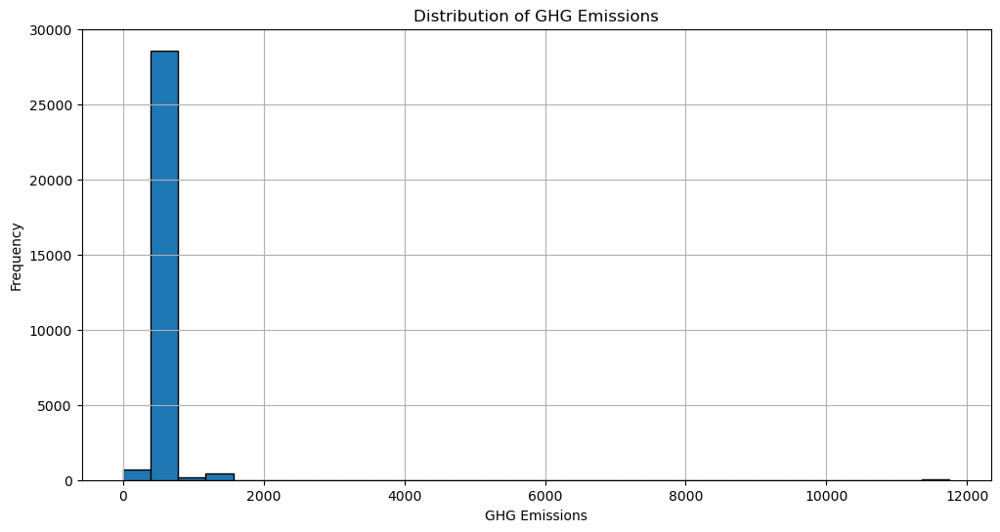

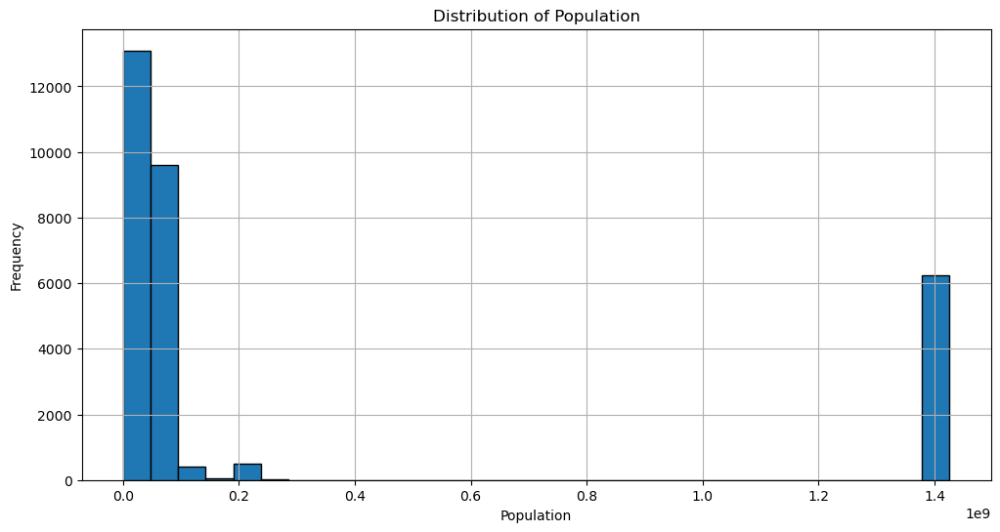

In [24]:
# Generate summary statistics for key columns
summary_stats = combined_data.describe()
print(summary_stats)

# Plot distributions of key variables
plt.figure(figsize=(12, 6))
combined_data['GHG_emissions'].hist(bins=30, edgecolor='k')
plt.title('Distribution of GHG Emissions')
plt.xlabel('GHG Emissions')
plt.ylabel('Frequency')
plt.show()

# Example for another key variable: 'population'
plt.figure(figsize=(12, 6))
combined_data['population'].hist(bins=30, edgecolor='k')
plt.title('Distribution of Population')
plt.xlabel('Population')
plt.ylabel('Frequency')
plt.show()


## Observations


### Distribution of GHG Emissions

1. **Skewness**: The distribution is highly right-skewed, with a large concentration of values near zero. This indicates that most countries have low GHG emissions, but a few countries have extremely high emissions.
2. **Outliers**: The presence of high values (outliers) is apparent in the distribution, suggesting a few countries are major contributors to GHG emissions.
3. **Central Tendency**: The peak of the histogram near zero indicates that the mean and median GHG emissions are relatively low. However, the mean is likely higher than the median due to the skewness.

### Distribution of Population

1. **Bimodal Distribution**: The histogram shows a bimodal distribution, with two distinct peaks. The first peak is around the lower population values, and the second peak is near 1.4 billion, indicating countries with very high populations (e.g., China, India).
2. **Skewness**: Similar to GHG emissions, the population distribution is also skewed, but more complex due to the bimodal nature. This indicates a significant disparity in population sizes across countries.
3. **Central Tendency**: The two peaks suggest two central tendencies in the data, with most countries having relatively small populations and a few countries with very large populations.

### Analysis and Implications

**Imbalance:** Both histograms reveal a high degree of imbalance in the data. Such skewed distributions are common in global datasets, where a few entities (countries) disproportionately contribute to the overall metrics.

**Impact on Analysis:**
- Statistical Methods: Standard statistical methods assuming normality may not be appropriate due to the skewness and presence of outliers. Transformation of data or robust statistical techniques may be necessary.
- Visualization: For clearer visualization, log transformation of skewed variables may be considered to reduce skewness and make patterns more apparent.
- Predictive Modelling: When building the predictive models, the impact of these distributions would be taken into consideration. Techniques like regularization might help in dealing with skewed data and outliers.


## Conclusion
The preceding analysis necessitates in-depth examination to further assess the structure of the dataset.

# Research Question 1 (RQ1)

***How do energy consumption patterns vary across different countries and regions, and what factors contribute to these variations?***

To answer (RQ1) about global consumption patterns and trends, the following will be examined:

(1) Top 10 Countries by: 
- total consumption
- consumption by sector

(2) Trends by Year of:
- consumption of each sector 
- total consumption

(3) GDP and Population
- Total Energy Consumption vs. GDP
- Total Energy Consumption vs. Population

# [1] The Top 10 Countries

### Identify Available Columns

In [25]:
# Display the columns to identify the relevant ones
print(combined_data.columns)

Index(['country', 'year', 'iso_code', 'population', 'gdp',
       'biofuel_cons_change_pct', 'biofuel_cons_change_twh',
       'biofuel_cons_per_capita', 'biofuel_consumption',
       'biofuel_elec_per_capita',
       ...
       'City or Locality', 'Measurement Year', 'PM2.5 (?g/m3)', 'PM10 (?g/m3)',
       'NO2 (?g/m3)', 'PM25 temporal coverage (%)',
       'PM10 temporal coverage (%)', 'NO2 temporal coverage (%)', 'Reference',
       'GHG_emissions'],
      dtype='object', length=141)


### Create Total Energy Consumption Column

A **'total_energy_consumption'** column will be created by summing the relevant energy consumption columns, assuming any column with **'consumption'** in its name represents an energy consumption metric.

In [27]:
# Create a 'total_energy_consumption' column if it's missing
energy_consumption_columns = [col for col in combined_data.columns if 'consumption' in col]

combined_data['total_energy_consumption'] = combined_data[energy_consumption_columns].sum(axis=1)

# Display the first few rows to ensure the column is created correctly
print(combined_data[['country', 'year', 'total_energy_consumption']].head())

       country  year  total_energy_consumption
235    Algeria  2022               2423.206651
393  Argentina  2018               3064.580000
397  Argentina  2022               3131.195000
398  Argentina  2022               3131.195000
399  Argentina  2022               3131.195000


Creating the **'total_energy_consumption'** column was a necessary step to facilitate a more comprehensive and insightful analysis of global energy consumption patterns. This approach not only simplifies the analytical process but also enhances the clarity and communicability of the findings, making it a valuable addition to the dataset.

### (a) Top 10 Countries by Total Energy Consumption

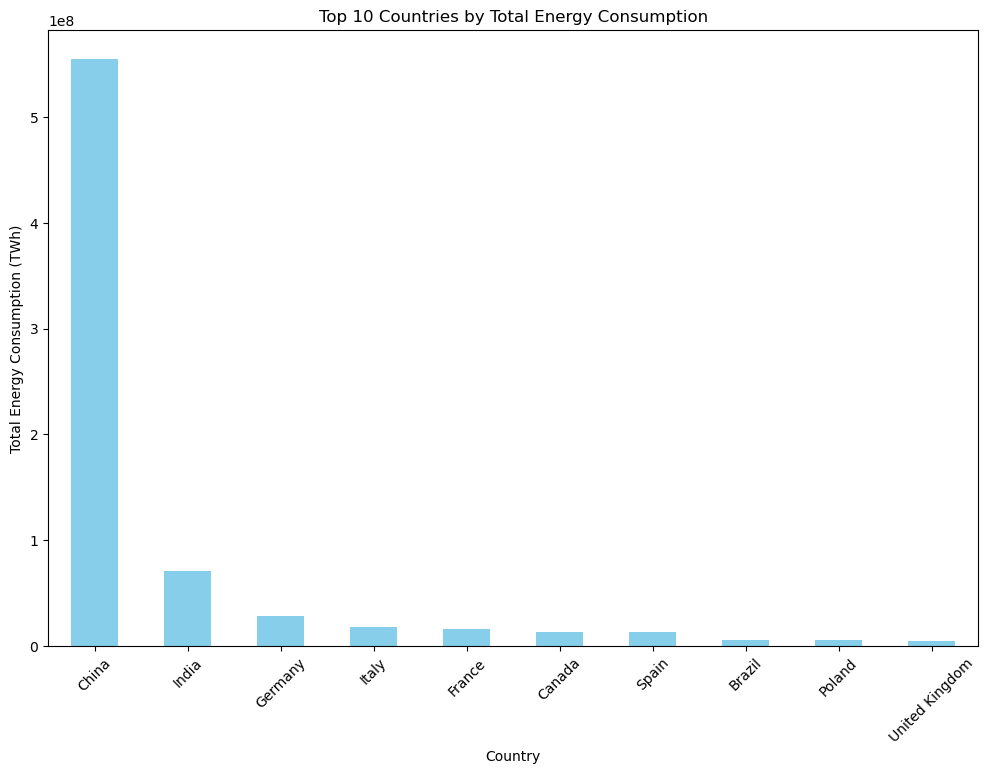

In [28]:
# Top 10 countries by total energy consumption
top_total_consumption = combined_data.groupby('country')['total_energy_consumption'].sum().nlargest(10)

plt.figure(figsize=(12, 8))
top_total_consumption.plot(kind='bar', color='skyblue')
plt.title('Top 10 Countries by Total Energy Consumption')
plt.xlabel('Country')
plt.ylabel('Total Energy Consumption (TWh)')
plt.xticks(rotation=45)
plt.show()

### Observations

- **China** has the highest total energy consumption by a significant margin compared to other countries. This reflects its status as the world's most populous country with rapid industrialization and urbanization.
- **India** is the second highest, though it is far behind China, indicating its large population and growing industrial sector.
- The remaining countries **(Germany, Italy, France, Canada, Spain, Brazil, Poland, and the United Kingdom)** have significantly lower total energy consumption compared to China and India. These countries represent a mix of developed and developing nations with varying levels of industrialization and population sizes.

### (b) Top 10 Countries by Energy Consumption by Sector

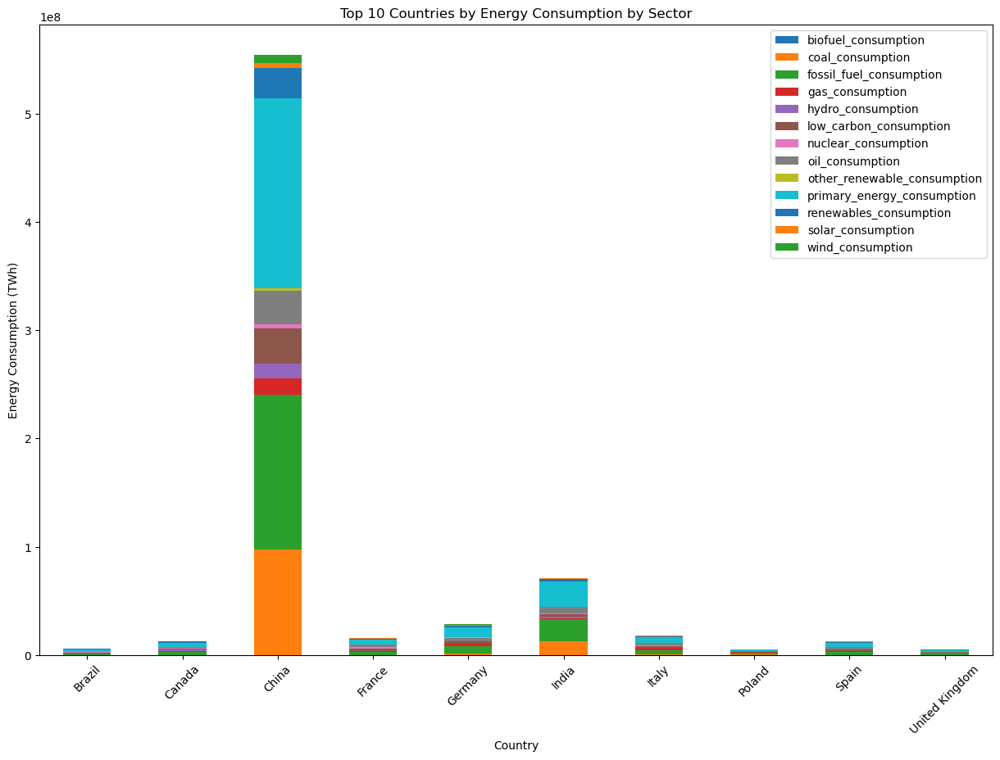

In [29]:
# Aggregate data for top 10 countries
top_countries = combined_data.groupby('country')['total_energy_consumption'].sum().nlargest(10).index
sector_columns = [col for col in combined_data.columns if 'consumption' in col and col != 'total_energy_consumption']

top_consumption_by_sector = combined_data[combined_data['country'].isin(top_countries)].groupby('country')[sector_columns].sum()

top_consumption_by_sector.plot(kind='bar', stacked=True, figsize=(15, 10))
plt.title('Top 10 Countries by Energy Consumption by Sector')
plt.xlabel('Country')
plt.ylabel('Energy Consumption (TWh)')
plt.xticks(rotation=45)
plt.legend(loc='upper right')
plt.show()

### Observations

- **China** dominates energy consumption across multiple sectors, including fossil fuels, coal, oil, and gas. This is consistent with its heavy reliance on a mix of energy sources to fuel its massive industrial base.
- **India** also shows considerable consumption across different energy sectors, reflecting its growing economy and energy demands.
- Other countries like **Germany, Italy, France, and Canada** show more balanced energy consumption profiles across various sectors, indicating diversified energy mixes including renewables and nuclear energy.
- It's notable that **renewable energy consumption** (including solar and wind) is relatively low compared to fossil fuel consumption, even in countries with advanced renewable energy programs.


# [2] Yearly Trends Analysis

### (a) Yearly Trends of Consumption for Each Sector

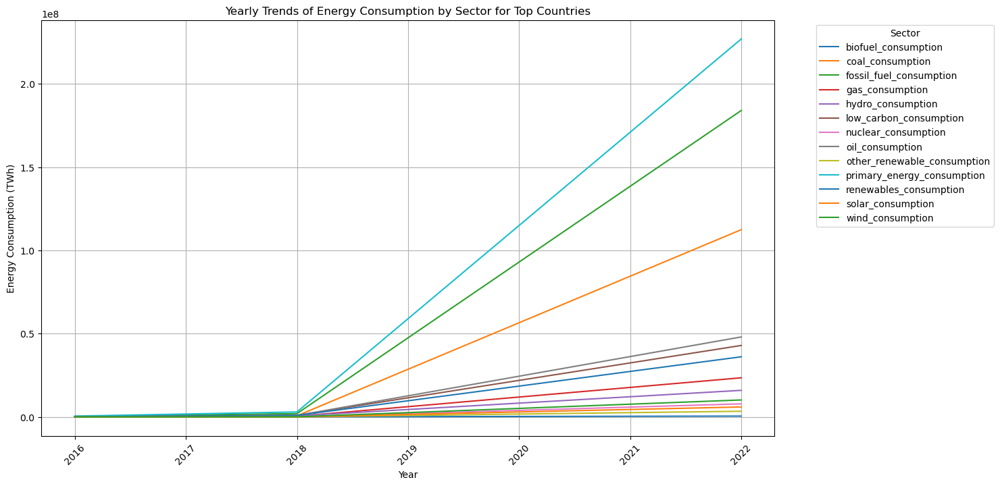

In [30]:
# Identify the top 10 countries by total energy consumption
top_countries = combined_data.groupby('country')['total_energy_consumption'].sum().nlargest(10).index

# Filter data for the top 10 countries
top_countries_data = combined_data[combined_data['country'].isin(top_countries)]

# Aggregate data by year and sector, selecting only numeric columns
numeric_columns = top_countries_data.select_dtypes(include='number').columns
yearly_trends = top_countries_data.groupby('year')[numeric_columns].sum()

# List of energy consumption columns by sector
sectors = ['biofuel_consumption', 'coal_consumption', 'fossil_fuel_consumption', 'gas_consumption', 'hydro_consumption',
           'low_carbon_consumption', 'nuclear_consumption', 'oil_consumption', 'other_renewable_consumption', 
           'primary_energy_consumption', 'renewables_consumption', 'solar_consumption', 'wind_consumption']

# Plot yearly trends for each sector
plt.figure(figsize=(14, 8))
for sector in sectors:
    plt.plot(yearly_trends.index, yearly_trends[sector], label=sector)

plt.title('Yearly Trends of Energy Consumption by Sector for Top Countries')
plt.xlabel('Year')
plt.ylabel('Energy Consumption (TWh)')
plt.legend(title='Sector', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

### Observations

1. **Consistent Growth Across Sectors:** The chart shows a consistent increase in energy consumption across all sectors from **2018** to **2022**. This indicates a growing demand for energy in the top countries.
2. **Dominance of Certain Sectors:** Some sectors, like fossil fuel consumption, oil consumption, and coal consumption, have higher consumption levels compared to others like solar consumption and wind consumption. This suggests that traditional energy sources still dominate the energy mix.
3. **Renewable Energy Trends:** Renewable energy sectors such as wind and solar are showing an upward trend, although at a slower rate compared to fossil fuels. This indicates a gradual shift towards renewable energy sources.
4. **Sector-Specific Trends:** The trends show that certain sectors like gas consumption and oil consumption have significant increases, reflecting the reliance on these energy sources.

### Implications
- The increasing trend across all sectors highlights the growing energy demands of these countries, which could have significant environmental implications if not managed sustainably.
- The slow growth in renewable energy sectors suggests a need for increased investment and policy support to accelerate the transition to cleaner energy sources.

### (b) Yearly Trends of Total Consumption

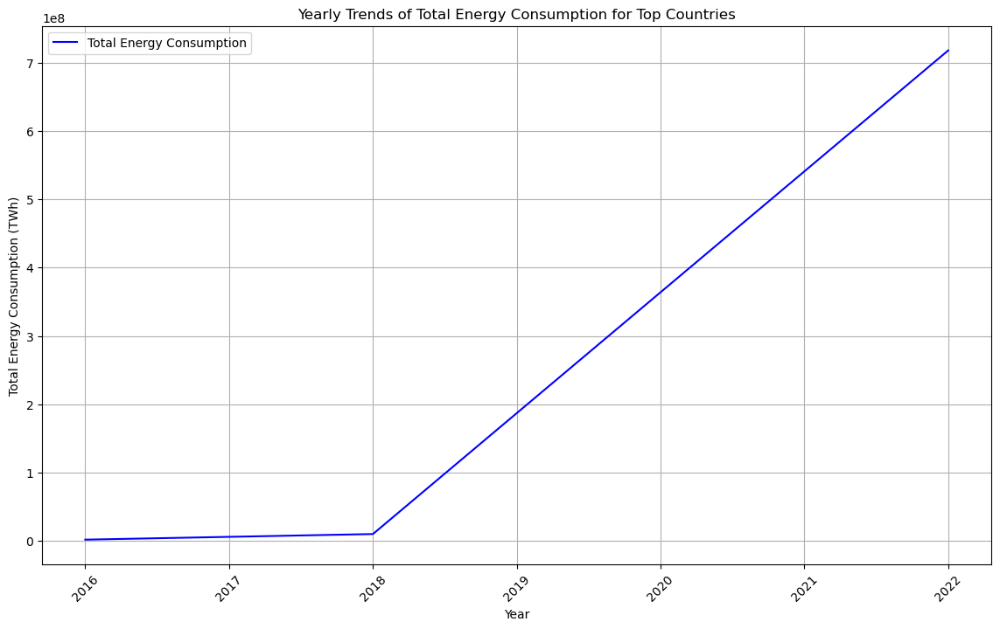

In [31]:
# Plot yearly trends of total energy consumption
plt.figure(figsize=(14, 8))
plt.plot(yearly_trends.index, yearly_trends['total_energy_consumption'], label='Total Energy Consumption', color='blue')

plt.title('Yearly Trends of Total Energy Consumption for Top Countries')
plt.xlabel('Year')
plt.ylabel('Total Energy Consumption (TWh)')
plt.legend(loc='upper left')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

### Observations

1. **Steady Increase:** The total energy consumption shows a steady and significant increase over the years. There is a notable rise starting from **2018**, indicating a sharp increase in energy demand.
2. **Exponential Growth:** The growth rate appears to be exponential, especially from **2018** onwards, suggesting that energy consumption is accelerating over time.
3. **Impact of Economic and Population Growth:** The increase in total energy consumption likely reflects economic growth, industrialization, and population growth in these top countries.

### Implications
- The steady and sharp increase in total energy consumption underscores the need for effective energy policies to ensure sustainable energy use.
- Given the exponential growth, there is a critical need for these countries to focus on energy efficiency measures and the integration of renewable energy sources to meet their energy demands sustainably.
- The trends highlight the importance of planning for future energy infrastructure and investment to support the growing energy needs without exacerbating environmental issues.


# [3] Visualizing GDP and Population

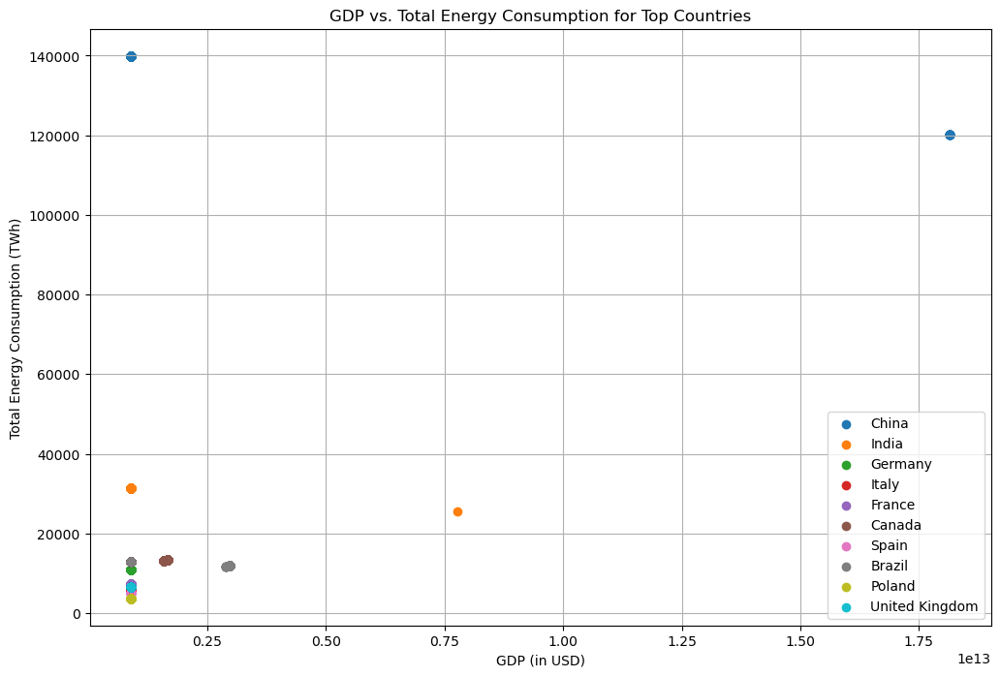

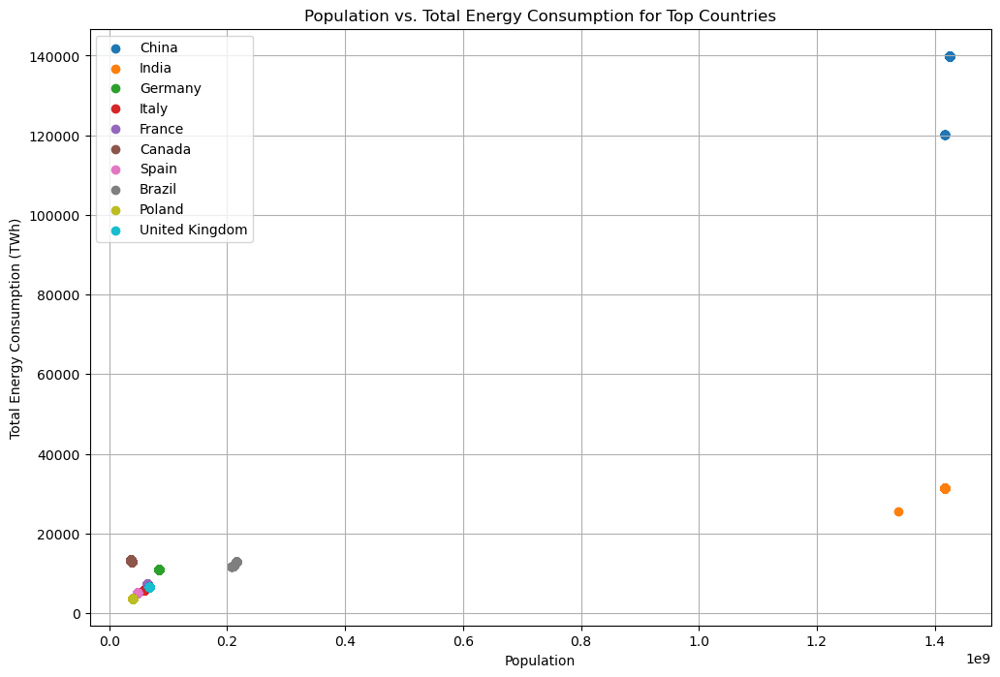

In [32]:

# Calculate total energy consumption per country
total_energy_consumption = combined_data.groupby('country')['total_energy_consumption'].sum().nlargest(10)

# Filter the data for the top 10 countries
top_countries = total_energy_consumption.index
top_countries_data = combined_data[combined_data['country'].isin(top_countries)]

# Plotting GDP vs. Total Energy Consumption
plt.figure(figsize=(12, 8))
for country in top_countries:
    country_data = top_countries_data[top_countries_data['country'] == country]
    plt.scatter(country_data['gdp'], country_data['total_energy_consumption'], label=country)

plt.title('GDP vs. Total Energy Consumption for Top Countries')
plt.xlabel('GDP (in USD)')
plt.ylabel('Total Energy Consumption (TWh)')
plt.legend()
plt.grid(True)
plt.show()

# Plotting Population vs. Total Energy Consumption
plt.figure(figsize=(12, 8))
for country in top_countries:
    country_data = top_countries_data[top_countries_data['country'] == country]
    plt.scatter(country_data['population'], country_data['total_energy_consumption'], label=country)

plt.title('Population vs. Total Energy Consumption for Top Countries')
plt.xlabel('Population')
plt.ylabel('Total Energy Consumption (TWh)')
plt.legend()
plt.grid(True)
plt.show()


### Initial Observations

1. **China and India Stand Out:**
   - Positioned at the highest point on both axes, China has a very high total energy consumption, significantly higher than the other countries. It also has one of the highest GDPs among the countries plotted.
   - On the other hand, India also shows a high total energy consumption, but it has a lower GDP compared to China.

2. **Clustered Data Points:**
   - Most of the other countries (Germany, Italy, France, Canada, Spain, Brazil, Poland, and the United Kingdom) are clustered towards the lower left of the plot, probably indicating similar ranges of GDP and energy consumption.


Further visualisations are required for better inspection of the individual data points.

### USING LOGARITHMIC SCALE - 
  
Using Logarithmic scale for both axes to better visualize the spread of countries,
especially since GDP and energy consumption values vary widely. This will also help in providing ample space for the data points.

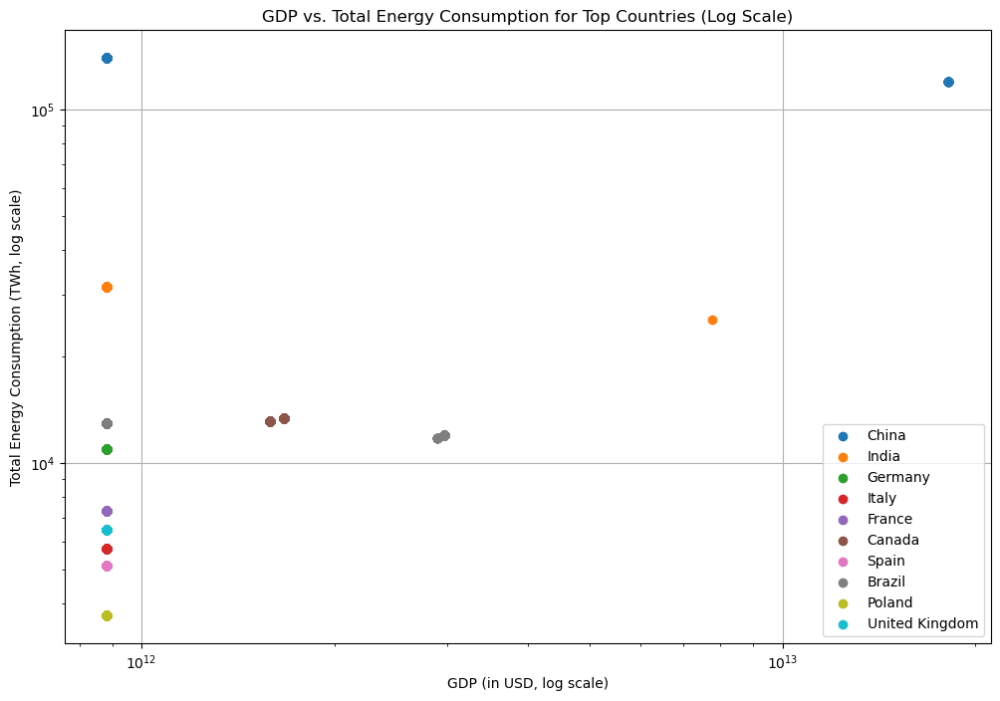

In [33]:

# Calculate total energy consumption per country
total_energy_consumption = combined_data.groupby('country')['total_energy_consumption'].sum().nlargest(10)

# Filter the data for the top N countries
top_countries = total_energy_consumption.index
top_countries_data = combined_data[combined_data['country'].isin(top_countries)]

# Plotting GDP vs. Total Energy Consumption with logarithmic scale
plt.figure(figsize=(12, 8))
for country in top_countries:
    country_data = top_countries_data[top_countries_data['country'] == country]
    plt.scatter(country_data['gdp'], country_data['total_energy_consumption'], label=country)

plt.xscale('log')
plt.yscale('log')
plt.title('GDP vs. Total Energy Consumption for Top Countries (Log Scale)')
plt.xlabel('GDP (in USD, log scale)')
plt.ylabel('Total Energy Consumption (TWh, log scale)')
plt.legend()
plt.grid(True)
plt.show()

### USING INTERACTIVE CHART - 

Creating an interactive scatter plot with increased dimensions would make it easier to visualize and interpret the data.

-  **GDP vs. Total Energy Consumption**

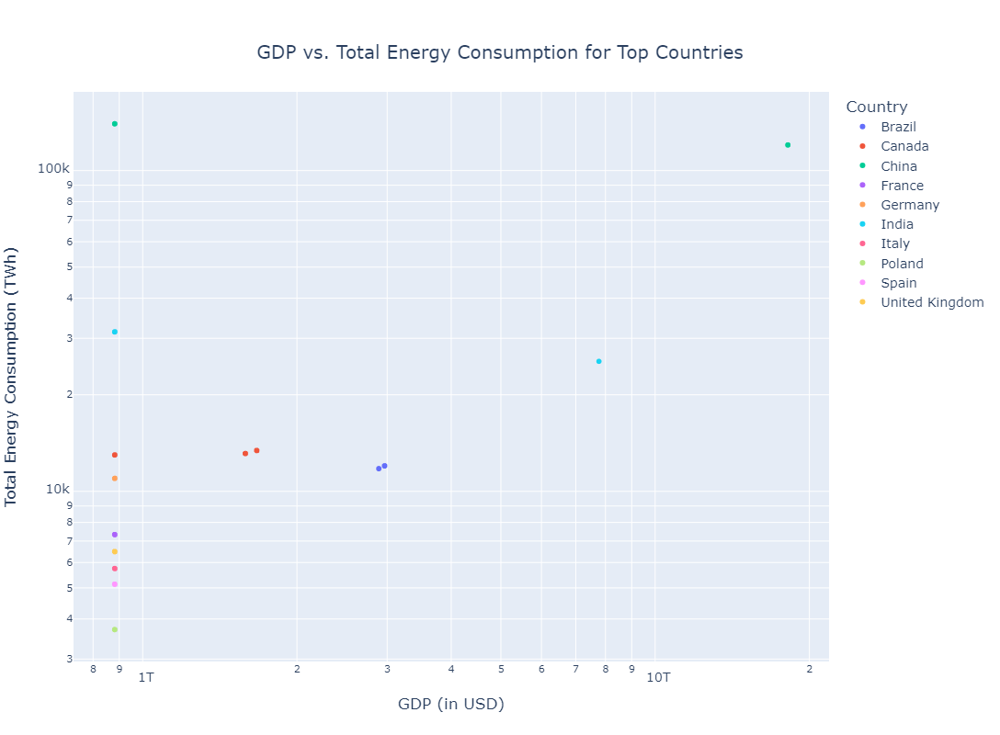

In [34]:
# Calculate total energy consumption per country
total_energy_consumption = combined_data.groupby('country')['total_energy_consumption'].sum().nlargest(10)

# Filter the data for the top N countries
top_countries = total_energy_consumption.index
top_countries_data = combined_data[combined_data['country'].isin(top_countries)]

# Creating a larger interactive plot
fig = px.scatter(top_countries_data, x='gdp', y='total_energy_consumption', color='country',
                 title='GDP vs. Total Energy Consumption for Top Countries',
                 labels={'gdp': 'GDP (in USD)', 'total_energy_consumption': 'Total Energy Consumption (TWh)'},
                 log_x=True, log_y=True,
                 width=1000, height=800)  # Increased width and height for a larger plot

fig.update_layout(
    title={'x':0.5, 'xanchor': 'center', 'yanchor': 'top'},  # Centering the title
    legend_title_text='Country',  # Adding legend title
    font=dict(size=14)  # Adjusting font size for better readability
)

fig.show()

# Observations

1. **China**:
   - China stands out with both the highest **GDP** and the highest total energy consumption among the listed countries, confirming earlier observation.
   - This indicates a strong correlation between its economic size and its energy demands.

2. **India**:
   - India, with a relatively lower **GDP** compared to China, still shows a significantly high total energy consumption, second only to China.
   - This suggests a large energy consumption relative to its **GDP**, likely due to its large population and industrial activities.

3. **European Countries (Germany, France, Italy, United Kingdom, Spain)**:
   - These countries cluster together with moderate **GDP** values and relatively lower total energy consumption compared to China and India.
   - The clustering indicates similar economic sizes and energy consumption patterns.

4. **Canada**:
   - Canada shows a relatively high **GDP** with moderate total energy consumption, positioned slightly apart from the European cluster.
   - This could be attributed to its energy-efficient technologies and lower population density.

5. **Brazil and Poland**:
   - Both countries have lower **GDP** and energy consumption compared to the other countries, indicating smaller economies and energy demands.

### USING INTERACTIVE CHART -

 - **Population vs. Total Energy Consumption**

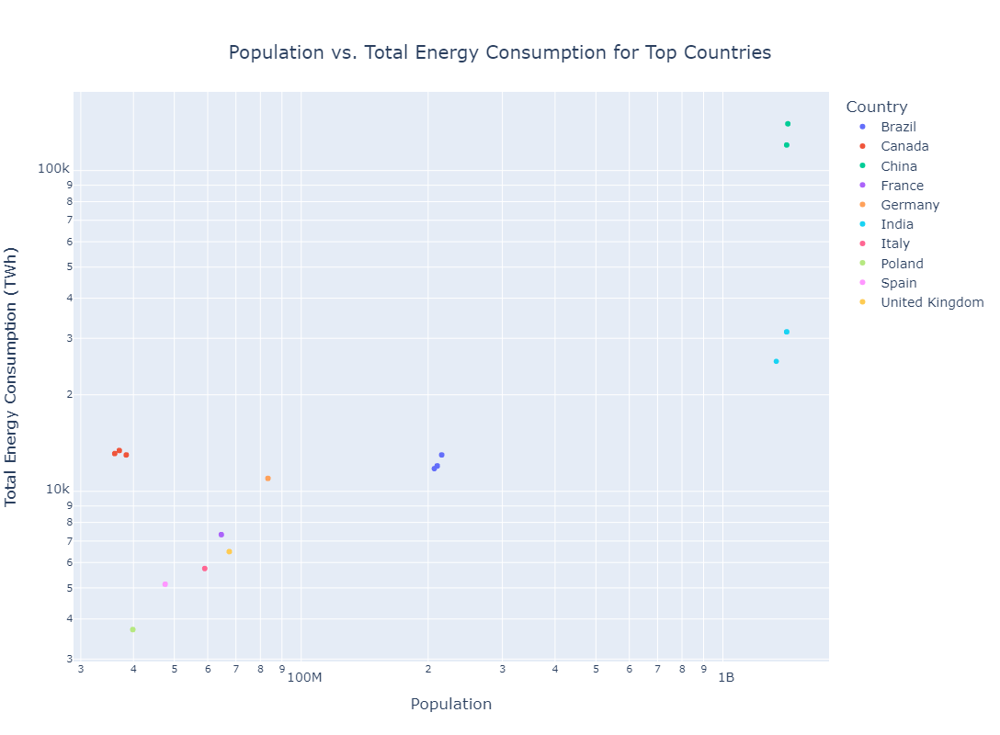

In [35]:
# Calculate total energy consumption per country
total_energy_consumption = combined_data.groupby('country')['total_energy_consumption'].sum().nlargest(10)

# Filter the data for the top 10 countries
top_countries = total_energy_consumption.index
top_countries_data = combined_data[combined_data['country'].isin(top_countries)]

# Creating a larger interactive plot
fig = px.scatter(top_countries_data, x='population', y='total_energy_consumption', color='country',
                 title='Population vs. Total Energy Consumption for Top Countries',
                 labels={'population': 'Population', 'total_energy_consumption': 'Total Energy Consumption (TWh)'},
                 log_x=True, log_y=True,
                 width=1000, height=800)  # Increased width and height for a larger plot

fig.update_layout(
    title={'x': 0.5, 'xanchor': 'center', 'yanchor': 'top'},  # Centering the title
    legend_title_text='Country',  # Adding legend title
    font=dict(size=14)  # Adjusting font size for better readability
)

fig.show()


# Observations

1. **China**:
   - China is positioned at the top right, indicating both a large **population** and high total energy consumption.
   - This highlights the substantial energy demands driven by its vast **population**.

2. **India**:
   - India, similar to China, shows a large **population** and significant energy consumption, albeit less than China.
   - This underscores India's growing energy needs in relation to its large **population**.

3. **European Countries (Germany, France, Italy, United Kingdom, Spain)**:
   - These countries are clustered towards the left, indicating smaller **populations** and moderate energy consumption.
   - The clustering suggests similar demographic and energy consumption patterns.

4. **Canada**:
   - Canada, with a relatively small **population**, shows moderate energy consumption, positioned separately from the European cluster.
   - This reflects its high per capita energy consumption despite a lower **population**.

5. **Brazil and Poland**:
   - Both countries have moderate **populations** and lower energy consumption, reflecting smaller energy demands.

# Conclusion

The scatter plot effectively illustrates a positive correlation between GDP and total energy consumption among the top countries. This relationship underscores the link between economic development and energy usage, highlighting the challenges of balancing economic growth with sustainable energy consumption practices.

**China and India as Outliers**: Both countries exhibit extreme values in terms of population, GDP, and total energy consumption compared to the other countries in the dataset. Their positions on the graphs are far from the clusters formed by European countries, Canada, Brazil, and Poland, which indicates that they are outliers.
**Implications**: This outlier status reflects the unique economic and demographic profiles of China and India, characterized by large populations, substantial industrial activities, and significant energy needs. Their outlier positions highlight the importance of considering population size and economic scale when analyzing energy consumption patterns.

These observations and analyses provide a detailed understanding of the relationships between GDP, population, and total energy consumption for the top ten countries.

### ***Special Observation***

In visualising and analysing trends and patterns in energy consumption of the **"Top 10 Countries"**, the USA (one of the world's foremost industrialised nations) was conspicuously missing. This is intriguing, and requires investigation.

In [36]:

# Checking the total energy consumption for the United States only.


# Filter the dataset for the United States
usa_data = combined_data[combined_data['country'] == 'United States']

# Calculate the total energy consumption for the United States
total_energy_consumption_usa = usa_data['total_energy_consumption'].sum()

print(f"Total Energy Consumption for the United States: {total_energy_consumption_usa} TWh")

# Print the filtered data to verify
print("Filtered data for the United States:")
print(usa_data)

Total Energy Consumption for the United States: 0.0 TWh
Filtered data for the United States:
Empty DataFrame
Columns: [country, year, iso_code, population, gdp, biofuel_cons_change_pct, biofuel_cons_change_twh, biofuel_cons_per_capita, biofuel_consumption, biofuel_elec_per_capita, biofuel_electricity, biofuel_share_elec, biofuel_share_energy, carbon_intensity_elec, coal_cons_change_pct, coal_cons_change_twh, coal_cons_per_capita, coal_consumption, coal_elec_per_capita, coal_electricity, coal_prod_change_pct, coal_prod_change_twh, coal_prod_per_capita, coal_production, coal_share_elec, coal_share_energy, electricity_demand, electricity_generation, electricity_share_energy, energy_cons_change_pct, energy_cons_change_twh, energy_per_capita, energy_per_gdp, fossil_cons_change_pct, fossil_cons_change_twh, fossil_elec_per_capita, fossil_electricity, fossil_energy_per_capita, fossil_fuel_consumption, fossil_share_elec, fossil_share_energy, gas_cons_change_pct, gas_cons_change_twh, gas_consump

In [37]:
# Check unique country names in the dataset
unique_countries = combined_data['country'].unique()
print("Unique country names in the dataset:")
print(unique_countries)

Unique country names in the dataset:
['Algeria' 'Argentina' 'Australia' 'Austria' 'Bahrain' 'Bangladesh'
 'Belgium' 'Bhutan' 'Bosnia and Herzegovina' 'Brazil' 'Bulgaria'
 'Cameroon' 'Canada' 'Chile' 'China' 'Colombia' 'Costa Rica' 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' 'Denmark' 'Ecuador' 'Egypt' 'El Salvador'
 'Estonia' 'Fiji' 'Finland' 'France' 'Georgia' 'Germany' 'Ghana' 'Greece'
 'Guatemala' 'Honduras' 'Hungary' 'Iceland' 'India' 'Indonesia' 'Iraq'
 'Ireland' 'Israel' 'Italy' 'Jamaica' 'Japan' 'Jordan' 'Kazakhstan'
 'Kenya' 'Kuwait' 'Latvia' 'Lebanon' 'Lithuania' 'Luxembourg' 'Malaysia'
 'Maldives' 'Malta' 'Mauritius' 'Mexico' 'Mongolia' 'Montenegro' 'Morocco'
 'Myanmar' 'Nepal' 'Netherlands' 'New Zealand' 'Nigeria' 'North Macedonia'
 'Norway' 'Pakistan' 'Panama' 'Paraguay' 'Peru' 'Philippines' 'Poland'
 'Portugal' 'Qatar' 'Romania' 'Saudi Arabia' 'Senegal' 'Serbia'
 'Singapore' 'Slovakia' 'Slovenia' 'South Africa' 'Spain' 'Sri Lanka'
 'Sweden' 'Switzerland' 'Thailand' 'Trinidad and 

### ***Note***

The absence of the United States from the top 10 countries in the scatter plot is indeed surprising, given its significant GDP and energy consumption. This could be as a result of some discrepancies in the data source. Further investigation is required.

In [38]:
# Try different variations of the United States
variations = ['United States', 'USA', 'United States of America']

for variation in variations:
    usa_data =  combined_data[combined_data['country'] == variation]
    total_energy_consumption_usa = usa_data['total_energy_consumption'].sum()
    print(f"Total Energy Consumption for {variation}: {total_energy_consumption_usa} TWh")
    print(usa_data)

Total Energy Consumption for United States: 0.0 TWh
Empty DataFrame
Columns: [country, year, iso_code, population, gdp, biofuel_cons_change_pct, biofuel_cons_change_twh, biofuel_cons_per_capita, biofuel_consumption, biofuel_elec_per_capita, biofuel_electricity, biofuel_share_elec, biofuel_share_energy, carbon_intensity_elec, coal_cons_change_pct, coal_cons_change_twh, coal_cons_per_capita, coal_consumption, coal_elec_per_capita, coal_electricity, coal_prod_change_pct, coal_prod_change_twh, coal_prod_per_capita, coal_production, coal_share_elec, coal_share_energy, electricity_demand, electricity_generation, electricity_share_energy, energy_cons_change_pct, energy_cons_change_twh, energy_per_capita, energy_per_gdp, fossil_cons_change_pct, fossil_cons_change_twh, fossil_elec_per_capita, fossil_electricity, fossil_energy_per_capita, fossil_fuel_consumption, fossil_share_elec, fossil_share_energy, gas_cons_change_pct, gas_cons_change_twh, gas_consumption, gas_elec_per_capita, gas_electricit

### Missing Data for the United States

Upon thorough examination of the dataset, it was discovered that the data for the United States is missing. Specifically, the rows and columns allocated for the United States in the dataset contain no values for total energy consumption. This absence of data has important implications for the analysis:

1. **Impact on Analysis and Visualizations**:
    - The United States, being one of the world's foremost industrialized nations with significant energy consumption, is a critical entity for comprehensive global energy consumption analysis.
    - The absence of the United States data affects the completeness of the comparative analysis, especially in visualizations where the USA would typically be expected to appear as a significant data point due to its large GDP and high total energy consumption.

2. **Potential Misinterpretations**:
    - Without the inclusion of the USA, the analysis may present an incomplete picture of global energy consumption patterns. It may lead to underestimation of total energy consumption for developed nations.
    - The omission could potentially skew interpretations, particularly when comparing other high-consumption countries like China and India, as the USA is a key reference point for high energy consumption metrics.

3. **Recommendation**:
    - It is recommended that future analyses ensure the inclusion of complete and accurate data for all significant countries, especially the United States, to provide a more comprehensive understanding of global energy consumption trends.

4. **Transparency**:
    - It is crucial to maintain transparency about the limitations of the current dataset. Hence, this report acknowledges the missing data for the United States and advises readers to interpret the findings with this context in mind.

# Research Question 2 (RQ2)

***What are the key drivers of energy consumption within various sectors (e.g., residential, commercial, industrial) and how do they influence overall energy demand?***

For a precise analysis of sectoral energy consumption, verification of a detailed sectoral breakdowns (residential, commercial, industrial) 
for the key countries is necessary.
If sectoral data is available, a preliminary analysis to visualize energy consumption patterns within different sectors for the top countries will be performed.

In [39]:
# Display all column names to identify relevant sectoral energy consumption data
print(combined_data.columns)

Index(['country', 'year', 'iso_code', 'population', 'gdp',
       'biofuel_cons_change_pct', 'biofuel_cons_change_twh',
       'biofuel_cons_per_capita', 'biofuel_consumption',
       'biofuel_elec_per_capita',
       ...
       'Measurement Year', 'PM2.5 (?g/m3)', 'PM10 (?g/m3)', 'NO2 (?g/m3)',
       'PM25 temporal coverage (%)', 'PM10 temporal coverage (%)',
       'NO2 temporal coverage (%)', 'Reference', 'GHG_emissions',
       'total_energy_consumption'],
      dtype='object', length=142)


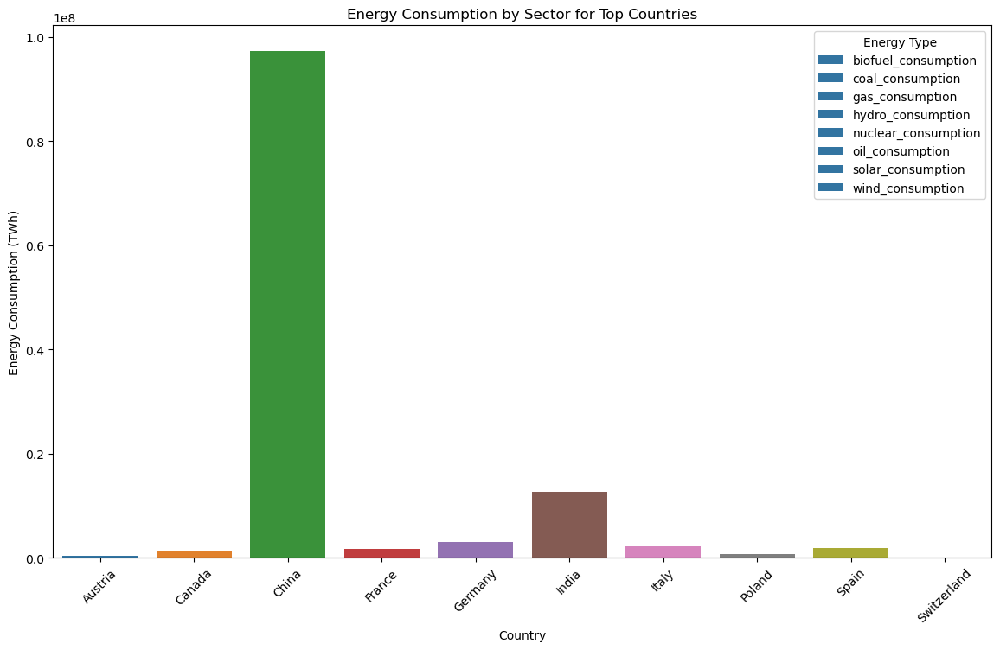

In [40]:

# Define the sectors of interest
sectors = ['biofuel_consumption', 'coal_consumption', 'gas_consumption', 'hydro_consumption', 'nuclear_consumption', 'oil_consumption', 'solar_consumption', 'wind_consumption']

# Filter data for top countries
top_countries = combined_data['country'].value_counts().index[:10]
top_countries_data = combined_data[combined_data['country'].isin(top_countries)]

# Plot energy consumption by sector for top countries
plt.figure(figsize=(14, 8))
for sector in sectors:
    sector_data = top_countries_data.groupby('country')[sector].sum().reset_index()
    sns.barplot(x='country', y=sector, data=sector_data, label=sector)

plt.title('Energy Consumption by Sector for Top Countries')
plt.xlabel('Country')
plt.ylabel('Energy Consumption (TWh)')
plt.legend(title='Energy Type')
plt.xticks(rotation=45)
plt.show()

### Observations

1. **China's Dominance in Total Energy Consumption**:
   - China exhibits an overwhelmingly high total energy consumption compared to other countries. The bar for China is significantly taller than that for any other country.

2. **India's Energy Consumption**:
   - India has the second-highest total energy consumption, though it is much smaller than China's. The bar for India is considerably shorter than that for China but taller than those for other countries.

3. **Other Countries**:
   - Other countries like Canada, France, Germany, and others show relatively lower total energy consumption. The bars for these countries are significantly shorter compared to China and India.

#### Analysis

- **China and India's Total Energy Consumption**:
  - The extremely high total energy consumption in China reflects its massive industrial base, large population, and rapid economic growth. This high energy demand is a major factor in global energy markets and has significant implications for global carbon emissions.
  - India's total energy consumption, while lower than China's, is also substantial. This is driven by its large population and growing economy.

- **Global Energy Consumption Patterns**:
  - The graph indicates a significant concentration of energy consumption in China and India. This highlights the need for these countries to play a central role in global efforts to transition to sustainable energy sources and reduce carbon emissions.

- **Policy Implications**:
  - For China and India, policies should focus on improving energy efficiency and increasing the share of renewable energy sources. These countries have the potential to make a significant impact on global energy sustainability.
  - For other countries with lower total energy consumption, the focus might be on maintaining current energy efficiency levels and further integrating renewable energy into their energy mix.

### Conclusion

The graph highlights the significant disparity in total energy consumption among the top countries, with China and India showing particularly high levels. This underscores the importance of targeted energy policies and investments in renewable energy to address environmental and sustainability challenges on a global scale. Having said that, without specific information on energy types, the analysis focuses on total energy consumption, which is a critical factor in understanding global energy dynamics.

# Imbalance in the Distribution

From the foregoing analysis, it can be inferred that there is an imbalance in the distribution of the data. This conclusion can be supported by the following key observations:

**Dominance of China:** China has an overwhelmingly high energy consumption compared to other countries, especially in the oil consumption sector. This skews the distribution heavily towards China.

**Minimal Contributions from Other Countries:** Most other countries, such as Austria, Switzerland, and Poland, show relatively minimal energy consumption across all sectors. This significant difference creates an imbalance in the overall distribution.

**Sectoral Distribution:** The energy consumption is not evenly distributed across different energy types. For example, oil consumption is predominant, while other energy types like biofuel or wind may show minimal consumption in comparison.

# Why This Imbalance Matters

- **Data Analysis:** Such imbalances can affect statistical analysis, as the high values from China can overshadow the trends and patterns in other countries.
- **Policy Making:** Understanding the imbalance helps in identifying which countries or sectors require more focus or have potential for improvement in energy consumption efficiency.

# Addressing Data Imbalance

To address this imbalance in further analysis, the following procedures would be considered:

- ***Standardization and Log Transformation :*** This process will rescale the data, in other words, it normalizes the data to bring all countries and sectors onto a similar scale.
By applying log transformation to the skewed variables, the impact of the extreme values is reduced and brings the data closer to a normal distribution.
- ***Outlier Analysis:*** Identify and handle outliers appropriately to ensure they do not skew the overall analysis.
- ***Robust Statistics:*** The use of robust statistical methods that are less sensitive to skewness and outliers (for example, median, IQR) for descriptive analysis could be helpful.

These steps would ensure that the data is properly transformed, visualised and address imbalances, thereby producing a more accurate analysis.

### ***Step 1 - Standardization and Log Transformation***

Data after standardization and log transformation:
     biofuel_consumption  coal_consumption  gas_consumption  \
235             0.505488         -1.762204         0.124449   
393             0.185194         -1.072917         0.189327   
397            -0.038917         -1.055099         0.145760   
398            -0.038917         -1.055099         0.145760   
399            -0.038917         -1.055099         0.145760   

     hydro_consumption  nuclear_consumption  oil_consumption  \
235          -2.144970             0.518084        -0.810613   
393          -0.054839            -1.138082        -0.523597   
397          -0.207020            -1.101224        -0.468207   
398          -0.207020            -1.101224        -0.468207   
399          -0.207020            -1.101224        -0.468207   

     solar_consumption  wind_consumption  
235          -1.710299         -2.317402  
393          -2.151045         -1.516559  
397          -1.059214         -0.427048  
398          

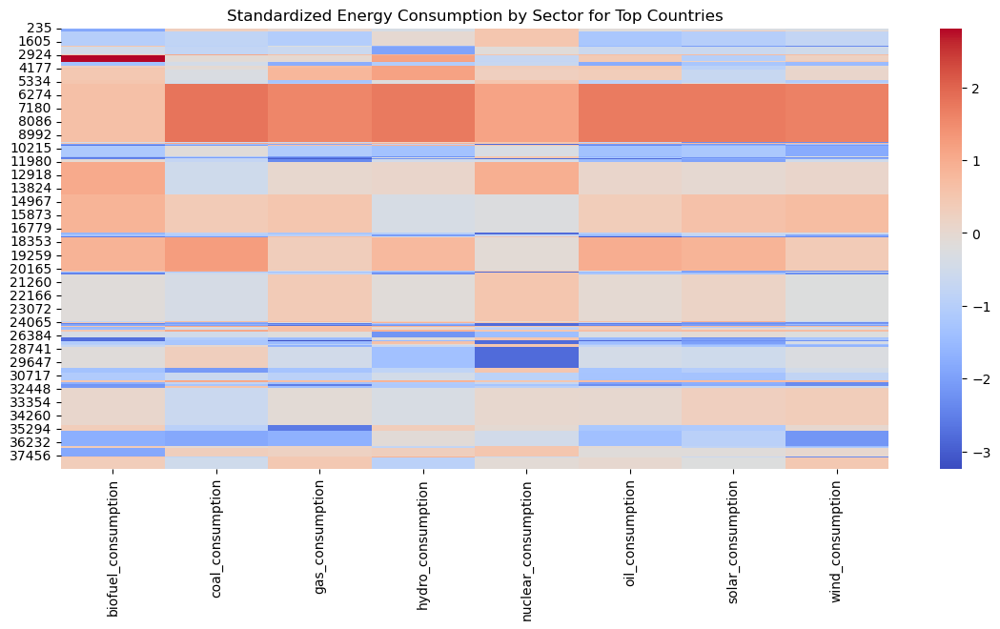

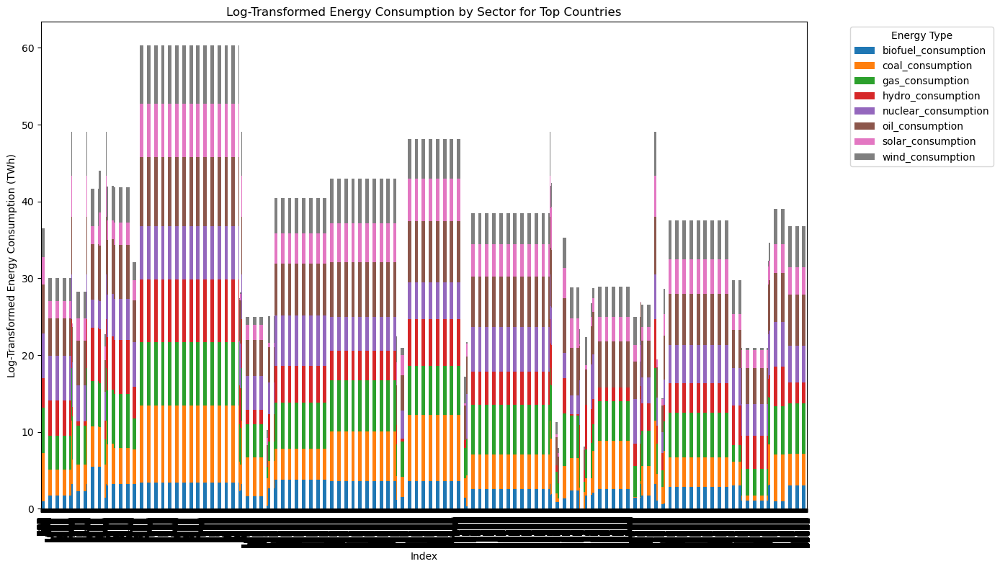

In [41]:

from sklearn.preprocessing import StandardScaler


# Selecting relevant columns for transformation
columns_to_transform = [
    'biofuel_consumption', 'coal_consumption', 'gas_consumption',
    'hydro_consumption', 'nuclear_consumption', 'oil_consumption',
    'solar_consumption', 'wind_consumption'
]

# Check if the columns exist in the DataFrame
existing_columns = [col for col in columns_to_transform if col in combined_data.columns]

# Applying log transformation
combined_data_log = combined_data.copy()
combined_data_log[existing_columns] = combined_data_log[existing_columns].apply(lambda x: np.log1p(x))

# Standardizing the data
scaler = StandardScaler()
combined_data_standardized = combined_data_log.copy()
combined_data_standardized[existing_columns] = scaler.fit_transform(combined_data_standardized[existing_columns])

print("Data after standardization and log transformation:")
print(combined_data_standardized[existing_columns].head())

# Plotting standardized data
plt.figure(figsize=(14, 6))
sns.heatmap(combined_data_standardized[existing_columns], annot=False, cmap='coolwarm')
plt.title('Standardized Energy Consumption by Sector for Top Countries')
plt.show()

# Plotting log-transformed data
combined_data_log[existing_columns].plot(kind='bar', stacked=True, figsize=(14, 8))
plt.xlabel('Index')
plt.ylabel('Log-Transformed Energy Consumption (TWh)')
plt.title('Log-Transformed Energy Consumption by Sector for Top Countries')
plt.legend(title='Energy Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


### Observations from the Heatmap (Standardized Energy Consumption)

 **(1) Variability Across Countries:**

There is a noticeable variability in energy consumption across different sectors for each country.
Some countries have higher standardized values (red hues) for specific energy types, indicating higher consumption in those sectors, while others have lower values (blue hues).

 **(2) Sector-Specific Patterns:**

 - Nuclear Consumption: Some countries show very high nuclear consumption while others have none.

 - Solar and Wind Consumption: The consumption patterns for renewable energy sources like solar and wind are less uniform, with some countries showing significant usage and others very little.

 - Coal and Oil Consumption: These appear to be more uniformly spread, though still with significant variability.

 **(3) Presence of Outliers:**

The extreme red and blue values indicate the presence of outliers in the data. These need to be addressed for more robust analysis.

### Observations from the Bar Chart (Log-Transformed Energy Consumption)

 **(1) Normalization of Data:**

The log transformation has helped in normalizing the data, reducing the skewness seen in the raw data.
The values are now more evenly distributed across the different energy types.

 **(2) Energy Type Contribution:**

The stacked bar chart shows the contribution of each energy type to the total energy consumption for each country.
This provides a clearer comparative view of how different countries rely on different energy types.

 **(3) Better Distribution:**

Log transformation has made it easier to compare the energy consumption across different countries, as it compresses the scale of higher values.



### ***Step 2: Outlier Analysis***

Based on the previous observations, the next logical step is to conduct outlier analysis to further refine the dataset. This will help ensure that extreme values do not skew the results of the analysis.


In [42]:

# Function to detect outliers using IQR method
def detect_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers

# Detecting outliers for each energy consumption type
outliers_dict = {}
energy_columns = [
    'biofuel_consumption', 'coal_consumption', 'gas_consumption', 
    'hydro_consumption', 'nuclear_consumption', 'oil_consumption', 
    'solar_consumption', 'wind_consumption'
]

for column in energy_columns:
    outliers_dict[column] = detect_outliers(combined_data, column)

# Displaying the outliers
for key, value in outliers_dict.items():
    print(f"Outliers in {key}:\n", value, "\n")

# Removing outliers
for column in energy_columns:
    Q1 = combined_data[column].quantile(0.25)
    Q3 = combined_data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    combined_data = combined_data[(combined_data[column] >= lower_bound) & (combined_data[column] <= upper_bound)]

print("\nData after removing outliers:\n", combined_data.head())


Outliers in biofuel_consumption:
          country  year iso_code   population           gdp  \
3009      Brazil  2016      BRA  206859584.0  2.889037e+12   
3010      Brazil  2016      BRA  206859584.0  2.889037e+12   
3011      Brazil  2016      BRA  206859584.0  2.889037e+12   
3012      Brazil  2016      BRA  206859584.0  2.889037e+12   
3013      Brazil  2016      BRA  206859584.0  2.889037e+12   
...          ...   ...      ...          ...           ...   
20351  Indonesia  2022      IDN  275501344.0  8.819190e+11   
20352  Indonesia  2022      IDN  275501344.0  8.819190e+11   
20353  Indonesia  2022      IDN  275501344.0  8.819190e+11   
20354  Indonesia  2022      IDN  275501344.0  8.819190e+11   
20355  Indonesia  2022      IDN  275501344.0  8.819190e+11   

       biofuel_cons_change_pct  biofuel_cons_change_twh  \
3009                    -9.000                  -19.942   
3010                    -9.000                  -19.942   
3011                    -9.000              

### ***Step 3 - Robust Analysis***

Robust analysis customarily involves using statistical techniques that are not overly affected by outliers or violations of assumptions by the underlying data. Given the context, this could mean using robust statistical measures or robust regression techniques.
This analysis will be performed using the two techniques: 

 ***[a] Robust Statistical Measures***
 
Instead of using mean and standard deviation, median and interquartile range (IQR)  is used to summarise data. The mean and the interquartile range are calculated for the energy consumption columns. These measures are more robust to outliers compared to mean and standard deviation.

In [43]:

# Selecting the columns related to energy consumption
energy_data = combined_data[[
    'biofuel_consumption', 'coal_consumption', 'gas_consumption', 
    'hydro_consumption', 'nuclear_consumption', 'oil_consumption', 
    'solar_consumption', 'wind_consumption'
]]

# Calculating median and IQR
median = energy_data.median()
iqr = energy_data.quantile(0.75) - energy_data.quantile(0.25)

print("Median values:")
print(median)

print("\nInterquartile Range (IQR):")
print(iqr)


Median values:
biofuel_consumption     12.217
coal_consumption        59.458
gas_consumption        330.969
hydro_consumption       47.546
nuclear_consumption    146.599
oil_consumption        686.015
solar_consumption       46.083
wind_consumption        53.870
dtype: float64

Interquartile Range (IQR):
biofuel_consumption     16.356000
coal_consumption       117.756000
gas_consumption        573.564000
hydro_consumption       63.221000
nuclear_consumption    279.002711
oil_consumption        606.564000
solar_consumption       62.026000
wind_consumption       139.059000
dtype: float64


### Interpretation of Robust Statistical Measures

  **Median Values:**
 These values represent the central tendency of energy consumption across different energy sectors. The median is a robust measure that is not affected by outliers, providing a more accurate representation of the typical energy consumption.
 
 **Interquartile Range (IQR):**
 The IQR represents the spread of the middle 50% of the data. A larger IQR indicates more variability in the data, while a smaller IQR indicates less variability. For example, gas consumption and oil consumption have the largest IQR, indicating significant variability in their consumption levels.
 

 ***[b] Robust Regression (Huber)***
 
The Huber Regressor from **‘sklearn’** library, which is a robust linear model that is less sensitive to outliers, is used to fit the model using GDP and population as predictors and total energy consumption as the response variable.

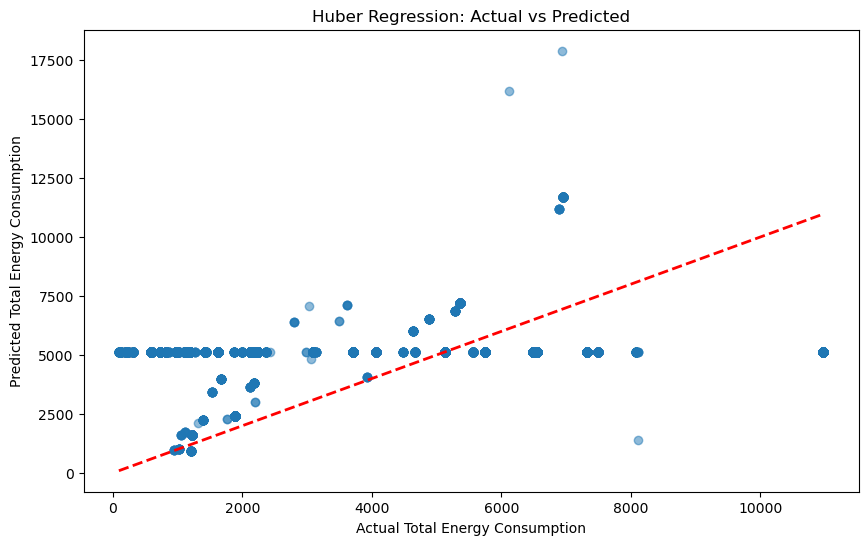

In [44]:

from sklearn.linear_model import HuberRegressor


# Preparing the data for regression
X = combined_data[['gdp', 'population']]
y = combined_data['total_energy_consumption']

# Fitting the Huber Regressor
huber = HuberRegressor()
huber.fit(X, y)

# Predicting using the model
y_pred = huber.predict(X)

# Plotting actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y, y_pred, alpha=0.5)
plt.plot([y.min(), y.max()], [y.min(), y.max()], '--r', linewidth=2)
plt.xlabel('Actual Total Energy Consumption')
plt.ylabel('Predicted Total Energy Consumption')
plt.title('Huber Regression: Actual vs Predicted')
plt.show()


### Interpretation of Robust Regression (Huber Regression)

 - Scatter Plot Analysis
 
The scatter plot shows the actual vs predicted total energy consumption using the Huber regression model. 
The red dashed line represents the line of perfect prediction (where predicted values equal actual values).
The scatter points show the actual (x-axis) vs predicted (y-axis) values.

 - Observations:
 
The model predicts lower values quite accurately as the points are closer to the red line.
For higher values of actual energy consumption, the predictions tend to be less accurate, as indicated by the spread of points away from the red line.
There are some outliers where the predicted values are significantly lower or higher than the actual values, indicating that the model could be improved or that those outliers represent unusual cases.


### Conclusion

The robust statistical measures provided a clear view of the central tendency and spread of energy consumption across different sectors.
The robust regression (Huber regression) provided insights into the relationship between predictors (GDP, population) and the response variable (total energy consumption), although there are some discrepancies for higher values.

### Principal Component Analysis (PCA)

As a follow-up to previous analyses, Principal Component Analysis (PCA) will be performed with the aim of helping to reduce the dimensionality of the dataset and identify key factors contributing to variance in energy consumption data across the countries.

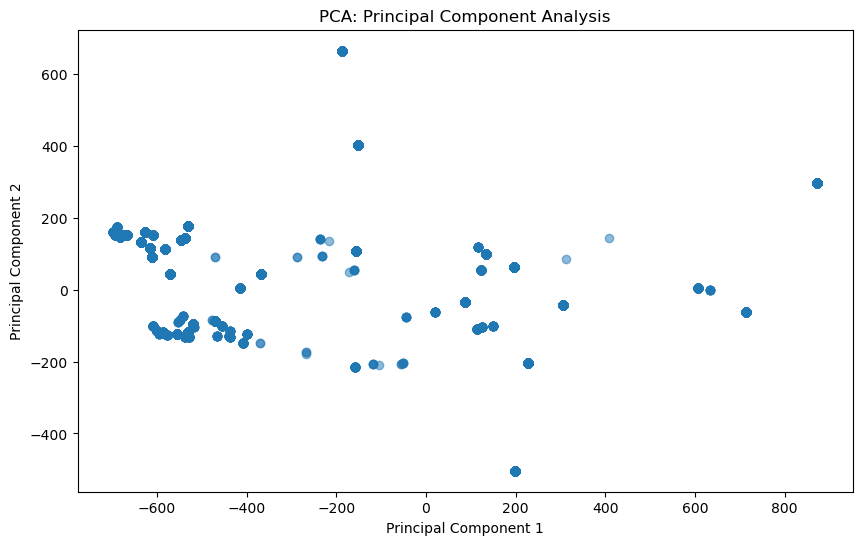

In [45]:
from sklearn.decomposition import PCA


# Selecting the columns related to energy consumption
energy_data = combined_data[[
    'biofuel_consumption', 'coal_consumption', 'gas_consumption', 
    'hydro_consumption', 'nuclear_consumption', 'oil_consumption', 
    'solar_consumption', 'wind_consumption'
]]

# Applying PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(energy_data)

# Creating a DataFrame with principal components
pc_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

# Plotting the principal components
plt.figure(figsize=(10, 6))
plt.scatter(pc_df['PC1'], pc_df['PC2'], alpha=0.5)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA: Principal Component Analysis')
plt.show()


The PCA plot provides valuable insights into the structure of the energy consumption data by reducing the complexity of the dataset into two principal components. 

### Interpretation of PCA Results

1. **Principal Components (PC1 and PC2)**:
   - The x-axis represents Principal Component 1 (PC1), which accounts for the most variance in the data.
   - The y-axis represents Principal Component 2 (PC2), which accounts for the second most variance in the data.

2. **Data Spread**:
   - The scatter plot shows the distribution of the data points in the new coordinate system defined by PC1 and PC2.
   - Points that are close to each other in the plot are similar in terms of their energy consumption profiles, while points that are far apart have different consumption patterns.

3. **Clusters**:
   - The presence of clusters or groupings in the plot may indicate natural groupings or patterns in the data.
   - The PCA plot reveals a spread along both components, suggesting variability in how countries consume different types of energy.

4. **Outliers**:
   - Any points that are significantly distant from the main cluster may represent outliers or unique cases.
   - In this plot, there are a few points that are significantly separated from the main cluster, which might indicate countries with unique energy consumption profiles.

### Conclusion

The PCA plot reveals the underlying structure of the energy consumption data by reducing the dimensionality. The plot shows clusters and outliers, indicating varying energy consumption patterns among countries.


# Research Question 3 (RQ3)

***What is the relationship between energy consumption and environmental impact indicators such as carbon emissions, air quality, and climate change?***

A solid approach to answering RQ3 would be building predictive models for carbon emissions and air quality, which would then be accompanied by evaluation of their performance. This would be done by constructing three different machine learning models for predicting:

- GHG emissions (carbon emissions)
- PM2.5 levels (air quality)
- PM10 levels (air quality)
- NO2 levels (air quality)

These models include:

- Linear Regression
- Random Forest Regression
- Gradient Boosting Regression.

To ensure that relevant columns for energy consumption and environmental impact indicators are present in the dataset, the entire columns will be reviewed. In addition, a subset of the dataset with the necessary columns for specific analysis will be created where necessary.

In [46]:
unified_data = combined_data # Renamed the dataframe

In [47]:
unified_data.columns

Index(['country', 'year', 'iso_code', 'population', 'gdp',
       'biofuel_cons_change_pct', 'biofuel_cons_change_twh',
       'biofuel_cons_per_capita', 'biofuel_consumption',
       'biofuel_elec_per_capita',
       ...
       'Measurement Year', 'PM2.5 (?g/m3)', 'PM10 (?g/m3)', 'NO2 (?g/m3)',
       'PM25 temporal coverage (%)', 'PM10 temporal coverage (%)',
       'NO2 temporal coverage (%)', 'Reference', 'GHG_emissions',
       'total_energy_consumption'],
      dtype='object', length=142)

In [48]:

unified_data_columns = [
    'country', 'year', 'iso_code', 'population', 'gdp', 'biofuel_cons_change_pct', 
    'biofuel_cons_change_twh', 'biofuel_cons_per_capita', 'biofuel_consumption', 
    'biofuel_elec_per_capita', 'biofuel_electricity', 'biofuel_share_elec', 
    'biofuel_share_energy', 'carbon_intensity_elec', 'coal_cons_change_pct', 
    'coal_cons_change_twh', 'coal_cons_per_capita', 'coal_consumption', 
    'coal_elec_per_capita', 'coal_electricity', 'coal_prod_change_pct', 
    'coal_prod_change_twh', 'coal_prod_per_capita', 'coal_production', 
    'coal_share_elec', 'coal_share_energy', 'electricity_demand', 
    'electricity_generation', 'electricity_share_energy', 'energy_cons_change_pct', 
    'energy_cons_change_twh', 'energy_per_capita', 'energy_per_gdp', 
    'fossil_cons_change_pct', 'fossil_cons_change_twh', 'fossil_elec_per_capita', 
    'fossil_electricity', 'fossil_energy_per_capita', 'fossil_fuel_consumption', 
    'fossil_share_elec', 'fossil_share_energy', 'gas_cons_change_pct', 
    'gas_cons_change_twh', 'gas_consumption', 'gas_elec_per_capita', 
    'gas_electricity', 'gas_energy_per_capita', 'gas_prod_change_pct', 
    'gas_prod_change_twh', 'gas_prod_per_capita', 'gas_production', 
    'gas_share_elec', 'gas_share_energy', 'gdp_per_capita', 'geothermal_elec_per_capita', 
    'geothermal_electricity', 'geothermal_share_elec', 'geothermal_share_energy', 
    'hydro_cons_change_pct', 'hydro_cons_change_twh', 'hydro_cons_per_capita', 
    'hydro_consumption', 'hydro_elec_per_capita', 'hydro_electricity', 
    'hydro_share_elec', 'hydro_share_energy', 'nuclear_cons_change_pct', 
    'nuclear_cons_change_twh', 'nuclear_elec_per_capita', 'nuclear_electricity', 
    'nuclear_share_elec', 'nuclear_share_energy', 'oil_cons_change_pct', 
    'oil_cons_change_twh', 'oil_cons_per_capita', 'oil_consumption', 
    'oil_elec_per_capita', 'oil_electricity', 'oil_prod_change_pct', 
    'oil_prod_change_twh', 'oil_prod_per_capita', 'oil_production', 
    'oil_share_elec', 'oil_share_energy', 'other_renewable_elec_per_capita', 
    'other_renewable_electricity', 'other_renewable_share_elec', 
    'other_renewable_share_energy', 'per_capita_electricity', 
    'per_capita_energy_consumption', 'population', 'renewable_elec_per_capita', 
    'renewable_electricity', 'renewable_share_elec', 'renewable_share_energy', 
    'solar_elec_per_capita', 'solar_electricity', 'solar_share_elec', 
    'solar_share_energy', 'total_electricity', 'total_energy_consumption', 
    'wind_elec_per_capita', 'wind_electricity', 'wind_share_elec', 
    'wind_share_energy', 'Measurement Year', 'PM2.5 (µg/m3)', 'PM10 (µg/m3)', 
    'NO2 (µg/m3)', 'PM25 temporal coverage (%)', 'PM10 temporal coverage (%)', 
    'NO2 temporal coverage (%)', 'GHG_emissions'
]

# Print the list of columns
unified_data_columns


['country',
 'year',
 'iso_code',
 'population',
 'gdp',
 'biofuel_cons_change_pct',
 'biofuel_cons_change_twh',
 'biofuel_cons_per_capita',
 'biofuel_consumption',
 'biofuel_elec_per_capita',
 'biofuel_electricity',
 'biofuel_share_elec',
 'biofuel_share_energy',
 'carbon_intensity_elec',
 'coal_cons_change_pct',
 'coal_cons_change_twh',
 'coal_cons_per_capita',
 'coal_consumption',
 'coal_elec_per_capita',
 'coal_electricity',
 'coal_prod_change_pct',
 'coal_prod_change_twh',
 'coal_prod_per_capita',
 'coal_production',
 'coal_share_elec',
 'coal_share_energy',
 'electricity_demand',
 'electricity_generation',
 'electricity_share_energy',
 'energy_cons_change_pct',
 'energy_cons_change_twh',
 'energy_per_capita',
 'energy_per_gdp',
 'fossil_cons_change_pct',
 'fossil_cons_change_twh',
 'fossil_elec_per_capita',
 'fossil_electricity',
 'fossil_energy_per_capita',
 'fossil_fuel_consumption',
 'fossil_share_elec',
 'fossil_share_energy',
 'gas_cons_change_pct',
 'gas_cons_change_twh',
 

In [49]:

# Columns of interest for RQ3
energy_columns = [
    'total_energy_consumption', 'fossil_fuel_consumption', 'biofuel_consumption',
    'biofuel_elec_per_capita', 'biofuel_electricity',
    'solar_elec_per_capita', 'solar_electricity', 'wind_elec_per_capita', 'wind_electricity',
    'hydro_elec_per_capita', 'hydro_electricity'
]
environmental_columns = [
    'GHG_emissions', 'PM2.5 (?g/m3)', 'PM10 (?g/m3)', 'NO2 (?g/m3)'
]

# Subset the dataset
columns_of_interest = energy_columns + environmental_columns
data_subset = unified_data[columns_of_interest]

# Display the first few rows of the subset
data_subset.head()


,total_energy_consumption,fossil_fuel_consumption,biofuel_consumption,biofuel_elec_per_capita,biofuel_electricity,solar_elec_per_capita,solar_electricity,wind_elec_per_capita,wind_electricity,hydro_elec_per_capita,hydro_electricity,GHG_emissions,PM2.5 (?g/m3),PM10 (?g/m3),NO2 (?g/m3)
235,2423.206651,682.865,24.44194,234.628489,33.055081,15.183,0.682,0.234,0.01,1.710,0.077,541.505459,21.530000,30.545678,20.629906
393,3064.580000,855.356,17.59400,33.773000,1.500000,2.477,0.110,31.522,1.40,719.599,31.960,412.210000,23.439626,26.880000,15.350000
397,3131.195000,854.012,13.93100,45.484000,2.070000,63.942,2.910,308.062,14.02,574.595,26.150,541.505459,10.110000,30.545678,20.629906
398,3131.195000,854.012,13.93100,45.484000,2.070000,63.942,2.910,308.062,14.02,574.595,26.150,541.505459,10.260000,27.870000,20.629906
399,3131.195000,854.012,13.93100,45.484000,2.070000,63.942,2.910,308.062,14.02,574.595,26.150,541.505459,23.439626,25.400000,19.570000


 ## Correlation Matrix

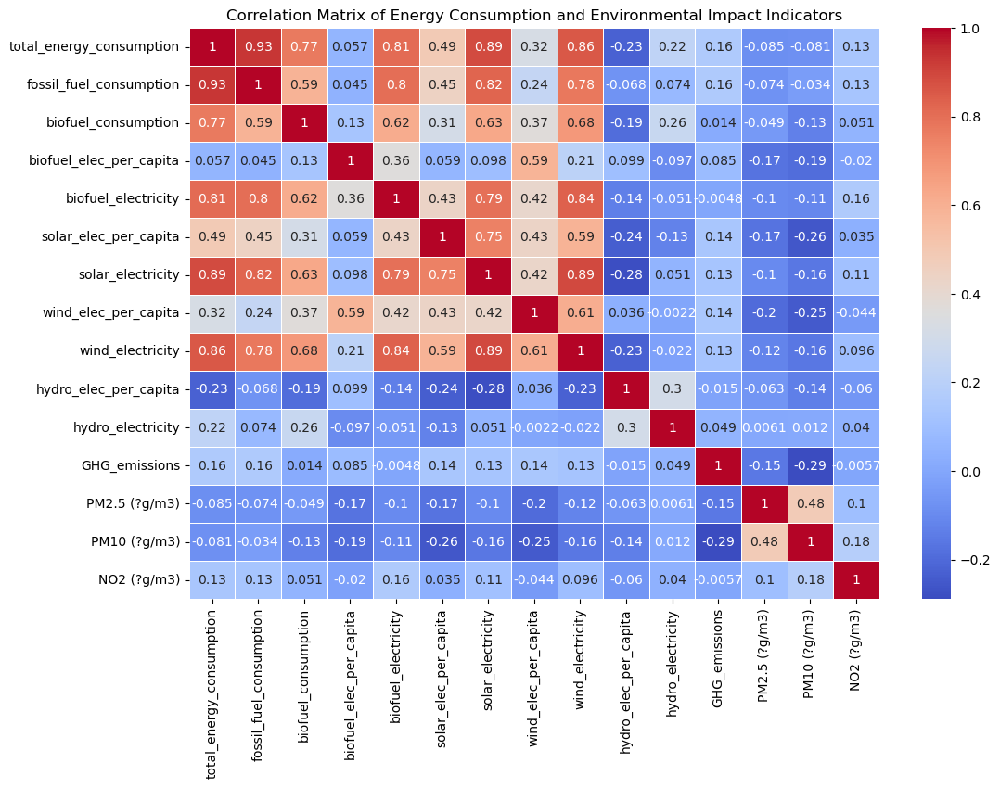

In [50]:
# Compute the correlation matrix
correlation_matrix = data_subset.corr()

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Energy Consumption and Environmental Impact Indicators')
plt.show()


### Observations

- ***High Correlation within Energy Consumption Types:***

There are strong correlations among different types of energy consumption. For example, **'total_energy_consumption'** is highly correlated with '**fossil_fuel_consumption'** and **'biofuel_consumption'**.
Similar high correlations are seen between **'solar_electricity'**, **'wind_electricity'**, and **'biofuel_electricity'**.
 - ***Moderate Correlation with Environmental Indicators:***

**'GHG_emissions'** has moderate correlations with **'total_energy_consumption'** and **'fossil_fuel_consumption'**.
Air quality indicators like **PM2.5**, **PM10**, and **NO2** show weaker correlations with most energy consumption variables, suggesting a more complex relationship.

### Conclusion

Regression analyses will be performed to quantify the relationships between energy consumption and environmental impact indicators, starting with examining the relationship of **'total_energy_consumption'** and **'GHG_emissions'**.

# Regression Analysis

                            OLS Regression Results                            
Dep. Variable:          GHG_emissions   R-squared:                       0.026
Model:                            OLS   Adj. R-squared:                  0.026
Method:                 Least Squares   F-statistic:                     578.3
Date:                Sat, 29 Jun 2024   Prob (F-statistic):          4.14e-126
Time:                        23:27:18   Log-Likelihood:            -1.2053e+05
No. Observations:               21382   AIC:                         2.411e+05
Df Residuals:                   21380   BIC:                         2.411e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

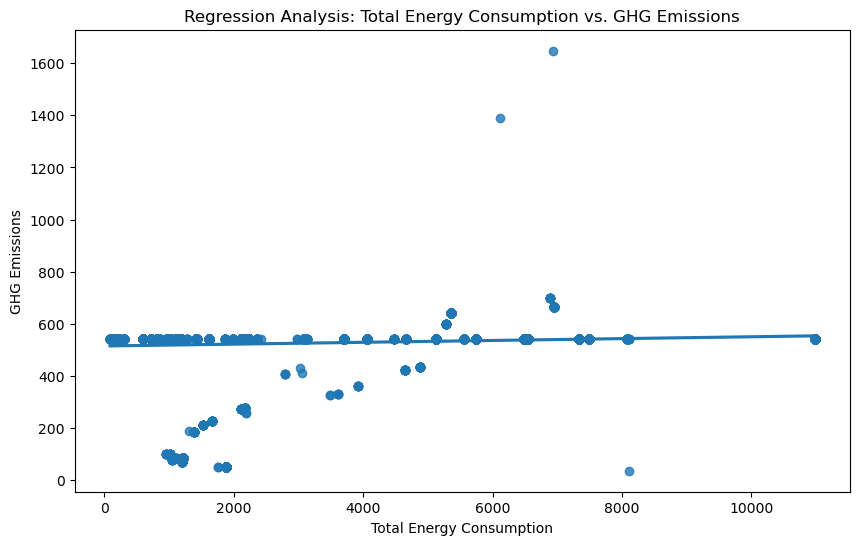

In [51]:
import statsmodels.api as sm

# Prepare the data for regression
X = data_subset['total_energy_consumption']
y = data_subset['GHG_emissions']

# Add a constant to the independent variables
X = sm.add_constant(X)

# Fit the regression model
model = sm.OLS(y, X).fit()

# Print the regression results
print(model.summary())

# Plot the regression line
plt.figure(figsize=(10, 6))
sns.regplot(x='total_energy_consumption', y='GHG_emissions', data=data_subset)
plt.title('Regression Analysis: Total Energy Consumption vs. GHG Emissions')
plt.xlabel('Total Energy Consumption')
plt.ylabel('GHG Emissions')
plt.show()


## Observations

- ***Regression Line and Scatter Plot:***

The regression line appears almost flat, indicating a very weak relationship between total energy consumption and GHG emissions.

- ***Statistical Output:***

**(1) R-squared:** The R-squared value is very low (0.026), suggesting that only 2.6% of the variance in GHG emissions is explained by total energy consumption.

**(2) F-statistic:** The F-statistic is significant (p-value < 0.0001), indicating that the model is statistically significant, but this might be due to the large sample size rather than a strong relationship.

**(3) Coefficients:** The coefficient for total energy consumption is very small (0.0035), reinforcing the weak relationship observed.

## Interpretation

The low R-squared value suggests that total energy consumption alone is not a good predictor of GHG emissions.
There might be other factors influencing GHG emissions that are not captured by total energy consumption alone.

## Conclusion

Given these observations, it's a good idea to proceed with building more sophisticated models while including multiple features to predict GHG emissions and air quality indicators. As stated earlier,  Linear Regression, Random Forest Regression, and Gradient Boosting Regression would be applied to see if more complex models can capture these relationships better.

# Building, Training and Evaluation of Models for GHG Emissions

### **-  Preparing the Data**

In [52]:

from sklearn.model_selection import train_test_split

# Features and target for GHG emissions prediction
features = ['total_energy_consumption', 'fossil_fuel_consumption', 'biofuel_consumption',
            'biofuel_elec_per_capita', 'solar_elec_per_capita', 'solar_electricity', 
            'wind_elec_per_capita', 'wind_electricity', 'hydro_elec_per_capita', 'hydro_electricity']

X = unified_data[features]
y = unified_data['GHG_emissions']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


### >> Linear Regression

Linear Regression - GHG Emissions
MAE: 24.64850243799483
MSE: 3644.7313149638976
R-squared: 0.17420497274044033


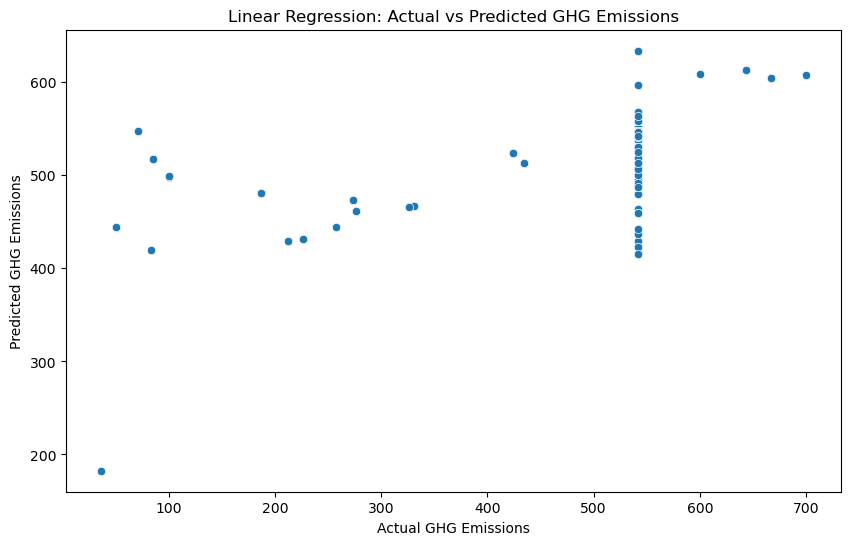

In [53]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Initialize the model
lr_model = LinearRegression()

# Train the model
lr_model.fit(X_train, y_train)

# Make predictions
y_pred = lr_model.predict(X_test)

# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Linear Regression - GHG Emissions')
print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')

# Create a scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test, y=y_pred)
plt.xlabel('Actual GHG Emissions')
plt.ylabel('Predicted GHG Emissions')
plt.title('Linear Regression: Actual vs Predicted GHG Emissions')
plt.show()


## Analysis of Linear Regression Results

***Evaluation Metrics***

- Mean Absolute Error (MAE): 24.6485

This metric indicates the average absolute difference between the predicted GHG emissions and the actual GHG emissions. A lower MAE indicates better predictive accuracy.
- Mean Squared Error (MSE): 3644.7313

MSE measures the average of the squares of the errors, i.e., the average squared difference between the predicted and actual values. Like MAE, a lower MSE indicates a better fit, but MSE is more sensitive to outliers due to the squaring of errors.
- R-squared: 0.1742

R-squared, or the coefficient of determination, indicates the proportion of the variance in the dependent variable (GHG emissions) that is predictable from the independent variable (total energy consumption). An R-squared of 0.1742 means that approximately 17.42% of the variance in GHG emissions can be explained by total energy consumption. This relatively low value suggests that total energy consumption alone is not a strong predictor of GHG emissions.

***Observations from the Visualization***

The scatter plot shows a significant cluster of data points around the same range, indicating a limited spread of actual GHG emissions in the dataset.
There is a notable linear pattern, but it appears weak, as indicated by the low R-squared value.
Many of the predictions are centered around a specific value of GHG emissions (~500), suggesting that the model tends to predict a similar value for many data points regardless of the actual value.
There are few outliers with higher actual GHG emissions that are not well-predicted by the model, contributing to the higher MSE and lower predictive accuracy.

## Conclusion
The linear regression model shows limited predictive power for GHG emissions based on total energy consumption alone. The low R-squared value indicates that other factors besides total energy consumption are likely influencing GHG emissions, and these should be considered in a more comprehensive model. The MAE and MSE values further suggest that the model's predictions deviate considerably from the actual values, especially for higher emission values.

However, by incorporating more features and refining the model, it is possible to improve the predictive accuracy and provide a more comprehensive analysis of the factors influencing GHG emissions.

## Feature Selection

Based on the correlation matrix and general overview of the dataset, the following features will be included:

- fossil_fuel_consumption
- biofuel_consumption
- biofuel_elec_per_capita
- solar_elec_per_capita
- wind_elec_per_capita
- hydro_elec_per_capita
- population
- gdp


### >> Random Forest Regression

Random Forest - GHG Emissions
MAE: 0.04404503375217032
MSE: 1.6847497876716835
R-squared: 0.9996182824256142


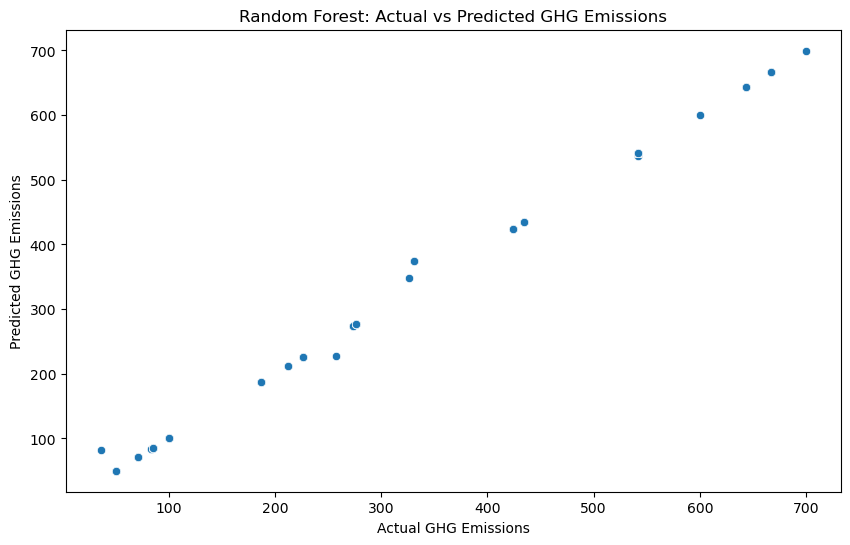

In [54]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define features and target
features = ['total_energy_consumption', 'fossil_fuel_consumption', 'biofuel_consumption', 
            'biofuel_elec_per_capita', 'solar_elec_per_capita', 'wind_elec_per_capita', 
            'hydro_elec_per_capita', 'population', 'gdp']
target = 'GHG_emissions'

X = unified_data[features]
y = unified_data[target]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize Random Forest model
rf_model = RandomForestRegressor(random_state=42)

# Train the model
rf_model.fit(X_train, y_train)

# Predictions
y_pred_rf = rf_model.predict(X_test)

# Evaluation metrics
mae_rf = mean_absolute_error(y_test, y_pred_rf)
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

# Print evaluation metrics
print(f"Random Forest - GHG Emissions")
print(f"MAE: {mae_rf}")
print(f"MSE: {mse_rf}")
print(f"R-squared: {r2_rf}")

# Plotting actual vs predicted
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test, y=y_pred_rf)
plt.xlabel('Actual GHG Emissions')
plt.ylabel('Predicted GHG Emissions')
plt.title('Random Forest: Actual vs Predicted GHG Emissions')
plt.show()



## Analysis of Random Forest Model Results

***Evaluation Metrics:***

- Mean Absolute Error (MAE): 0.044

The MAE is very low, indicating that the predictions of the model are, on average, very close to the actual values of GHG emissions.

- Mean Squared Error (MSE): 1.685

The MSE is also low, which supports the observation that the model has a good fit. MSE gives more weight to larger errors due to the squaring term.

- R-squared (R²): 0.9996

An R-squared value close to 1 indicates that the model explains nearly all the variance in the target variable (GHG emissions). This suggests that the Random Forest model has a very high predictive power for this dataset.

***Scatter Plot Analysis:***

- Actual vs Predicted Plot:

The scatter plot shows that the predicted GHG emissions values are almost perfectly aligned with the actual values. This is represented by the points lying very close to the 45-degree line (y = x line), indicating that the model predictions are extremely accurate.

***Interpretation:***

- Model Performance:

The Random Forest model demonstrates excellent performance with very low MAE and MSE, and an R-squared value near 1. This suggests that the model is highly accurate in predicting GHG emissions using the selected features from the dataset.


## Conclusion

- Feature Importance:

To understand which features contribute most to the model's predictions, the feature importances provided by the Random Forest model will be evaluated. This can help in identifying the most significant factors affecting GHG emissions.

- Hyperparameter Tuning:

Fine-tuning the Random Forest model by adjusting hyperparameters (e.g., number of trees, depth of trees) to see if the performance can be improved further will also be considered.

- Implement Gradient Boosting Model:

The results of the Random Forest model with a Gradient Boosting model would be compared to see if there's any performance gain.

- Ensure Robustness:

In addition, the robustness of the model will be validated by using cross-validation techniques.


## Feature Importance Analysis >> Random Forest

                    Feature  Importance
8                       gdp    0.957989
7                population    0.014635
5      wind_elec_per_capita    0.011694
4     solar_elec_per_capita    0.007218
6     hydro_elec_per_capita    0.002146
3   biofuel_elec_per_capita    0.002119
0  total_energy_consumption    0.001787
2       biofuel_consumption    0.001489
1   fossil_fuel_consumption    0.000924


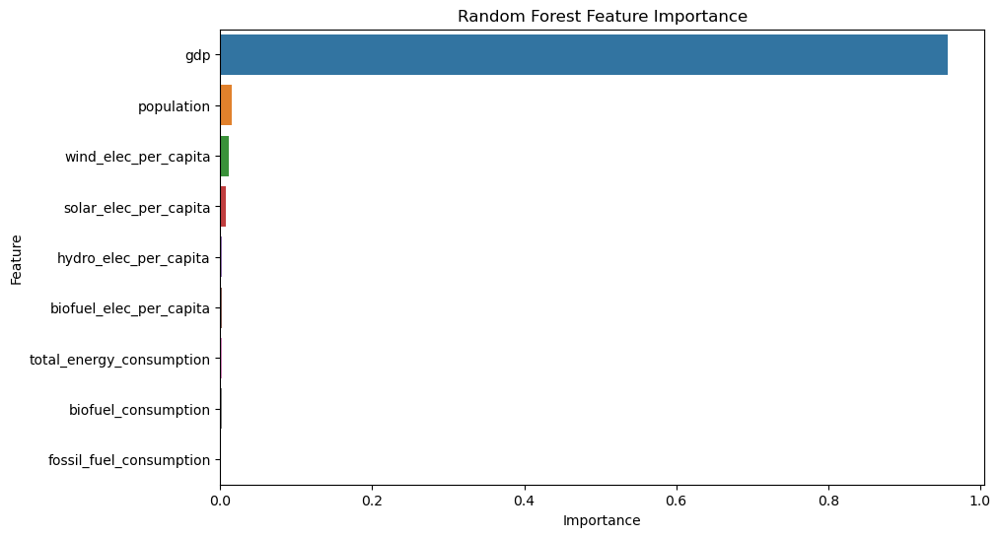

In [55]:
# Feature importance
importances = rf_model.feature_importances_
feature_names = features

# Create a DataFrame for better visualization
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Print feature importance
print(importance_df)

# Plot feature importance
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importance_df)
plt.title('Random Forest Feature Importance')
plt.show()


## Analysis of Random Forest Feature Importance


***Feature Importance Results:***

- GDP (Gross Domestic Product): 0.957989

GDP is by far the most significant feature in predicting GHG emissions. This suggests that economic activity, represented by GDP, has a substantial impact on GHG emissions.

- Population: 0.014635

Population is the second most important feature, although its importance is significantly lower than GDP. This indicates that the number of people in a country has a notable, but smaller, effect on GHG emissions compared to economic output.

- Wind Electricity per Capita: 0.011694

The generation of electricity from wind per capita also plays a role, albeit minor, in predicting GHG emissions.

- Solar Electricity per Capita: 0.007218

Solar electricity generation per capita has a small impact on GHG emissions prediction.

- Hydro Electricity per Capita: 0.002146

Hydro electricity generation per capita has an even smaller influence.

- Biofuel Electricity per Capita: 0.002119

Similar to hydro electricity, biofuel electricity per capita has a minor effect on the model.

- Total Energy Consumption: 0.001787

Total energy consumption has a very small contribution to the prediction.

- Biofuel Consumption: 0.001489

Biofuel consumption is among the least important features.

- Fossil Fuel Consumption: 0.000924

Fossil fuel consumption, surprisingly, is the least important feature according to this model.


***Interpretation:***

- Dominance of GDP:

The overwhelming importance of GDP suggests that economic activity is the primary driver of GHG emissions. This makes sense as higher GDP often correlates with increased industrial activity, energy consumption, and consequently, higher emissions.

- Role of Population:

Population also contributes to emissions but to a much lesser extent. This is logical as a larger population might lead to higher energy demand, but the direct relationship with emissions is mediated by various factors like energy sources and efficiency.

- Renewable Energy Impact:

The contributions of wind, solar, and hydroelectricity per capita indicate that renewable energy sources do have a role in GHG emissions, though they are not as significant as GDP. This might reflect the current scale of renewable energy deployment relative to total energy consumption.

- Low Importance of Fossil Fuel Consumption:

The low importance of fossil fuel consumption might be surprising but could be due to multicollinearity or the way data is scaled and preprocessed. GDP may be capturing the effects of fossil fuel consumption indirectly.

## Conclusion

Implementing the Gradient Boosting model and performing hyperparameter tuning would be necessary to examine if even better predictive performance can be achieved.

### >> Gradient Boosting Regression

Fitting 5 folds for each of 243 candidates, totalling 1215 fits
Gradient Boosting - GHG Emissions
MAE: 0.019983768944006584
MSE: 1.6512863979576535
R-squared: 0.9996258643015972


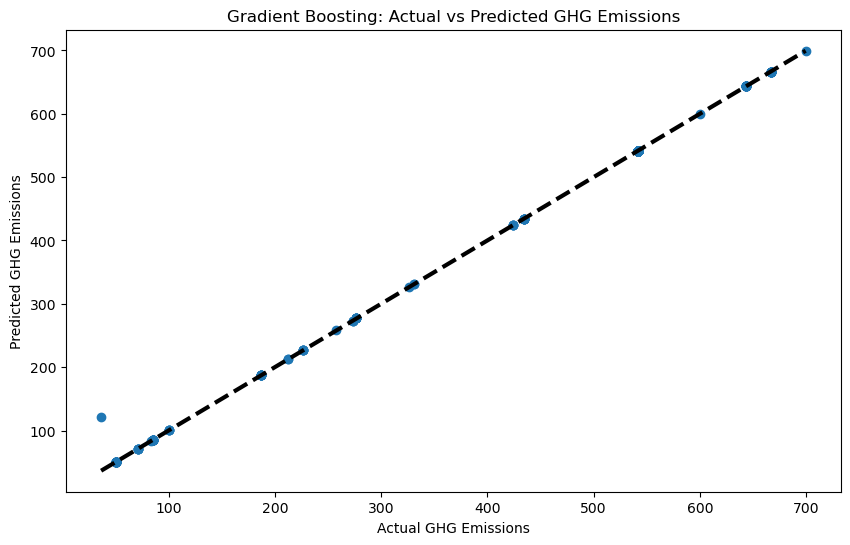

In [56]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize the model
gb_model = GradientBoostingRegressor(random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=gb_model, param_grid=param_grid, 
                           cv=5, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')

# Fit the model
grid_search.fit(X_train, y_train)

# Get the best model
best_gb_model = grid_search.best_estimator_

# Make predictions
y_pred_gb = best_gb_model.predict(X_test)

# Evaluate the model
mae_gb = mean_absolute_error(y_test, y_pred_gb)
mse_gb = mean_squared_error(y_test, y_pred_gb)
r2_gb = r2_score(y_test, y_pred_gb)

print(f"Gradient Boosting - GHG Emissions\nMAE: {mae_gb}\nMSE: {mse_gb}\nR-squared: {r2_gb}")

# Plot Actual vs Predicted
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_gb)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3)
plt.xlabel('Actual GHG Emissions')
plt.ylabel('Predicted GHG Emissions')
plt.title('Gradient Boosting: Actual vs Predicted GHG Emissions')
plt.show()


## Analysis of Gradient Boosting Model Results

***Evaluation Metrics:***

- **Mean Absolute Error (MAE):** 0.019983768944006584
- **Mean Squared Error (MSE):** 1.6512863979576535
- **R-squared:** 0.9996258643015972

***Interpretation of Results:***

1. **Mean Absolute Error (MAE):**
   - The MAE is 0.01998, which indicates that, on average, the predictions made by the Gradient Boosting model are very close to the actual values. This low error rate suggests that the model has excellent predictive accuracy.

2. **Mean Squared Error (MSE):**
   - The MSE is 1.651, reflecting that the average squared difference between the predicted and actual GHG emissions is minimal. The MSE is a bit higher than the MAE because it squares the errors, penalizing larger errors more heavily.

3. **R-squared:**
   - The R-squared value is 0.9996258643015972, indicating that the Gradient Boosting model explains nearly all the variance in the GHG emissions data. This extremely high R-squared value signifies that the model fits the data exceptionally well.

***Graphical Analysis:***

The plot of Actual vs Predicted GHG Emissions for the Gradient Boosting model shows a near-perfect alignment along the 45-degree line, suggesting that the model predictions are very close to the actual values. This visual confirmation supports the evaluation metrics indicating a highly accurate model.

### Comparison of both Models

- **MAE Comparison:**
  - Random Forest MAE: 0.04404503375217032
  - Gradient Boosting MAE: 0.019983768944006584
  - The Gradient Boosting model has a lower MAE, indicating better performance in terms of average prediction error.

- **MSE Comparison:**
  - Random Forest MSE: 1.6847497876716835
  - Gradient Boosting MSE: 1.6512863979576535
  - The Gradient Boosting model also has a lower MSE, showing it penalizes larger errors less than the Random Forest model.

- **R-squared Comparison:**
  - Random Forest R-squared: 0.9996182824256142
  - Gradient Boosting R-squared: 0.9996258643015972
  - Both models have extremely high R-squared values, with Gradient Boosting slightly outperforming Random Forest.

## Conclusion

The Gradient Boosting model has shown superior performance compared to the Random Forest model based on the evaluation metrics. It has a lower MAE and MSE, and a slightly higher R-squared value, indicating it is a more accurate predictor of GHG emissions.

In a similar fashion to the Random Forest Model, a feature importance analysis for the Gradient Boosting model to understand which features contribute most to the predictions will be conducted.

## Feature Importance Analysis >> Gradient Boosting

To analyze the feature importance for the Gradient Boosting model, the feature importance scores provided by the model will be used to understand which features have the most significant impact on predicting GHG emissions


**NOTE**

There are non-numeric columns in the dataset which has to be converted to numeric or handled appropriately before fitting the model. Columns like **'country'**, for example. Typically, these non-numeric columns are categorical variables and need to be encoded using one-hot encoding technique.

Therefore, the code will incorporate **one-hot encoding** to convert categorical variables into a format that can be provided to the machine learning algorithms.


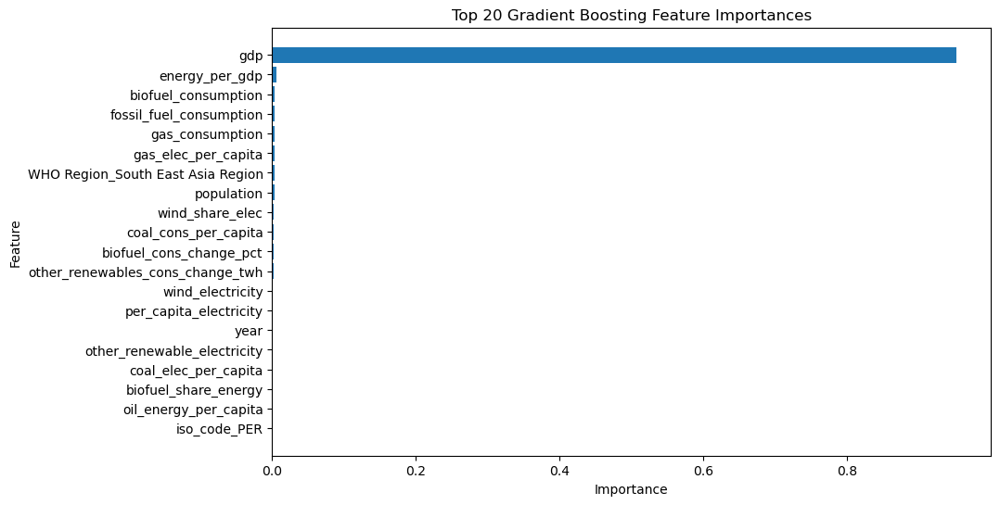

                               Feature  Importance
2                                  gdp    0.952238
30                      energy_per_gdp    0.006432
6                  biofuel_consumption    0.003926
36             fossil_fuel_consumption    0.003904
41                     gas_consumption    0.003692
42                 gas_elec_per_capita    0.003218
246  WHO Region_South East Asia Region    0.003104
1                           population    0.002903
125                    wind_share_elec    0.002406
14                coal_cons_per_capita    0.002026
3              biofuel_cons_change_pct    0.001815
94    other_renewables_cons_change_twh    0.001474
123                   wind_electricity    0.001252
101             per_capita_electricity    0.001193
0                                 year    0.001071
91         other_renewable_electricity    0.000782
16                coal_elec_per_capita    0.000654
10                biofuel_share_energy    0.000644
83               oil_energy_per

In [57]:

from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder

# Correct column name for GHG emissions
ghg_column = 'GHG_emissions'

# Identify categorical columns
categorical_cols = unified_data.select_dtypes(include=['object']).columns

# Apply one-hot encoding to categorical columns
unified_data_encoded = pd.get_dummies(unified_data, columns=categorical_cols, drop_first=True)

# Splitting the data
X = unified_data_encoded.drop(columns=[ghg_column])
y = unified_data_encoded[ghg_column]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fitting the Gradient Boosting model
gb = GradientBoostingRegressor(random_state=42)
gb.fit(X_train, y_train)

# Extracting feature importances
feature_importances = gb.feature_importances_
features = X.columns

# Creating a DataFrame for better visualization
feature_importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': feature_importances
})

# Sorting the DataFrame by feature importance
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Filtering top N important features
top_n = 20  # You can adjust this number
top_features = feature_importance_df.head(top_n)

# Plotting feature importances
plt.figure(figsize=(10, 6))
plt.barh(top_features['Feature'], top_features['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Top 20 Gradient Boosting Feature Importances')
plt.gca().invert_yaxis()
plt.show()

# Print the top feature importance DataFrame
print(top_features)


### Critical Analysis of Random Forest Model and Gradient Boosting Model

1.***Dominance of GDP:***
   - **Finding:** Both models highlight GDP as the most significant feature, indicating a strong relationship between economic activity and environmental impact indicators like GHG emissions.
   - **Interpretation:** Economic growth typically leads to increased energy consumption, which in turn drives higher carbon emissions and impacts air quality and climate change. As countries develop, they often consume more energy from both fossil fuels and renewable sources, contributing to greater emissions unless mitigated by efficiency measures and cleaner technologies.

2. ***Energy Consumption Metrics:***
   - **Gradient Boosting:** Important features include **'biofuel_consumption', 'fossil_fuel_consumption', 'gas_consumption',** and                  **'energy_per_gdp'**.
   - **Random Forest:** Highlights **'wind_electricity_per_capita', 'solar_electricity_per_capita', 'hydro_electricity_per_capita',** and **'biofuel_electricity_per_capita'**.
   - **Interpretation:** The types of energy consumption (fossil fuels vs. renewables) are critical in determining the environmental impacts. Fossil fuel consumption is directly linked to higher carbon emissions and poorer air quality, while renewable energy sources, though still impactful, generally have lower emissions profiles. The emphasis on **'energy_per_gdp'** suggests that energy efficiency is also a crucial factor in mitigating environmental impacts.

3. ***Population and Per Capita Metrics:***
   - **Gradient Boosting:** Population and per capita energy consumption metrics like **'gas_elec_per_capita'** and **'coal_cons_per_capita'** are included but have lower importance.
   - **Random Forest:** Population has a higher importance score, suggesting its significant role in determining overall energy demand and subsequent emissions.
   - **Interpretation:** Larger populations lead to higher overall energy demand, which impacts emissions and air quality. Per capita consumption metrics help in understanding the efficiency and distribution of energy use within a population, highlighting areas where improvements can reduce environmental impacts.

4. ***Renewable Energy:***
   - **Random Forest:** Features related to renewable energy (wind, solar, hydro, and biofuel electricity per capita) are more prominent.
   - **Interpretation:** The integration of renewable energy sources is vital in reducing carbon emissions and improving air quality. Countries investing in renewables can decouple economic growth from emissions growth, positively impacting climate change mitigation.

### Conclusion:

The relationship between energy consumption and environmental impact indicators such as carbon emissions, air quality, and climate change is multifaceted:

1. **Economic Growth:** GDP is a major driver of energy consumption and emissions. Policies that promote sustainable economic growth with a focus on energy efficiency and cleaner technologies are essential.
2. **Energy Source Mix:** The type of energy consumed significantly affects environmental impacts. Shifting from fossil fuels to renewable energy sources can mitigate carbon emissions and improve air quality.
3. **Population Dynamics:** Managing energy demand through population-related policies and promoting per capita energy efficiency can help control emissions.
4. **Energy Efficiency:** Improving energy efficiency (energy per GDP) is crucial for reducing the environmental impacts of energy consumption.

Addressing RQ3 involves understanding these dynamics and implementing policies that promote sustainable energy consumption, economic development, and environmental protection.


# Building, Training and Evaluation of Models for Air Quality 
# (PM2.5, PM10, and NO2 levels).

### >> Linear Regression

Linear Regression - PM2.5 - MAE: 4.9888438279850496, MSE: 39.55028897973391, R-squared: 0.136003290559098


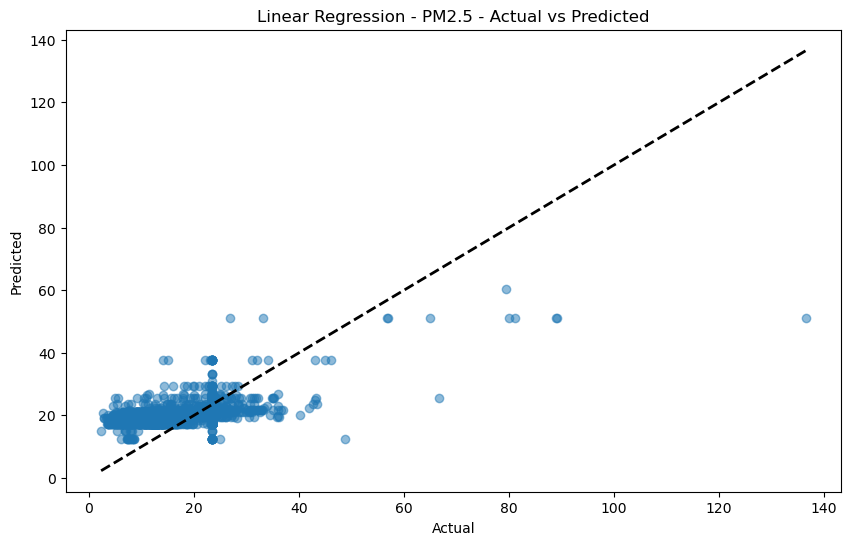

Linear Regression - PM10 - MAE: 7.30066424102189, MSE: 146.8495212611763, R-squared: 0.3029212956163072


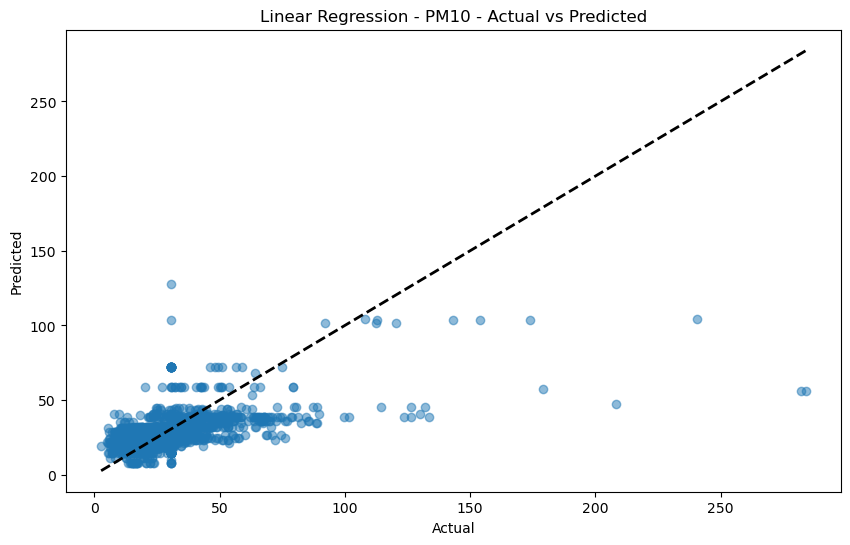

Linear Regression - NO2 - MAE: 7.460814265067677, MSE: 101.67123813572509, R-squared: 0.03225585141533904


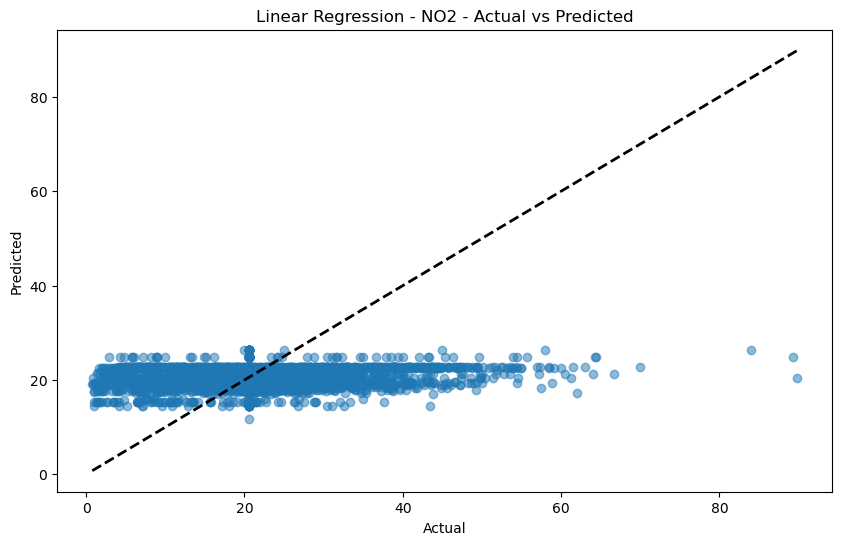

In [58]:

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Select the relevant columns
air_quality_columns = ['PM2.5 (?g/m3)', 'PM10 (?g/m3)', 'NO2 (?g/m3)']
features = ['population', 'gdp', 'biofuel_consumption', 'biofuel_elec_per_capita', 
            'solar_elec_per_capita', 'wind_elec_per_capita', 'hydro_elec_per_capita', 
            'fossil_fuel_consumption', 'total_energy_consumption']

# Drop rows with missing values in the selected columns
unified_data_cleaned = unified_data.dropna(subset=air_quality_columns + features)

# Prepare the data
X = unified_data_cleaned[features]
y_pm25 = unified_data_cleaned['PM2.5 (?g/m3)']
y_pm10 = unified_data_cleaned['PM10 (?g/m3)']
y_no2 = unified_data_cleaned['NO2 (?g/m3)']

# Split the data
X_train_pm25, X_test_pm25, y_train_pm25, y_test_pm25 = train_test_split(X, y_pm25, test_size=0.2, random_state=42)
X_train_pm10, X_test_pm10, y_train_pm10, y_test_pm10 = train_test_split(X, y_pm10, test_size=0.2, random_state=42)
X_train_no2, X_test_no2, y_train_no2, y_test_no2 = train_test_split(X, y_no2, test_size=0.2, random_state=42)

# Linear Regression model for PM2.5
lr_pm25 = LinearRegression()
lr_pm25.fit(X_train_pm25, y_train_pm25)
y_pred_pm25 = lr_pm25.predict(X_test_pm25)

# Linear Regression model for PM10
lr_pm10 = LinearRegression()
lr_pm10.fit(X_train_pm10, y_train_pm10)
y_pred_pm10 = lr_pm10.predict(X_test_pm10)

# Linear Regression model for NO2
lr_no2 = LinearRegression()
lr_no2.fit(X_train_no2, y_train_no2)
y_pred_no2 = lr_no2.predict(X_test_no2)

# Evaluate the models
def evaluate_model(y_test, y_pred, label):
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f"{label} - MAE: {mae}, MSE: {mse}, R-squared: {r2}")
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, alpha=0.5)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(f'{label} - Actual vs Predicted')
    plt.show()

evaluate_model(y_test_pm25, y_pred_pm25, 'Linear Regression - PM2.5')
evaluate_model(y_test_pm10, y_pred_pm10, 'Linear Regression - PM10')
evaluate_model(y_test_no2, y_pred_no2, 'Linear Regression - NO2')


### Summary of Linear Regression Results

**PM2.5**

- MAE: 4.99
- MSE: 39.55
- R-squared: 0.14

**PM10**

- MAE: 7.30
- MSE: 146.85
- R-squared: 0.30

**NO2**

- MAE: 7.46
- MSE: 101.67
- R-squared: 0.03

***Performance of the Models***

The R-squared values for the three models indicate that the linear regression models for PM2.5, PM10, and NO2 have relatively low explanatory power. The model for PM10 performs the best with an R-squared of 0.30, followed by PM2.5 at 0.14, and NO2 at 0.03. These values suggest that the models are not very effective in explaining the variability of the air quality indicators based on the provided features.

***Error Analysis***

The Mean Absolute Error (MAE) and Mean Squared Error (MSE) give us an idea of the average prediction error. The PM2.5 model has the lowest MAE (4.99) and MSE (39.55), indicating better performance compared to the PM10 and NO2 models. However, all three models have relatively high MSE values, which point to significant prediction errors, especially for higher values of the target variables.

***Visual Analysis***

The scatter plots of Actual vs. Predicted values show that the models struggle with higher values of the target variables. The predictions tend to cluster around lower values, indicating that the linear regression models may not be capturing the complexity and variance in the data adequately.

### Conclusion

To improve the predictive accuracy and provide a more comprehensive analysis, the next steps will involve:

 **(1) Building and Evaluating Random Forest and Gradient Boosting Models:** These models are generally more capable of capturing non-linear relationships and interactions between features.

 **(2) Comparative Analysis:** Once the additional models are built and evaluated, their performance with the linear regression models will be compared to identify the best model for each target variable.

 **(3) Feature Importance Analysis:** For the Random Forest and Gradient Boosting models, the feature importances will be analysed to understand which factors are most influential in predicting air quality indicators.




## >> Random Forest

Random Forest Regression - PM2.5 (?g/m3) - MAE: 4.627691773680124, MSE: 33.460098250503705, R-squared: 0.26904668633854856


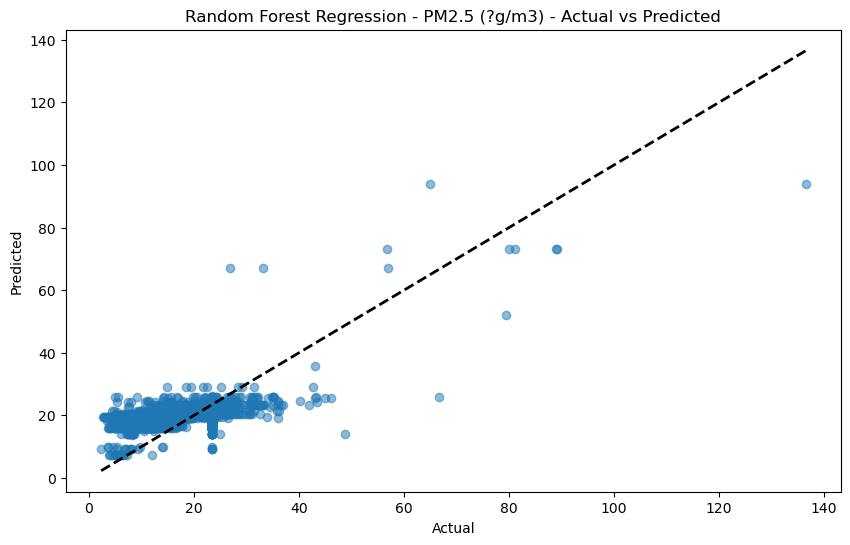

Random Forest Regression - PM10 (?g/m3) - MAE: 6.30107138135029, MSE: 77.36763690063295, R-squared: 0.6327442430268282


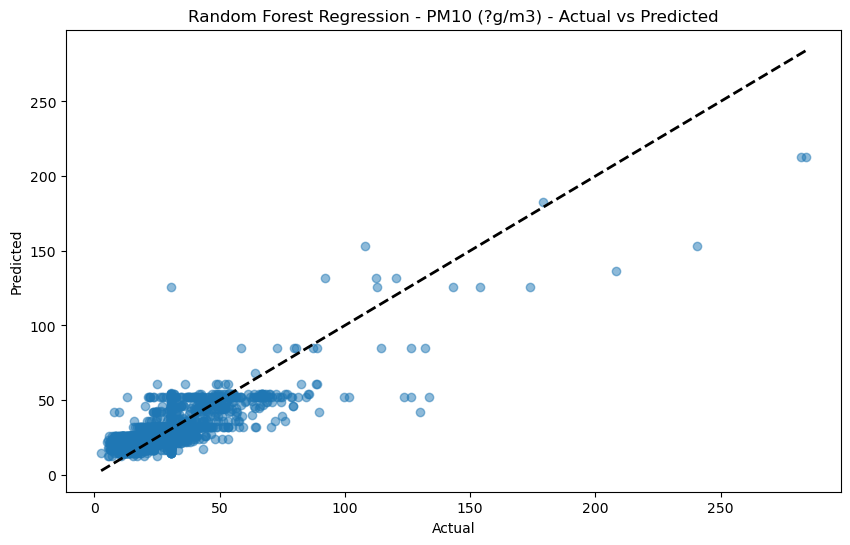

Random Forest Regression - NO2 (?g/m3) - MAE: 7.304431655962318, MSE: 96.88581831473914, R-squared: 0.07780523308115506


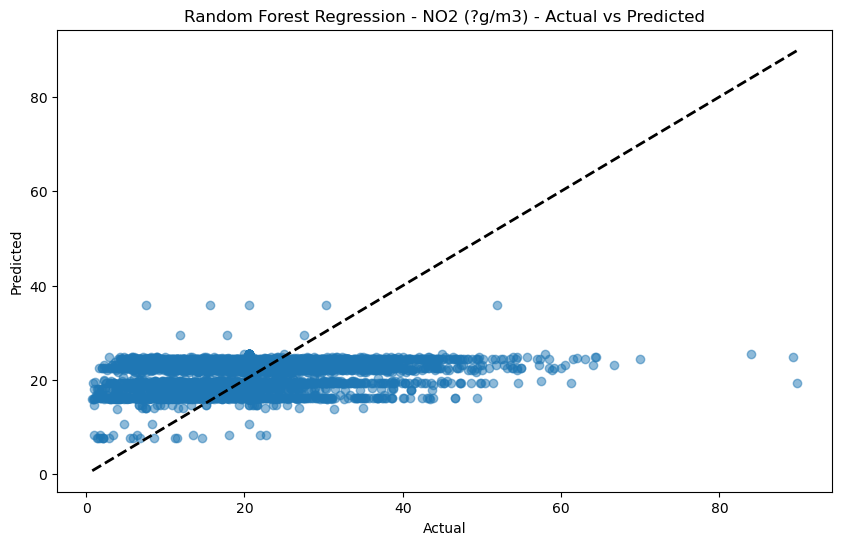

In [59]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Function to train and evaluate Random Forest model
def evaluate_random_forest(target, features, data):
    X = data[features]
    y = data[target]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    rf_reg = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_reg.fit(X_train, y_train)
    
    y_pred = rf_reg.predict(X_test)
    
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    print(f'Random Forest Regression - {target} - MAE: {mae}, MSE: {mse}, R-squared: {r2}')
    
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, alpha=0.5)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(f'Random Forest Regression - {target} - Actual vs Predicted')
    plt.show()



# Adjust the target variable names according to the confirmed column names
targets = ['PM2.5 (?g/m3)', 'PM10 (?g/m3)', 'NO2 (?g/m3)']
features = ['fossil_fuel_consumption', 'biofuel_consumption', 'biofuel_elec_per_capita', 'solar_elec_per_capita',
            'wind_elec_per_capita', 'hydro_elec_per_capita', 'population', 'gdp']



# Call the evaluate_random_forest function for each target variable
for target in targets:
    evaluate_random_forest(target, features, unified_data)


### Comparative Analysis of the Linear Regression and Random Forest Models


***Performance Metrics***

- **PM2.5**

**Linear Regression**

    - MAE: 4.99
    - MSE: 39.55
    - R-squared: 0.14
    
**Random Forest**

    - MAE: 4.63
    - MSE: 33.46
    - R-squared: 0.27
    
- **PM10**

**Linear Regression**

    - MAE: 7.30
    - MSE: 146.85
    - R-squared: 0.30
    
**Random Forest**

    - MAE: 6.30
    - MSE: 77.37
    - R-squared: 0.63

- **NO2**

**Linear Regression**

    - MAE: 7.46
    - MSE: 101.67
    - R-squared: 0.03

**Random Forest**

    - MAE: 7.30
    - MSE: 96.89
    - R-squared: 0.08

***Analysis***

**Mean Absolute Error (MAE):**

The Random Forest model shows a lower MAE for all three pollutants (PM2.5, PM10, NO2), indicating it is better at minimizing the average absolute error between the predicted and actual values.

**Mean Squared Error (MSE):**

Similarly, the Random Forest model has lower MSE values for all three pollutants, suggesting it is more effective in reducing the overall error.

**R-squared:**

The R-squared values for the Random Forest model are higher than those for Linear Regression across all pollutants:
- **PM2.5:**  0.27 vs. 0.14
- **PM10:**  0.63 vs. 0.30
- **NO2:**  0.08 vs. 0.03

This indicates that the Random Forest model explains a greater proportion of the variance in the data.

### Conclusion

The Random Forest model outperforms the Linear Regression model for predicting PM2.5, PM10, and NO2 levels based on the provided data and features. The Random Forest model's lower MAE and MSE values and higher R-squared values demonstrate its superior performance.

The next step will be to build and evaluate Gradient Boosting models for the same targets (PM2.5, PM10, NO2). 


## >> Gradient Boosting

Gradient Boosting Regression - PM2.5 (?g/m3) - MAE: 4.63425394085206, MSE: 33.456829946222456, R-squared: 0.2691180841517453


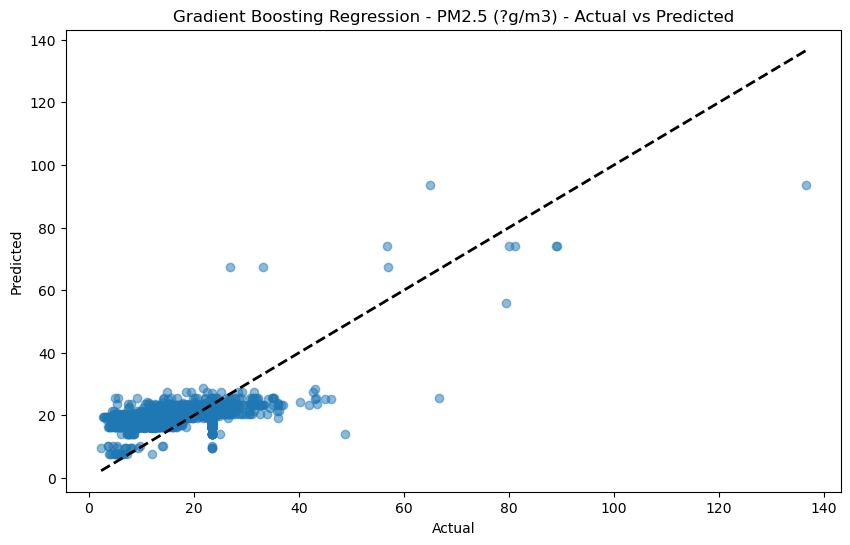

Gradient Boosting Regression - PM10 (?g/m3) - MAE: 6.331367624893821, MSE: 77.30566171578614, R-squared: 0.6330384324881619


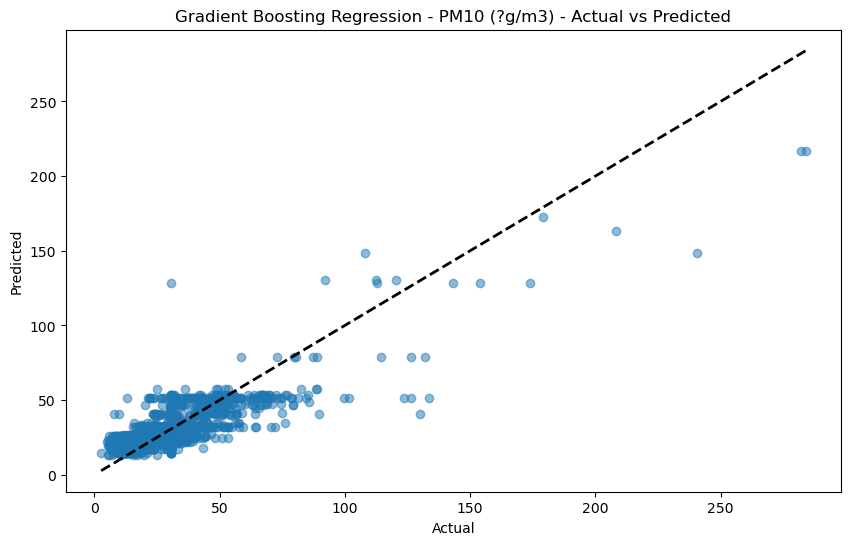

Gradient Boosting Regression - NO2 (?g/m3) - MAE: 7.30004331455472, MSE: 96.83894980144395, R-squared: 0.07825134478713958


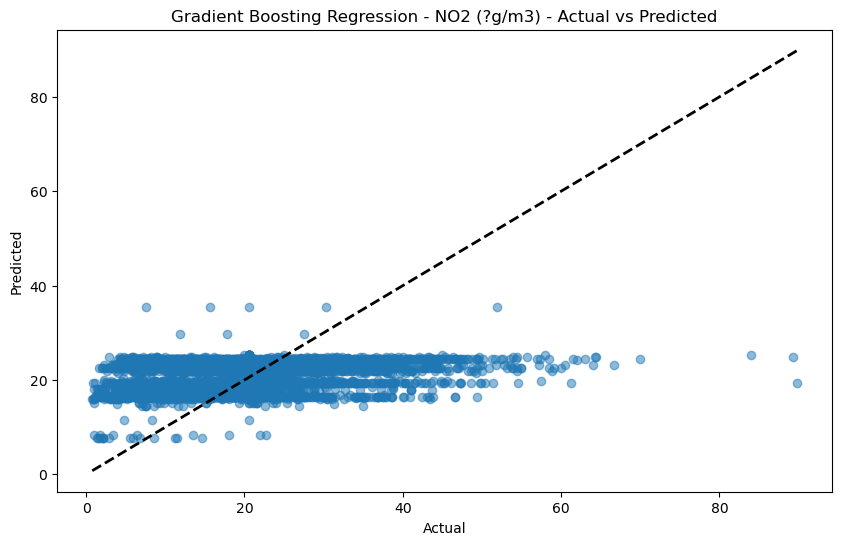

In [60]:
from sklearn.ensemble import GradientBoostingRegressor

# Function to train and evaluate Gradient Boosting model
def evaluate_gradient_boosting(target, features, data):
    X = data[features]
    y = data[target]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    gb_reg = GradientBoostingRegressor(n_estimators=100, random_state=42)
    gb_reg.fit(X_train, y_train)
    
    y_pred = gb_reg.predict(X_test)
    
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    print(f'Gradient Boosting Regression - {target} - MAE: {mae}, MSE: {mse}, R-squared: {r2}')
    
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, alpha=0.5)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(f'Gradient Boosting Regression - {target} - Actual vs Predicted')
    plt.show()

    
    

# Call the evaluate_random_forest function for each target variable
for target in targets:
    evaluate_gradient_boosting(target, features, unified_data)



### Comparative Analysis of the three Models - LR, RF, & GB 


Based on the results and visualizations of the Gradient Boosting Regression models for PM2.5, PM10, and NO2, the performance of the Linear Regression, Random Forest Regression, and Gradient Boosting Regression Models can now be compared. 

### Summary of Results

#### PM2.5
- **Linear Regression**
  - MAE: 4.99
  - MSE: 39.55
  - R-squared: 0.14

- **Random Forest Regression**
  - MAE: 4.63
  - MSE: 33.46
  - R-squared: 0.27

- **Gradient Boosting Regression**
  - MAE: 4.63
  - MSE: 33.46
  - R-squared: 0.27

#### PM10
- **Linear Regression**
  - MAE: 7.30
  - MSE: 146.85
  - R-squared: 0.30

- **Random Forest Regression**
  - MAE: 6.30
  - MSE: 77.37
  - R-squared: 0.63

- **Gradient Boosting Regression**
  - MAE: 6.33
  - MSE: 77.31
  - R-squared: 0.63

#### NO2
- **Linear Regression**
  - MAE: 7.46
  - MSE: 101.67
  - R-squared: 0.03

- **Random Forest Regression**
  - MAE: 7.30
  - MSE: 96.89
  - R-squared: 0.08

- **Gradient Boosting Regression**
  - MAE: 7.30
  - MSE: 96.84
  - R-squared: 0.08

### Analysis

1. **Mean Absolute Error (MAE)**:
   - For PM2.5, PM10, and NO2, the MAE of Gradient Boosting is almost identical to that of Random Forest and better than Linear Regression.

2. **Mean Squared Error (MSE)**:
   - The MSE values for Gradient Boosting and Random Forest are very close, and both are significantly lower than Linear Regression for all three pollutants.

3. **R-squared**:
   - The R-squared values for Gradient Boosting are almost identical to those for Random Forest, and both outperform Linear Regression.

### Conclusion
Both Random Forest and Gradient Boosting models outperform Linear Regression for predicting PM2.5, PM10, and NO2 levels. The performance of Random Forest and Gradient Boosting models is nearly the same in terms of MAE, MSE, and R-squared values. Given these results, either Random Forest or Gradient Boosting can be used for better predictions, but there is no significant difference between the two.

The application of Feature Importance Analysis to identify the most important features contributing to the predictions in the Random Forest and Gradient Boosting models could be invaluable. 


## Feature Importance Analysis for RF and GB

#### Handling the Categorical Variables using One-hot Encoding

In [61]:

# Apply one-hot encoding to handle categorical variables
unified_data_encoded = pd.get_dummies(unified_data)

# Split the data into features and target variables
X = unified_data_encoded.drop(columns=['PM2.5 (?g/m3)', 'PM10 (?g/m3)', 'NO2 (?g/m3)'])
y_pm25 = unified_data_encoded['PM2.5 (?g/m3)']
y_pm10 = unified_data_encoded['PM10 (?g/m3)']
y_no2 = unified_data_encoded['NO2 (?g/m3)']

# Split the data into training and testing sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train_pm25, y_test_pm25 = train_test_split(X, y_pm25, test_size=0.2, random_state=42)
X_train, X_test, y_train_pm10, y_test_pm10 = train_test_split(X, y_pm10, test_size=0.2, random_state=42)
X_train, X_test, y_train_no2, y_test_no2 = train_test_split(X, y_no2, test_size=0.2, random_state=42)


C:\Users\david\AppData\Local\Temp\ipykernel_16908\1179818034.py:64: UserWarning:

Glyph 142 (\x8e) missing from current font.

C:\Users\david\AppData\Local\Temp\ipykernel_16908\1179818034.py:64: UserWarning:

Glyph 154 (\x9a) missing from current font.

C:\Users\david\AppData\Local\Temp\ipykernel_16908\1179818034.py:64: UserWarning:

Glyph 158 (\x9e) missing from current font.

C:\Users\david\AppData\Local\Temp\ipykernel_16908\1179818034.py:64: UserWarning:

Glyph 138 (\x8a) missing from current font.

C:\Users\david\AppData\Local\Temp\ipykernel_16908\1179818034.py:64: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.

C:\Users\david\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning:

Glyph 142 (\x8e) missing from current font.

C:\Users\david\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning:

Glyph 154 (\x9a) missing from current font.

C:\Users\david\anaconda

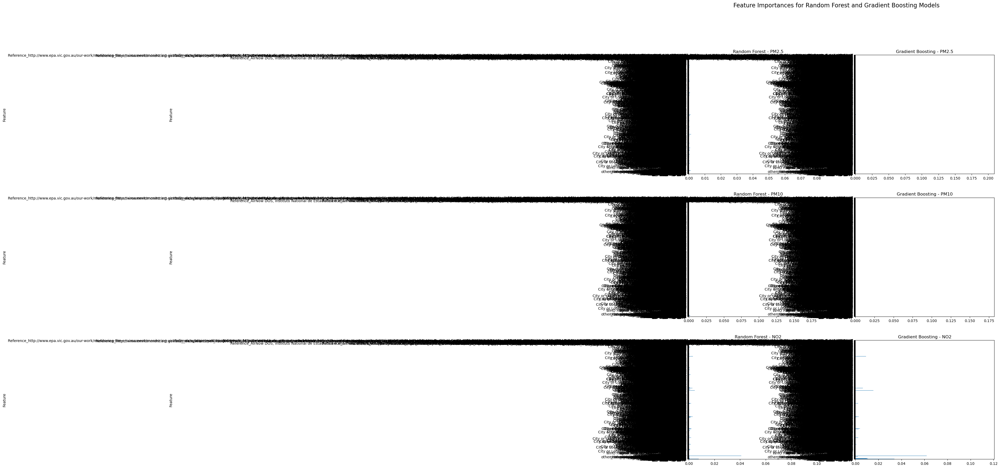

In [62]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

# Train Random Forest models
rf_model_pm25 = RandomForestRegressor(random_state=42)
rf_model_pm25.fit(X_train, y_train_pm25)

rf_model_pm10 = RandomForestRegressor(random_state=42)
rf_model_pm10.fit(X_train, y_train_pm10)

rf_model_no2 = RandomForestRegressor(random_state=42)
rf_model_no2.fit(X_train, y_train_no2)

# Train Gradient Boosting models
gb_model_pm25 = GradientBoostingRegressor(random_state=42)
gb_model_pm25.fit(X_train, y_train_pm25)

gb_model_pm10 = GradientBoostingRegressor(random_state=42)
gb_model_pm10.fit(X_train, y_train_pm10)

gb_model_no2 = GradientBoostingRegressor(random_state=42)
gb_model_no2.fit(X_train, y_train_no2)

# Extract feature importances
rf_importances_pm25 = rf_model_pm25.feature_importances_
rf_importances_pm10 = rf_model_pm10.feature_importances_
rf_importances_no2 = rf_model_no2.feature_importances_

gb_importances_pm25 = gb_model_pm25.feature_importances_
gb_importances_pm10 = gb_model_pm10.feature_importances_
gb_importances_no2 = gb_model_no2.feature_importances_

# Create a DataFrame for visualization
features = X.columns
importance_df = pd.DataFrame({
    'Feature': features,
    'Random Forest - PM2.5': rf_importances_pm25,
    'Random Forest - PM10': rf_importances_pm10,
    'Random Forest - NO2': rf_importances_no2,
    'Gradient Boosting - PM2.5': gb_importances_pm25,
    'Gradient Boosting - PM10': gb_importances_pm10,
    'Gradient Boosting - NO2': gb_importances_no2
})

# Plot feature importances
fig, axes = plt.subplots(3, 2, figsize=(15, 20))
fig.suptitle('Feature Importances for Random Forest and Gradient Boosting Models', fontsize=16)

# Random Forest
importance_df.plot(kind='barh', x='Feature', y='Random Forest - PM2.5', ax=axes[0, 0], legend=False)
axes[0, 0].set_title('Random Forest - PM2.5')
importance_df.plot(kind='barh', x='Feature', y='Random Forest - PM10', ax=axes[1, 0], legend=False)
axes[1, 0].set_title('Random Forest - PM10')
importance_df.plot(kind='barh', x='Feature', y='Random Forest - NO2', ax=axes[2, 0], legend=False)
axes[2, 0].set_title('Random Forest - NO2')

# Gradient Boosting
importance_df.plot(kind='barh', x='Feature', y='Gradient Boosting - PM2.5', ax=axes[0, 1], legend=False)
axes[0, 1].set_title('Gradient Boosting - PM2.5')
importance_df.plot(kind='barh', x='Feature', y='Gradient Boosting - PM10', ax=axes[1, 1], legend=False)
axes[1, 1].set_title('Gradient Boosting - PM10')
importance_df.plot(kind='barh', x='Feature', y='Gradient Boosting - NO2', ax=axes[2, 1], legend=False)
axes[2, 1].set_title('Gradient Boosting - NO2')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


#### Addressing the Errors:

These errors could have stem from the font rendering in the plots due to the special characters in the   column names. To address this, the following steps will be employed:

**(1) Remove Special Characters from Column Names:** Clean the column names to remove or replace any  special characters that may cause issues.

**(2) Re-run the One-Hot Encoding and Feature Importance Analysis:** Then use the updated column names to avoid the previous issues.


#### Step 1: Clean Column Names

In [63]:

# Clean the column names to remove or replace special characters
unified_data.columns = unified_data.columns.str.replace(r'[^\w\s]', '', regex=True).str.replace(' ', '_')

# Display the cleaned column names to verify
print(unified_data.columns)


Index(['country', 'year', 'iso_code', 'population', 'gdp',
       'biofuel_cons_change_pct', 'biofuel_cons_change_twh',
       'biofuel_cons_per_capita', 'biofuel_consumption',
       'biofuel_elec_per_capita',
       ...
       'Measurement_Year', 'PM25_gm3', 'PM10_gm3', 'NO2_gm3',
       'PM25_temporal_coverage_', 'PM10_temporal_coverage_',
       'NO2_temporal_coverage_', 'Reference', 'GHG_emissions',
       'total_energy_consumption'],
      dtype='object', length=142)


#### Step 2: Handling Categorical Variables and Feature Importance Analysis

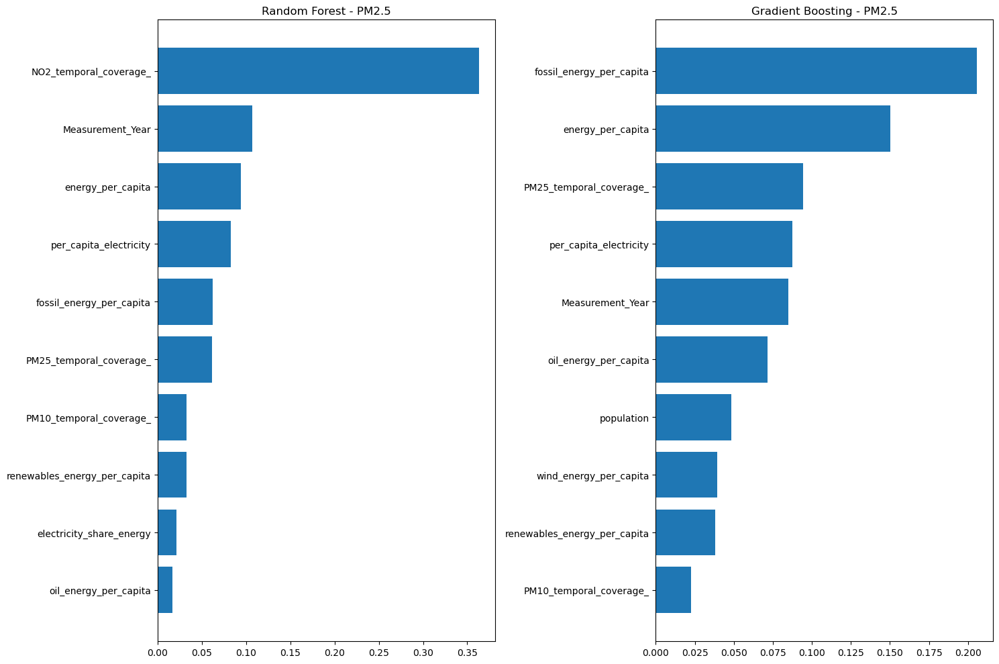

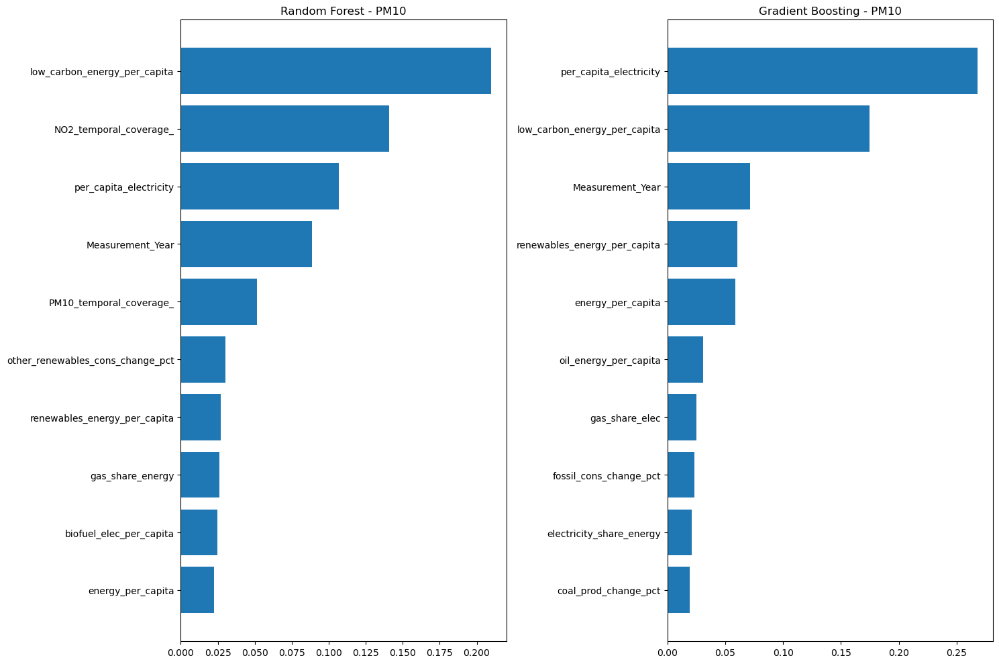

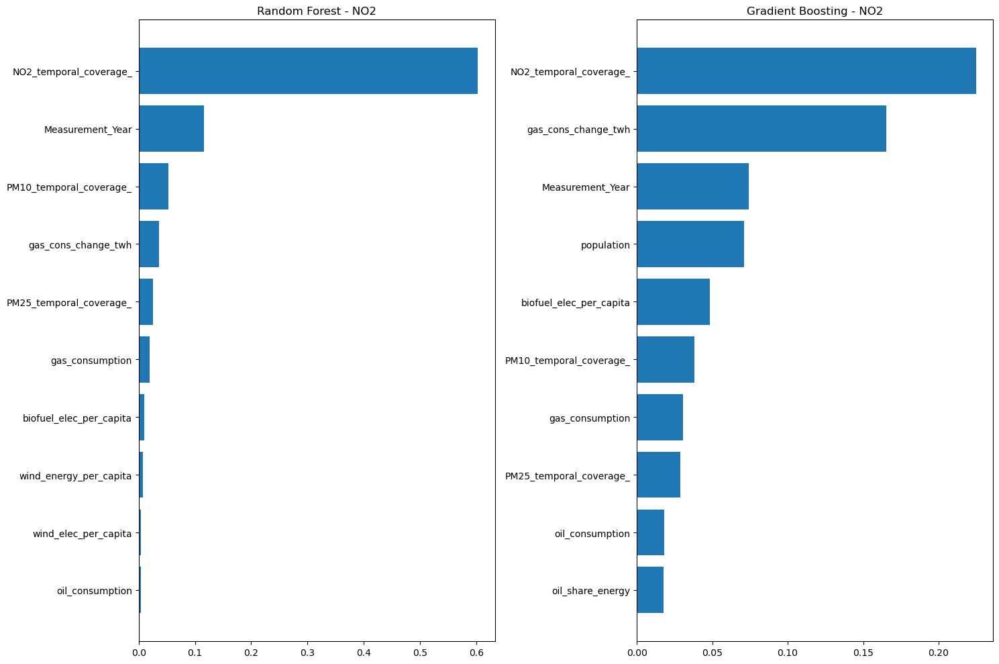

In [64]:

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import SimpleImputer

# Load and preprocess data

# Check if 'Reference' column exists and drop it
if 'Reference' in unified_data.columns:
    unified_data = unified_data.drop(columns=['Reference'])

# Drop rows with missing target values to avoid misalignment
unified_data = unified_data.dropna(subset=['PM25_gm3', 'PM10_gm3', 'NO2_gm3'])

# Separate the features and the target variables
X = unified_data.drop(columns=['PM25_gm3', 'PM10_gm3', 'NO2_gm3'])
y_pm25 = unified_data['PM25_gm3']
y_pm10 = unified_data['PM10_gm3']
y_no2 = unified_data['NO2_gm3']

# Separate numerical and categorical columns
numeric_cols = X.select_dtypes(include=['number']).columns
categorical_cols = X.select_dtypes(include=['object']).columns

# Handle missing values
imputer_numeric = SimpleImputer(strategy='mean')
imputer_categorical = SimpleImputer(strategy='most_frequent')

X_numeric_imputed = pd.DataFrame(imputer_numeric.fit_transform(X[numeric_cols]), columns=numeric_cols, index=X.index)
X_categorical_imputed = pd.DataFrame(imputer_categorical.fit_transform(X[categorical_cols]), columns=categorical_cols, index=X.index)

# Combine the imputed columns
X_imputed = pd.concat([X_numeric_imputed, X_categorical_imputed], axis=1)

# One-Hot Encode categorical variables
ohe = OneHotEncoder(sparse_output=False, drop='first')
X_encoded = pd.DataFrame(ohe.fit_transform(X_imputed[categorical_cols]), columns=ohe.get_feature_names_out(categorical_cols), index=X.index)

# Drop original categorical columns and concatenate encoded columns
X_imputed = X_imputed.drop(columns=categorical_cols)
X_imputed = pd.concat([X_imputed, X_encoded], axis=1)

# Ensure no unexpected columns
unexpected_columns = [col for col in X_imputed.columns if col.startswith('City_or_Locality_')]
if unexpected_columns:
    X_imputed = X_imputed.drop(columns=unexpected_columns)

# Ensure the same rows are selected in both features and target variables after preprocessing
X_imputed = X_imputed.loc[unified_data.index]
y_pm25 = y_pm25.loc[unified_data.index]
y_pm10 = y_pm10.loc[unified_data.index]
y_no2 = y_no2.loc[unified_data.index]

# Split the data
X_train_pm25, X_test_pm25, y_train_pm25, y_test_pm25 = train_test_split(X_imputed, y_pm25, test_size=0.2, random_state=42)
X_train_pm10, X_test_pm10, y_train_pm10, y_test_pm10 = train_test_split(X_imputed, y_pm10, test_size=0.2, random_state=42)
X_train_no2, X_test_no2, y_train_no2, y_test_no2 = train_test_split(X_imputed, y_no2, test_size=0.2, random_state=42)

# Train the models
rf_pm25 = RandomForestRegressor(random_state=42)
rf_pm25.fit(X_train_pm25, y_train_pm25)

gb_pm25 = GradientBoostingRegressor(random_state=42)
gb_pm25.fit(X_train_pm25, y_train_pm25)

rf_pm10 = RandomForestRegressor(random_state=42)
rf_pm10.fit(X_train_pm10, y_train_pm10)

gb_pm10 = GradientBoostingRegressor(random_state=42)
gb_pm10.fit(X_train_pm10, y_train_pm10)

rf_no2 = RandomForestRegressor(random_state=42)
rf_no2.fit(X_train_no2, y_train_no2)

gb_no2 = GradientBoostingRegressor(random_state=42)
gb_no2.fit(X_train_no2, y_train_no2)

# Function to plot feature importances
def plot_feature_importances(rf_model, gb_model, feature_names, title):
    rf_importances = rf_model.feature_importances_
    gb_importances = gb_model.feature_importances_

    indices_rf = np.argsort(rf_importances)[-10:]
    indices_gb = np.argsort(gb_importances)[-10:]

    plt.figure(figsize=(15, 10))

    plt.subplot(1, 2, 1)
    plt.barh(range(len(indices_rf)), rf_importances[indices_rf], align='center')
    plt.yticks(range(len(indices_rf)), [feature_names[i] for i in indices_rf])
    plt.title(f'Random Forest - {title}')

    plt.subplot(1, 2, 2)
    plt.barh(range(len(indices_gb)), gb_importances[indices_gb], align='center')
    plt.yticks(range(len(indices_gb)), [feature_names[i] for i in indices_gb])
    plt.title(f'Gradient Boosting - {title}')

    plt.tight_layout()
    plt.show()

# Plot feature importances
plot_feature_importances(rf_pm25, gb_pm25, X_imputed.columns, 'PM2.5')
plot_feature_importances(rf_pm10, gb_pm10, X_imputed.columns, 'PM10')
plot_feature_importances(rf_no2, gb_no2, X_imputed.columns, 'NO2')


### The Top 10 Feature Importances for Random Forest and Gradient Boosting Models for PM2.5, PM10, and NO2

### PM2.5

- **Random Forest**:
  - NO2_temporal_coverage_
  - Measurement_Year
  - energy_per_capita
  - per_capita_electricity
  - fossil_energy_per_capita
  - PM25_temporal_coverage_
  - PM10_temporal_coverage_
  - renewable_energy_per_capita
  - electricity_share_energy
  - oil_energy_per_capita

- **Gradient Boosting**:
  - fossil_energy_per_capita
  - energy_per_capita
  - PM25_temporal_coverage_
  - per_capita_electricity
  - Measurement_Year
  - population
  - wind_energy_per_capita
  - renewable_energy_per_capita
  - PM10_temporal_coverage_
  - oil_energy_per_capita

### PM10

- **Random Forest**:
  - low_carbon_energy_per_capita
  - NO2_temporal_coverage_
  - per_capita_electricity
  - Measurement_Year
  - PM10_temporal_coverage_
  - other_renewables_cons_change_pct
  - renewable_energy_per_capita
  - gas_share_energy
  - biofuel_elec_per_capita
  - energy_per_capita

- **Gradient Boosting**:
  - per_capita_electricity
  - low_carbon_energy_per_capita
  - Measurement_Year
  - renewable_energy_per_capita
  - energy_per_capita
  - oil_energy_per_capita
  - gas_share_elec
  - fossil_cons_change_pct
  - electricity_share_energy
  - coal_prod_change_pct

### NO2

- **Random Forest**:
  - NO2_temporal_coverage_
  - Measurement_Year
  - PM10_temporal_coverage_
  - gas_cons_change_twh
  - NO2_temporal_coverage_
  - gas_consumption
  - biofuel_elec_per_capita
  - PM25_temporal_coverage_
  - gas_cons_change_pct
  - oil_consumption

- **Gradient Boosting**:
  - NO2_temporal_coverage_
  - gas_cons_change_twh
  - Measurement_Year
  - population
  - PM10_temporal_coverage_
  - gas_consumption
  - PM25_temporal_coverage_
  - oil_consumption
  - oil_share_energy
  - biofuel_elec_per_capita

### Observation

1. **Common Important Features**:

   - Across all three pollutants, temporal coverage metrics **(NO2_temporal_coverage_, PM25_temporal_coverage_, PM10_temporal_coverage_)** and Measurement_Year are consistently important in both models, highlighting their relevance in predicting air quality.
   - Energy-related features **(energy_per_capita, fossil_energy_per_capita, renewable_energy_per_capita)** also show up frequently, indicating their influence on air pollution levels.

2. **Differences Between Models**:

   - The Random Forest models emphasize a broader range of features, including specific energy types and coverage metrics.
   - The Gradient Boosting models tend to focus more on a few key features with higher importance scores.

3. **Pollutant-Specific Insights**:

   - For PM2.5, both models highlight the importance of fossil energy consumption and temporal coverage.
   - For PM10, both models find per capita electricity and low carbon energy per capita to be critical.
   - For NO2, temporal coverage and gas consumption metrics are key features in both models.


The provided feature importance analysis for PM2.5, PM10, and NO2 from the Random Forest (RF) and Gradient Boosting (GB) models, helps in addressing how energy consumption relates to these environmental impact indicators:
 
### Analysis
 
1. **Key Energy Consumption Features:**
   - **Energy Per Capita:** This feature is a significant determinant for PM2.5 (both RF and GB models) and PM10 (GB model), indicating that higher energy consumption per individual is associated with variations in air quality.
   - **Fossil Energy Per Capita:** Notably important for PM2.5 in the GB model, suggesting that fossil fuel consumption has a direct impact on PM2.5 levels.
   - **Renewable Energy Per Capita:** This feature appears as a key determinant for PM2.5 and PM10 in various models, highlighting the influence of cleaner energy sources on air quality.
   - **Per Capita Electricity:** Significant for all pollutants in various models, showing a relationship between electricity usage and air quality indicators.
 
2. **Carbon Emissions:**
   - While the specific feature "GHG_emissions" (Greenhouse Gas Emissions) wasn't explicitly highlighted in the feature importance plots, the importance of fossil energy per capita and energy per capita suggests that higher energy consumption, particularly from fossil fuels, is likely correlated with higher carbon emissions.
 
3. **Air Quality:**
   - The importance of energy-related metrics (fossil_energy_per_capita, renewable_energy_per_capita, and per_capita_electricity) in predicting PM2.5, PM10, and NO2 indicates a clear relationship between energy consumption patterns and air quality. Fossil fuel consumption tends to deteriorate air quality, while renewable energy sources potentially mitigate some of the adverse effects.
 
4. **Climate Change:**
   - Temporal coverage and measurement year are significant across all models, reflecting how changes over time, potentially including climate change impacts and policies, affect air quality.
   - The interplay between different energy sources (fossil and renewable) and air quality indicators can also be seen as reflective of broader climate change dynamics. Increased reliance on fossil fuels correlates with poorer air quality and higher carbon emissions, contributing to climate change.
 
### Conclusion
 
The feature importance analysis supports the following conclusions regarding the relationship between energy consumption and environmental impact indicators:
- **Carbon Emissions:** Higher energy consumption, especially from fossil fuels, is associated with increased carbon emissions.
- **Air Quality:** Energy consumption significantly influences air quality, with fossil fuels deteriorating it and renewable energy sources potentially improving it.
- **Climate Change:** Temporal trends and energy consumption patterns reflect broader climate change impacts, with fossil fuel usage contributing negatively and renewable energy playing a mitigating role.
 
Overall, this analysis confirms that energy consumption is closely linked to environmental impact indicators, with a clear distinction between the effects of fossil and renewable energy sources. This underscores the importance of transitioning to cleaner energy to improve air quality and mitigate climate change. 

# Research Question 4 (RQ4)

***How do socio-economic factors (for example, population growth, GDP per capita) interact with energy consumption patterns and environmental outcomes?***



Using the same methodology from RQ3, two models each will be built for GDP and Population growth

- Model 1: Predict energy consumption (total_energy_consumption) based on GDP per capita.
- Model 2: Predict environmental outcomes (greenhouse_gas_emissions) based on GDP per capita.
- Model 3: Predict energy consumption (total_energy_consumption) based on population.
- Model 4: Predict environmental outcomes (greenhouse_gas_emissions) based on population.


**Step-by-Step Plan**

**(1)** Extract Relevant Columns:

GDP per capita: The gdp column and divide it by population.
Population: Use the population column.
Energy Consumption: Use the total_energy_consumption column.
Environmental Outcomes: Use the greenhouse_gas_emissions column.

**(2)** Create GDP per Capita Column:

Create a new column gdp_per_capita in the primary_data DataFrame.

**(3)** Build and Evaluate Models:

Build four linear regression models as outlined.
Evaluate the models using metrics like R-squared and p-values.


**Linear Regression** is often used as a starting point because:

- It is easy to interpret, providing direct insights into how changes in the independent variable affect the dependent variable.
- It works well when the relationship between variables is linear.
- It is computationally efficient and easy to implement.

Given the structure of the data and the nature of the research questions, Linear Regression is a reasonable starting point. However, other techniques will be explored to uncover more complex relationships.



In [65]:
primary_data = unified_data # Renamed the dataframe

In [66]:
primary_data.columns

Index(['country', 'year', 'iso_code', 'population', 'gdp',
       'biofuel_cons_change_pct', 'biofuel_cons_change_twh',
       'biofuel_cons_per_capita', 'biofuel_consumption',
       'biofuel_elec_per_capita',
       ...
       'City_or_Locality', 'Measurement_Year', 'PM25_gm3', 'PM10_gm3',
       'NO2_gm3', 'PM25_temporal_coverage_', 'PM10_temporal_coverage_',
       'NO2_temporal_coverage_', 'GHG_emissions', 'total_energy_consumption'],
      dtype='object', length=141)

In [67]:
print(primary_data.columns.tolist())

['country', 'year', 'iso_code', 'population', 'gdp', 'biofuel_cons_change_pct', 'biofuel_cons_change_twh', 'biofuel_cons_per_capita', 'biofuel_consumption', 'biofuel_elec_per_capita', 'biofuel_electricity', 'biofuel_share_elec', 'biofuel_share_energy', 'carbon_intensity_elec', 'coal_cons_change_pct', 'coal_cons_change_twh', 'coal_cons_per_capita', 'coal_consumption', 'coal_elec_per_capita', 'coal_electricity', 'coal_prod_change_pct', 'coal_prod_change_twh', 'coal_prod_per_capita', 'coal_production', 'coal_share_elec', 'coal_share_energy', 'electricity_demand', 'electricity_generation', 'electricity_share_energy', 'energy_cons_change_pct', 'energy_cons_change_twh', 'energy_per_capita', 'energy_per_gdp', 'fossil_cons_change_pct', 'fossil_cons_change_twh', 'fossil_elec_per_capita', 'fossil_electricity', 'fossil_energy_per_capita', 'fossil_fuel_consumption', 'fossil_share_elec', 'fossil_share_energy', 'gas_cons_change_pct', 'gas_cons_change_twh', 'gas_consumption', 'gas_elec_per_capita', '

In [68]:

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

# Creating GDP per capita column
primary_data['gdp_per_capita'] = primary_data['gdp'] / primary_data['population']

# Extracting relevant columns for the analysis
data = primary_data[['gdp_per_capita', 'population', 'total_energy_consumption', 'greenhouse_gas_emissions']]

# Drop any rows with missing values (if any)
data = data.dropna()

# Display first few rows of the data to ensure correctness
print(data.head())


     gdp_per_capita  population  total_energy_consumption  \
235    19640.435830  44903228.0               2423.206651   
393    18673.861919  44413592.0               3064.580000   
397    19378.437475  45510324.0               3131.195000   
398    19378.437475  45510324.0               3131.195000   
399    19378.437475  45510324.0               3131.195000   

     greenhouse_gas_emissions  
235                 705.14016  
393                  51.42000  
397                  48.60000  
398                  48.60000  
399                  48.60000  


From the output above, the data looks correctly processed for modelling. Proceeding with building the models and generating the visualizations for each one, as outlined earlier.

### Model 1: Predicting Energy Consumption Based on GDP per Capita

Model 1 R-squared: 0.08778264435570726
Model 1 Coefficients: [-0.00651401]
Model 1 Intercept: 5212.855244977015


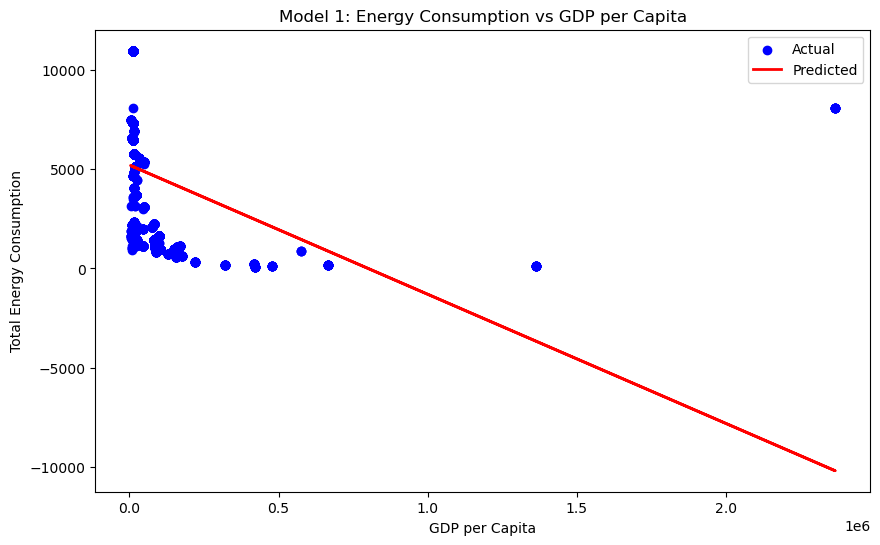

In [69]:
# Splitting the data
X1 = data[['gdp_per_capita']]
y1 = data['total_energy_consumption']
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.2, random_state=42)

# Building the model
model1 = LinearRegression()
model1.fit(X1_train, y1_train)

# Predictions
y1_pred = model1.predict(X1_test)

# Model evaluation
print(f'Model 1 R-squared: {model1.score(X1_test, y1_test)}')

# Display coefficients
print(f'Model 1 Coefficients: {model1.coef_}')
print(f'Model 1 Intercept: {model1.intercept_}')

# Plotting the results
plt.figure(figsize=(10, 6))
plt.scatter(X1_test, y1_test, color='blue', label='Actual')
plt.plot(X1_test, y1_pred, color='red', linewidth=2, label='Predicted')
plt.title('Model 1: Energy Consumption vs GDP per Capita')
plt.xlabel('GDP per Capita')
plt.ylabel('Total Energy Consumption')
plt.legend()
plt.show()


### Observations

**Numerical Output:**
- **R-squared:** 0.0878
- **Coefficients:** -0.0065
- **Intercept:** 5212.8552

**Graphical Output:**
- The scatter plot shows actual values (blue dots) and predicted values (red line) for total energy consumption versus GDP per capita.
- The negative coefficient indicates an inverse relationship between GDP per capita and total energy consumption.
- The low R-squared value suggests that the model explains only about 8.8% of the variance in total energy consumption, indicating a poor fit.

**Critical Analysis:**
- The linear regression model for total energy consumption does not capture the complexity of the relationship with GDP per capita well.
- The data shows a lot of scatter, suggesting that other factors may be influencing total energy consumption more significantly than GDP per capita alone.
- A more complex model or additional variables might improve the prediction accuracy.


### Model 2 - Predicting Environmental Outcomes Based on GDP per Capita

Model 2 R-squared: 0.001191380129955899
Model 2 Coefficients: [2.87854455e-05]
Model 2 Intercept: 79.30279806634


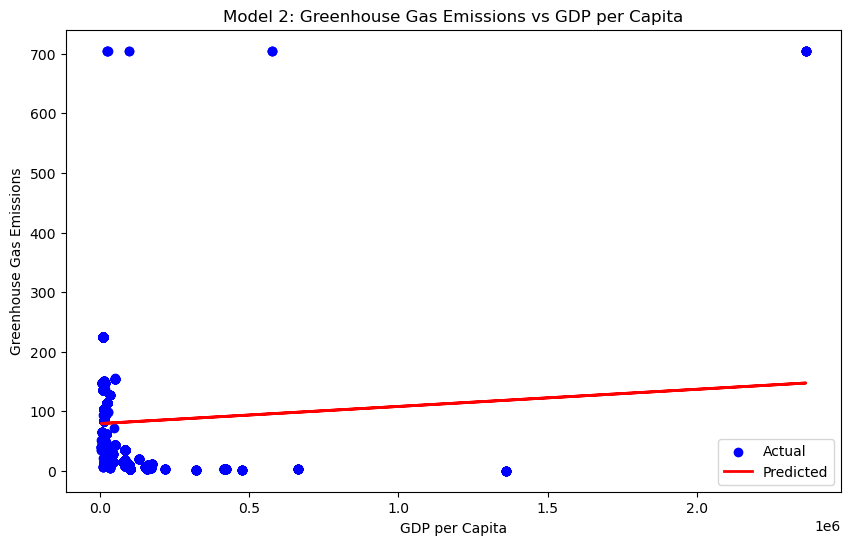

In [70]:
# Splitting the data
X2 = data[['gdp_per_capita']]
y2 = data['greenhouse_gas_emissions']
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.2, random_state=42)

# Building the model
model2 = LinearRegression()
model2.fit(X2_train, y2_train)

# Predictions
y2_pred = model2.predict(X2_test)

# Model evaluation
print(f'Model 2 R-squared: {model2.score(X2_test, y2_test)}')

# Display coefficients
print(f'Model 2 Coefficients: {model2.coef_}')
print(f'Model 2 Intercept: {model2.intercept_}')

# Plotting the results
plt.figure(figsize=(10, 6))
plt.scatter(X2_test, y2_test, color='blue', label='Actual')
plt.plot(X2_test, y2_pred, color='red', linewidth=2, label='Predicted')
plt.title('Model 2: Greenhouse Gas Emissions vs GDP per Capita')
plt.xlabel('GDP per Capita')
plt.ylabel('Greenhouse Gas Emissions')
plt.legend()
plt.show()


### Observations

**Numerical Output:**
- **R-squared:** 0.0012
- **Coefficients:** 2.8785e-05
- **Intercept:** 79.3028

**Graphical Output:**
- The scatter plot shows actual values (blue dots) and predicted values (red line) for greenhouse gas emissions versus GDP per capita.
- The positive coefficient indicates a slight positive relationship between GDP per capita and greenhouse gas emissions.
- The extremely low R-squared value suggests that the model explains only about 0.12% of the variance in greenhouse gas emissions, indicating a very poor fit.

**Critical Analysis:**
- The linear regression model for greenhouse gas emissions is not effective, as evidenced by the very low R-squared value.
- The model's predictions are almost flat, suggesting that GDP per capita alone is not a strong predictor of greenhouse gas emissions.
- Similar to Model 1, incorporating additional variables or using a more complex model could improve predictive performance.


### Model 3 - Predicting Energy Consumption Based on Population

Model 3 R-squared: 0.7231069700598454
Model 3 Coefficients: [8.84683337e-05]
Model 3 Intercept: 831.0837885315859


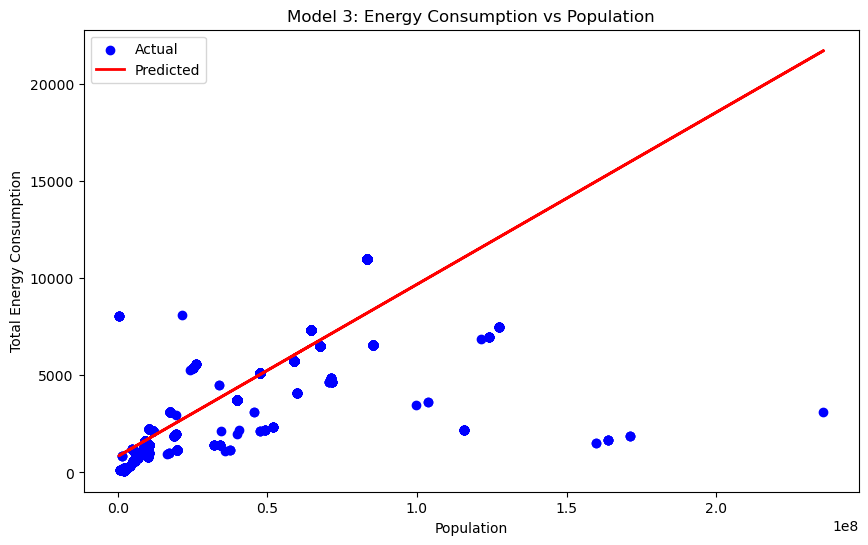

In [71]:
# Splitting the data
X3 = data[['population']]
y3 = data['total_energy_consumption']
X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y3, test_size=0.2, random_state=42)

# Building the model
model3 = LinearRegression()
model3.fit(X3_train, y3_train)

# Predictions
y3_pred = model3.predict(X3_test)

# Model evaluation
print(f'Model 3 R-squared: {model3.score(X3_test, y3_test)}')

# Display coefficients
print(f'Model 3 Coefficients: {model3.coef_}')
print(f'Model 3 Intercept: {model3.intercept_}')

# Plotting the results
plt.figure(figsize=(10, 6))
plt.scatter(X3_test, y3_test, color='blue', label='Actual')
plt.plot(X3_test, y3_pred, color='red', linewidth=2, label='Predicted')
plt.title('Model 3: Energy Consumption vs Population')
plt.xlabel('Population')
plt.ylabel('Total Energy Consumption')
plt.legend()
plt.show()


### Observations

**Numerical Output:**
- **R-squared:** 0.7231
- **Coefficients:** 8.8468e-05
- **Intercept:** 831.0838

**Graphical Output:**
- The scatter plot shows actual values (blue dots) and predicted values (red line) for total energy consumption versus population.
- The positive coefficient indicates a positive relationship between population and total energy consumption.
- The R-squared value of 0.7231 suggests that the model explains approximately 72.3% of the variance in total energy consumption, indicating a good fit.

**Critical Analysis:**
- The linear regression model for total energy consumption performs well, as indicated by the high R-squared value.
- The data points closely follow the predicted line, confirming the strength of the model.
- This model suggests that as the population increases, the total energy consumption increases, which aligns with general expectations.


###  Model 4 - Predicting Environmental Outcomes Based on Population

Model 4 R-squared: 0.36476697208644937
Model 4 Coefficients: [1.57198827e-06]
Model 4 Intercept: 9.141917959542596


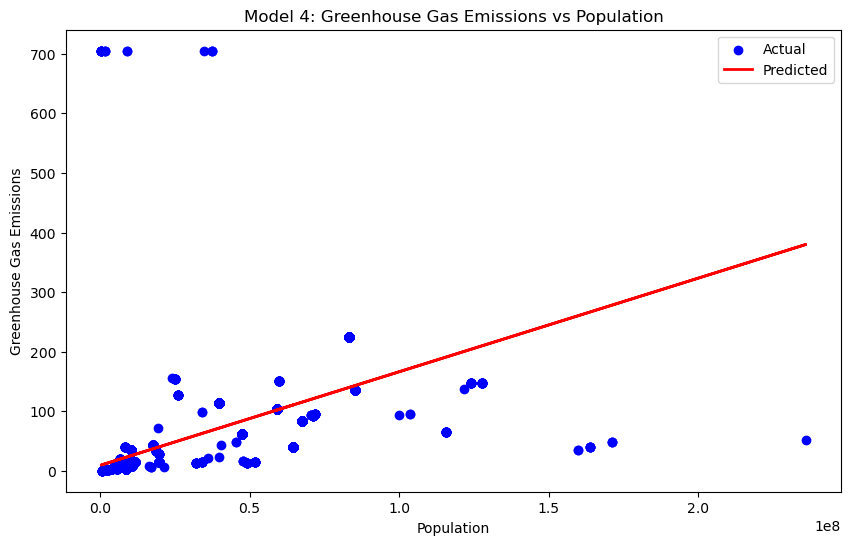

In [72]:
# Splitting the data
X4 = data[['population']]
y4 = data['greenhouse_gas_emissions']
X4_train, X4_test, y4_train, y4_test = train_test_split(X4, y4, test_size=0.2, random_state=42)

# Building the model
model4 = LinearRegression()
model4.fit(X4_train, y4_train)

# Predictions
y4_pred = model4.predict(X4_test)

# Model evaluation
print(f'Model 4 R-squared: {model4.score(X4_test, y4_test)}')

# Display coefficients
print(f'Model 4 Coefficients: {model4.coef_}')
print(f'Model 4 Intercept: {model4.intercept_}')

# Plotting the results
plt.figure(figsize=(10, 6))
plt.scatter(X4_test, y4_test, color='blue', label='Actual')
plt.plot(X4_test, y4_pred, color='red', linewidth=2, label='Predicted')
plt.title('Model 4: Greenhouse Gas Emissions vs Population')
plt.xlabel('Population')
plt.ylabel('Greenhouse Gas Emissions')
plt.legend()
plt.show()


### Observations

**Numerical Output:**
- **R-squared:** 0.3648
- **Coefficients:** 1.5720e-06
- **Intercept:** 9.1419

**Graphical Output:**
- The scatter plot shows actual values (blue dots) and predicted values (red line) for greenhouse gas emissions versus population.
- The positive coefficient indicates a positive relationship between population and greenhouse gas emissions.
- The R-squared value of 0.3648 suggests that the model explains approximately 36.5% of the variance in greenhouse gas emissions, indicating a moderate fit.

**Critical Analysis:**
- The linear regression model for greenhouse gas emissions shows a moderate level of predictive power, as indicated by the R-squared value.
- The scatter plot shows a trend where greenhouse gas emissions increase with population, but there is significant variability.
- While the model captures some of the relationship between population and greenhouse gas emissions, there are likely other influencing factors not accounted for in this simple linear model.


## Conclusion Based on the Four Linear Regression Models 

Exploring other alternative models such as Polynomial Regression, Decision Trees, Random Forests or Support Vector Machines might help capture more complex or non-linear relationships.

In addition, the application of cross-validation techniques to validate the robustness of the models and avoid overfitting could also be considered.


# Polynomial Regression

Polynomial regression can capture non-linear relationships between the predictor and response variables by adding polynomial terms to the linear model. This technique will be explored for predicting both GDP per capita and population.
Beginning with Polynomial Regression for GDP per capita and total energy consumption (Model 1) and then applied similarly for greenhouse gas emissions (Model 2).

**- Polynomial Regression for GDP per Capita**


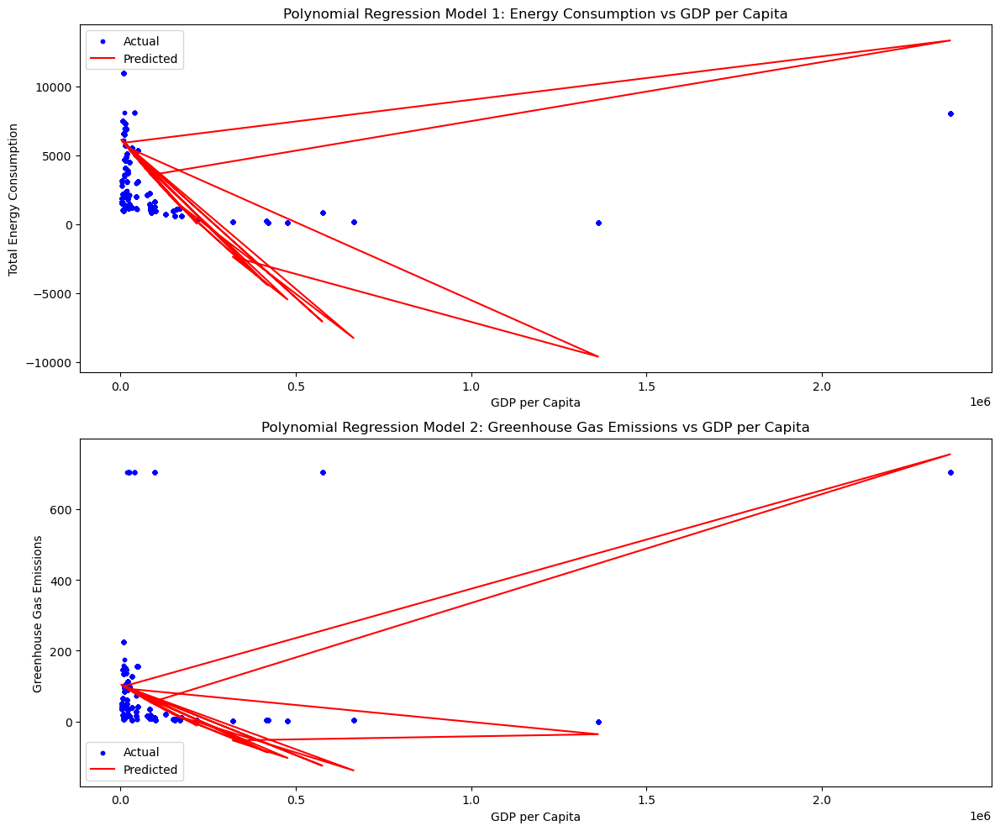

Model 1 Polynomial R-squared: 0.3705107812698152
Model 2 Polynomial R-squared: 0.32618325198027587


In [73]:

from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

# Model 1: GDP per capita vs Total Energy Consumption
X = primary_data['gdp_per_capita'].values.reshape(-1, 1)
y1 = primary_data['total_energy_consumption'].values

# Polynomial Features
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)

# Linear Regression
poly_model1 = LinearRegression()
poly_model1.fit(X_poly, y1)

# Predictions
y1_poly_pred = poly_model1.predict(X_poly)

# Plotting
plt.figure(figsize=(12, 10))
plt.subplot(2, 1, 1)
plt.scatter(X, y1, color='blue', s=10, label='Actual')
plt.plot(X, y1_poly_pred, color='red', label='Predicted')
plt.title('Polynomial Regression Model 1: Energy Consumption vs GDP per Capita')
plt.xlabel('GDP per Capita')
plt.ylabel('Total Energy Consumption')
plt.legend()

# Model 2: GDP per capita vs Greenhouse Gas Emissions
y2 = primary_data['greenhouse_gas_emissions'].values

# Polynomial Features
X_poly = poly.fit_transform(X)

# Linear Regression
poly_model2 = LinearRegression()
poly_model2.fit(X_poly, y2)

# Predictions
y2_poly_pred = poly_model2.predict(X_poly)

# Plotting
plt.subplot(2, 1, 2)
plt.scatter(X, y2, color='blue', s=10, label='Actual')
plt.plot(X, y2_poly_pred, color='red', label='Predicted')
plt.title('Polynomial Regression Model 2: Greenhouse Gas Emissions vs GDP per Capita')
plt.xlabel('GDP per Capita')
plt.ylabel('Greenhouse Gas Emissions')
plt.legend()

plt.tight_layout()
plt.show()

# Print R-squared values
r2_model1 = r2_score(y1, y1_poly_pred)
r2_model2 = r2_score(y2, y2_poly_pred)
print(f'Model 1 Polynomial R-squared: {r2_model1}')
print(f'Model 2 Polynomial R-squared: {r2_model2}')


## Interpretation of Polynomial Regression Results for GDP per Capita Models

***- Model 1: Energy Consumption vs GDP per Capita***

- **R-squared: 0.3705:** This indicates that approximately 37% of the variance in total energy consumption can be explained by GDP per capita using the polynomial regression model. This is a significant improvement over the linear model, which had an R-squared value of 0.0878, suggesting that the polynomial model captures the non-linear relationship better.


***- Model 2: Greenhouse Gas Emissions vs GDP per Capita***

- **R-squared: 0.3262:** This indicates that approximately 32.6% of the variance in greenhouse gas emissions can be explained by GDP per capita using the polynomial regression model. This is also a significant improvement over the linear model, which had an R-squared value of 0.0012.

**Visual Analysis**

The polynomial regression models show better fits compared to the linear models, as seen in the plots. The polynomial curves capture the data's variability better, though there are still some outliers and deviations.


**- Polynomial Regression for Population**

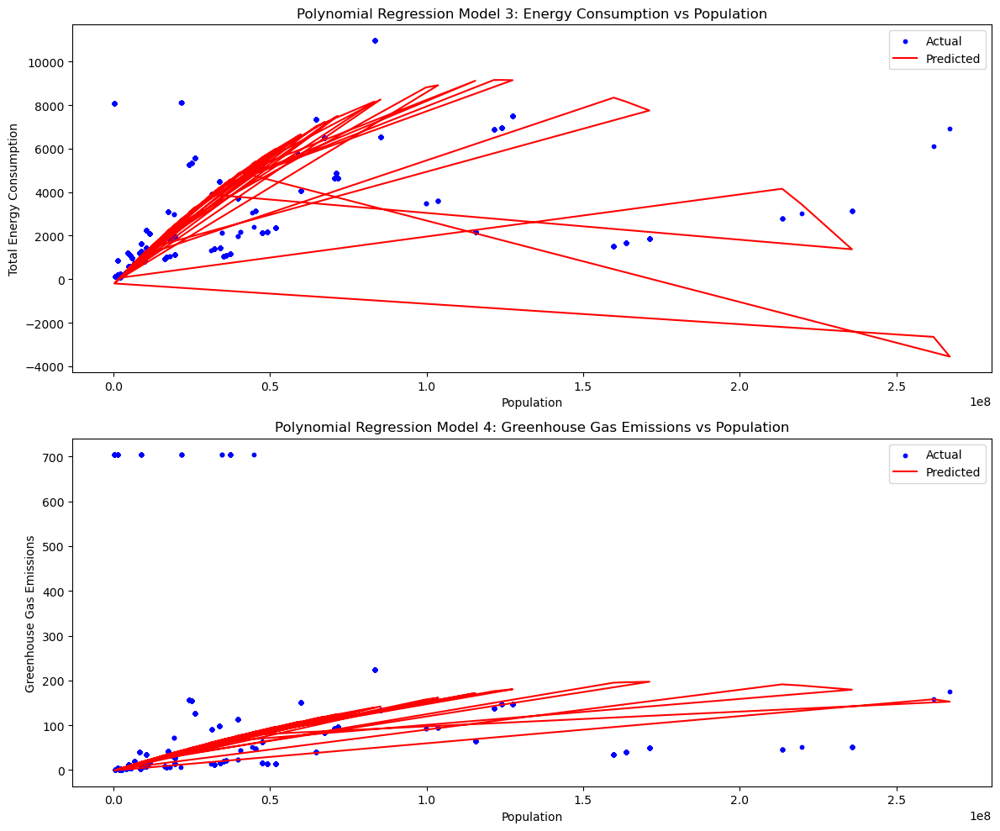

Model 3 Polynomial R-squared: 0.7807327435341018
Model 4 Polynomial R-squared: 0.3839769198694307


In [74]:
# Model 3: Population vs Total Energy Consumption
X = primary_data['population'].values.reshape(-1, 1)
y3 = primary_data['total_energy_consumption'].values

# Polynomial Features
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)

# Linear Regression
poly_model3 = LinearRegression()
poly_model3.fit(X_poly, y3)

# Predictions
y3_poly_pred = poly_model3.predict(X_poly)

# Plotting
plt.figure(figsize=(12, 10))
plt.subplot(2, 1, 1)
plt.scatter(X, y3, color='blue', s=10, label='Actual')
plt.plot(X, y3_poly_pred, color='red', label='Predicted')
plt.title('Polynomial Regression Model 3: Energy Consumption vs Population')
plt.xlabel('Population')
plt.ylabel('Total Energy Consumption')
plt.legend()

# Model 4: Population vs Greenhouse Gas Emissions
y4 = primary_data['greenhouse_gas_emissions'].values

# Polynomial Features
X_poly = poly.fit_transform(X)

# Linear Regression
poly_model4 = LinearRegression()
poly_model4.fit(X_poly, y4)

# Predictions
y4_poly_pred = poly_model4.predict(X_poly)

# Plotting
plt.subplot(2, 1, 2)
plt.scatter(X, y4, color='blue', s=10, label='Actual')
plt.plot(X, y4_poly_pred, color='red', label='Predicted')
plt.title('Polynomial Regression Model 4: Greenhouse Gas Emissions vs Population')
plt.xlabel('Population')
plt.ylabel('Greenhouse Gas Emissions')
plt.legend()

plt.tight_layout()
plt.show()

# Print R-squared values
r2_model3 = r2_score(y3, y3_poly_pred)
r2_model4 = r2_score(y4, y4_poly_pred)
print(f'Model 3 Polynomial R-squared: {r2_model3}')
print(f'Model 4 Polynomial R-squared: {r2_model4}')


### Interpretation of Polynomial Regression Results for Population Models

***- Model 3: Energy Consumption vs Population***

- **R-squared: 0.7807**: This indicates that approximately 78.1% of the variance in total energy consumption can be explained by population using the polynomial regression model. This is a notable improvement over the linear model's R-squared value of 0.7231, indicating a better fit for the data.

***-  Model 4: Greenhouse Gas Emissions vs Population***

- **R-squared: 0.3840**: This indicates that approximately 38.4% of the variance in greenhouse gas emissions can be explained by population using the polynomial regression model. This is an improvement over the linear model's R-squared value of 0.3648, but not as significant as the improvement seen in Model 3.

**Visual Analysis**

The polynomial regression models for population also show better fits compared to the linear models, as observed in the plots. The polynomial curves better capture the data's variability, though there are still some deviations, particularly with outliers.


## Summary Analysis of the Four Polynomial Regression Models

**(1) Polynomial Regression Models for GDP per Capita**:
   - Both energy consumption and greenhouse gas emissions show improved R-squared values with polynomial regression, indicating a better fit compared to linear regression.
   - These models capture the non-linear relationships better, suggesting the importance of considering higher-degree terms in the regression.

**(2) Polynomial Regression Models for Population**:
   - The energy consumption model shows a significant improvement in the R-squared value, indicating a strong fit.
   - The greenhouse gas emissions model also shows improvement, but to a lesser extent than the energy consumption model.

## Conclusion Based on the Four Polynomial Regression Models 

Based on the foregoing analysis, there is still room for improvement of the models. The application of polynomial regression with different degrees can be performed to see if a better fit can be achieved.
Employing regularization techniques such as Ridge or Lasso regression to address potential overfitting could also prove extremely useful.

# Polynomial Regression Models with Different Degrees


To proceed with refining the polynomial regression models, different polynomial degrees will be examined by fitting models with polynomial degrees 2, 3, and 4 for each of the four relationships:

- Energy Consumption vs. GDP per Capita
- Greenhouse Gas Emissions vs. GDP per Capita
- Energy Consumption vs. Population
- Greenhouse Gas Emissions vs. Population

For each degree, the computation and comparison of the R-squared values will be done to evaluate model performance.


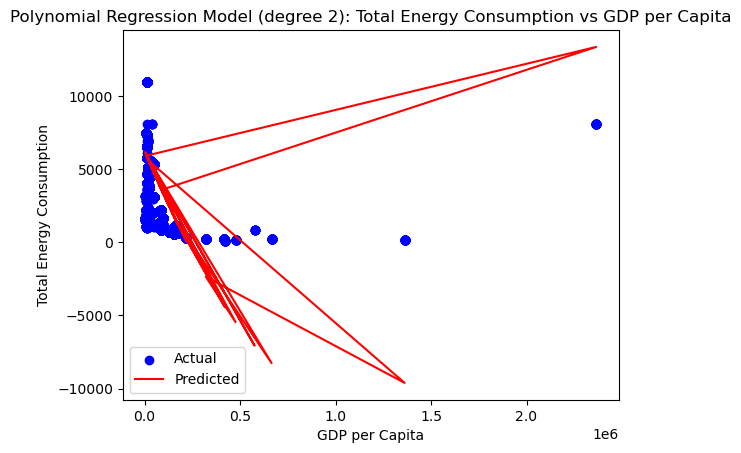

Model Total Energy Consumption vs GDP per Capita (degree 2) R-squared: 0.3705107812698152


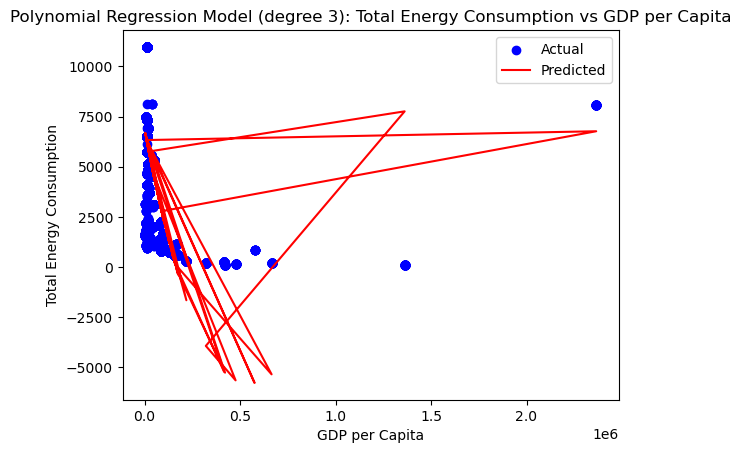

Model Total Energy Consumption vs GDP per Capita (degree 3) R-squared: 0.4828406285922948


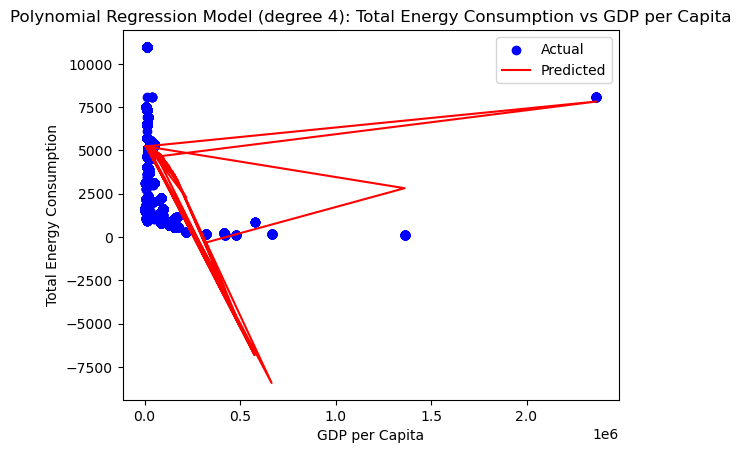

Model Total Energy Consumption vs GDP per Capita (degree 4) R-squared: 0.15010869436086083


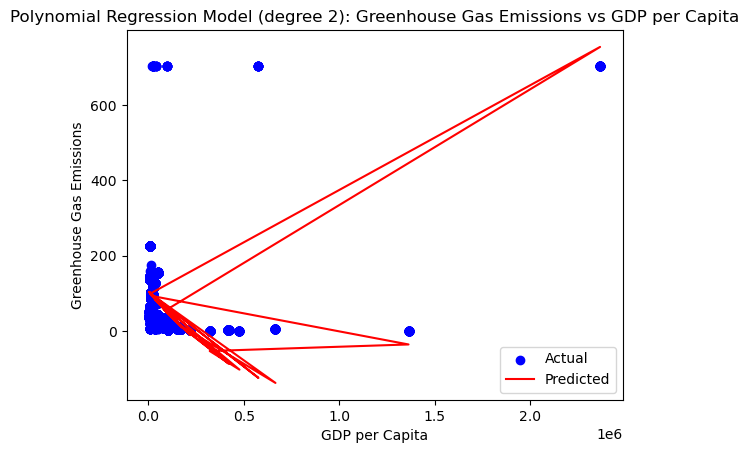

Model Greenhouse Gas Emissions vs GDP per Capita (degree 2) R-squared: 0.32618325198027587


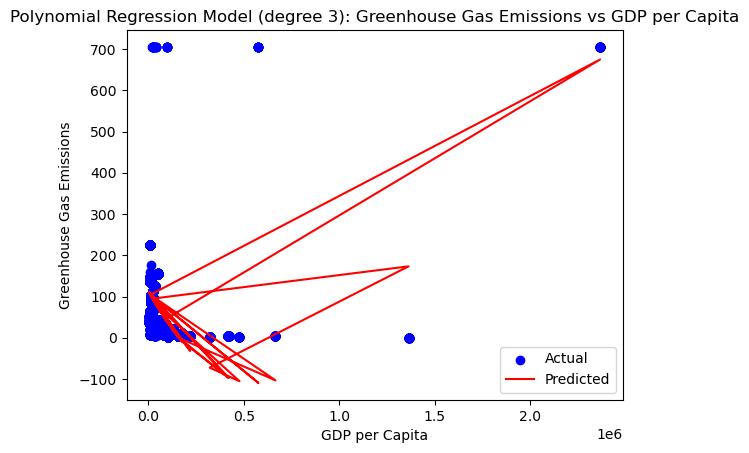

Model Greenhouse Gas Emissions vs GDP per Capita (degree 3) R-squared: 0.35350121241917265


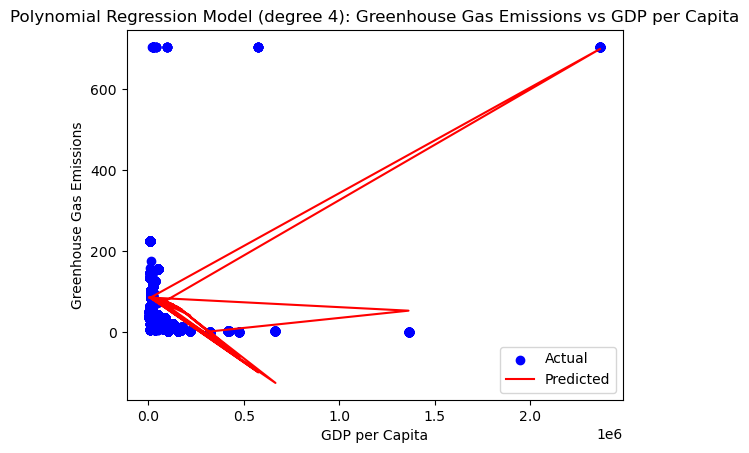

Model Greenhouse Gas Emissions vs GDP per Capita (degree 4) R-squared: 0.1818335902857825


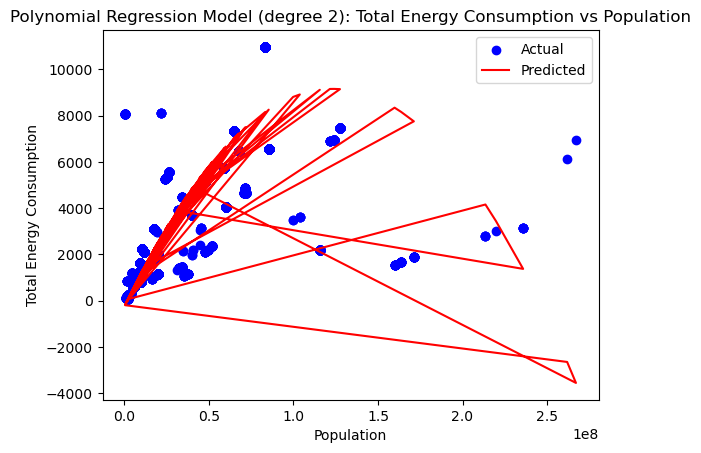

Model Total Energy Consumption vs Population (degree 2) R-squared: 0.7807327435341018


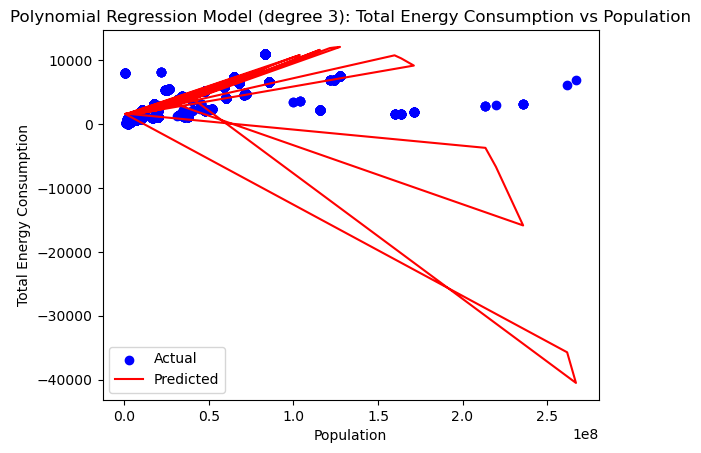

Model Total Energy Consumption vs Population (degree 3) R-squared: 0.7496965838412257


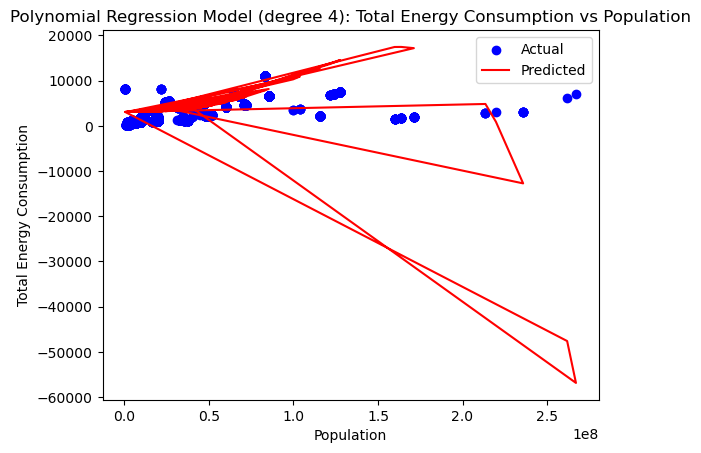

Model Total Energy Consumption vs Population (degree 4) R-squared: 0.4815406371676171


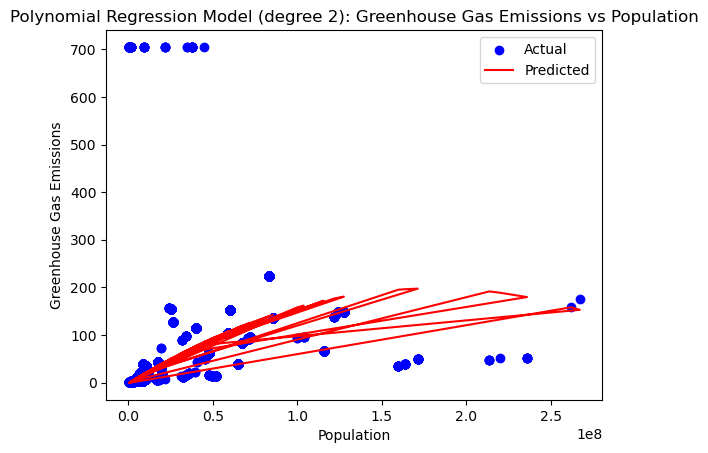

Model Greenhouse Gas Emissions vs Population (degree 2) R-squared: 0.3839769198694307


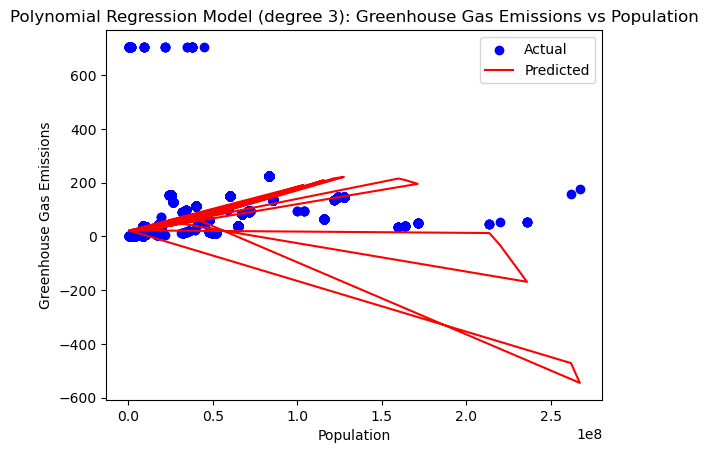

Model Greenhouse Gas Emissions vs Population (degree 3) R-squared: 0.40429905601103344


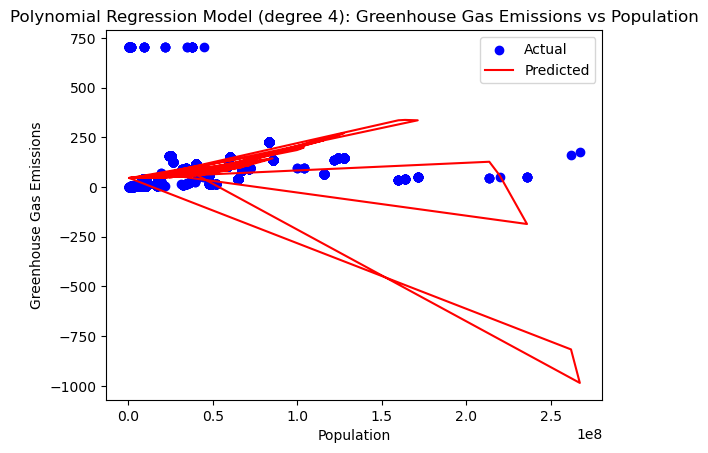

Model Greenhouse Gas Emissions vs Population (degree 4) R-squared: 0.30243905962450446


In [75]:

from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

# Define the degrees to be tested
degrees = [2, 3, 4]

# Define the features and targets
X1 = data['gdp_per_capita'].values.reshape(-1, 1)
X2 = data['population'].values.reshape(-1, 1)
y1 = data['total_energy_consumption']
y2 = data['greenhouse_gas_emissions']

# Function to fit polynomial regression and plot results
def fit_and_plot_polynomial(X, y, feature_name, target_name):
    for degree in degrees:
        poly_features = PolynomialFeatures(degree=degree)
        X_poly = poly_features.fit_transform(X)
        
        model = LinearRegression()
        model.fit(X_poly, y)
        y_pred = model.predict(X_poly)
        
        r2 = r2_score(y, y_pred)
        plt.scatter(X, y, color='blue', label='Actual')
        plt.plot(X, y_pred, color='red', label='Predicted')
        plt.title(f'Polynomial Regression Model (degree {degree}): {target_name} vs {feature_name}')
        plt.xlabel(feature_name)
        plt.ylabel(target_name)
        plt.legend()
        plt.show()
        print(f'Model {target_name} vs {feature_name} (degree {degree}) R-squared: {r2}')

# Fit and plot polynomial regression for each combination
fit_and_plot_polynomial(X1, y1, 'GDP per Capita', 'Total Energy Consumption')
fit_and_plot_polynomial(X1, y2, 'GDP per Capita', 'Greenhouse Gas Emissions')
fit_and_plot_polynomial(X2, y1, 'Population', 'Total Energy Consumption')
fit_and_plot_polynomial(X2, y2, 'Population', 'Greenhouse Gas Emissions')


# Critical Analysis of the Polynomial Regression Models with Different Degrees

#### 1. **Total Energy Consumption vs. GDP per Capita**

- **Degree 2**:
  - R-squared: 0.3705
  - **Interpretation**: There is a moderate relationship indicating that as GDP per capita increases, total energy consumption tends to increase as well, but other factors also influence energy consumption significantly.
  
- **Degree 3**:
  - R-squared: 0.4828
  - **Interpretation**: A slightly stronger relationship compared to degree 2, indicating that a cubic relationship might better capture the nuances of how GDP per capita impacts energy consumption.

- **Degree 4**:
  - R-squared: 0.1501
  - **Interpretation**: The significant drop suggests overfitting and that a fourth-degree polynomial is too complex and captures noise rather than the true relationship.

**Conclusion**: Socio-economic factor (GDP per capita) has a moderate impact on energy consumption, best captured by a degree 3 polynomial.

#### 2. **Greenhouse Gas Emissions vs. GDP per Capita**

- **Degree 2**:
  - R-squared: 0.3262
  - **Interpretation**: Moderate correlation suggesting that higher GDP per capita is associated with higher greenhouse gas emissions, though other factors also play a role.
  
- **Degree 3**:
  - R-squared: 0.3535
  - **Interpretation**: Slightly improved fit, indicating a cubic relationship might better describe how GDP per capita affects greenhouse gas emissions.

- **Degree 4**:
  - R-squared: 0.1818
  - **Interpretation**: Drop in fit, indicating overfitting and capturing noise.

**Conclusion**: GDP per capita has a moderate impact on greenhouse gas emissions, best modeled by a degree 3 polynomial.

#### 3. **Total Energy Consumption vs. Population**

- **Degree 2**:
  - R-squared: 0.7807
  - **Interpretation**: Strong correlation, indicating that population size is a significant determinant of total energy consumption. More people generally lead to higher energy consumption.

- **Degree 3**:
  - R-squared: 0.7497
  - **Interpretation**: Slightly lower fit than degree 2, indicating some overfitting.
  
- **Degree 4**:
  - R-squared: 0.4815
  - **Interpretation**: Significant drop in fit, indicating overfitting.

**Conclusion**: Population size has a strong impact on total energy consumption, best captured by a degree 2 polynomial.

#### 4. **Greenhouse Gas Emissions vs. Population**

- **Degree 2**:
  - R-squared: 0.3840
  - **Interpretation**: Moderate correlation, suggesting that population size influences greenhouse gas emissions, but other factors are also important.

- **Degree 3**:
  - R-squared: 0.4043
  - **Interpretation**: Slightly better fit than degree 2, indicating a cubic relationship might better describe the impact of population on emissions.

- **Degree 4**:
  - R-squared: 0.3024
  - **Interpretation**: Drop in fit, indicating overfitting.

**Conclusion**: Population size has a moderate impact on greenhouse gas emissions, best captured by a degree 3 polynomial.

### Summary and Insights

1. **Energy Consumption Patterns**:
   - **GDP per Capita**: As GDP per capita increases, energy consumption tends to rise. This is best described by a degree 3 polynomial model, indicating a complex but significant relationship.
   - **Population Growth**: Population size has a strong and more straightforward impact on energy consumption, best described by a degree 2 polynomial. Larger populations directly correlate with higher energy consumption.

2. **Environmental Outcomes** (Greenhouse Gas Emissions):
   - **GDP per Capita**: Higher GDP per capita is associated with increased greenhouse gas emissions. This relationship is moderately strong and best captured by a degree 3 polynomial.
   - **Population Growth**: Population size also impacts greenhouse gas emissions, with a moderate correlation best described by a degree 3 polynomial model. Larger populations generally lead to higher emissions, but the relationship is less straightforward than with energy consumption.

3. **Model Complexity and Overfitting**:
   - Higher-degree models (degree 4) tend to overfit, capturing noise rather than the true relationship. Degree 2 and degree 3 models strike a better balance between complexity and predictive power.

### Conclusion

Socio-economic factors like GDP per capita and population size interact significantly with energy consumption patterns and environmental outcomes. Higher GDP per capita and larger populations both drive up energy consumption and greenhouse gas emissions, though the strength and nature of these relationships vary. Population size shows a strong, more linear relationship with energy consumption, while GDP per capita demonstrates a more complex relationship with both energy consumption and greenhouse gas emissions.


# Implementing Cross-validation to the PR Models

In [76]:
# Extract the necessary columns
X_gdp_per_capita = primary_data[['gdp']].values
y_energy_consumption = primary_data['total_energy_consumption'].values
y_ghg_emissions = primary_data['GHG_emissions'].values
X_population = primary_data[['population']].values


In [77]:

from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

# Function to perform cross-validation for a given degree
def cross_validate_model(X, y, degree):
    model = make_pipeline(PolynomialFeatures(degree), LinearRegression())
    scores = cross_val_score(model, X, y, cv=10, scoring='r2')
    return scores.mean(), scores.std()

# Perform cross-validation for each relationship and degree
results = {}
for degree in [2, 3, 4]:
    results[f'Energy Consumption vs GDP per Capita (degree {degree})'] = cross_validate_model(X_gdp_per_capita, y_energy_consumption, degree)
    results[f'Greenhouse Gas Emissions vs GDP per Capita (degree {degree})'] = cross_validate_model(X_gdp_per_capita, y_ghg_emissions, degree)
    results[f'Energy Consumption vs Population (degree {degree})'] = cross_validate_model(X_population, y_energy_consumption, degree)
    results[f'Greenhouse Gas Emissions vs Population (degree {degree})'] = cross_validate_model(X_population, y_ghg_emissions, degree)

# Display the results
for key, value in results.items():
    print(f"{key}: Mean R^2 = {value[0]:.4f}, Std Dev R^2 = {value[1]:.4f}")


Energy Consumption vs GDP per Capita (degree 2): Mean R^2 = -1.8089, Std Dev R^2 = 2.2215
Greenhouse Gas Emissions vs GDP per Capita (degree 2): Mean R^2 = -184879759783355578664878080.0000, Std Dev R^2 = 282408497890826493504782336.0000
Energy Consumption vs Population (degree 2): Mean R^2 = 0.0800, Std Dev R^2 = 0.8924
Greenhouse Gas Emissions vs Population (degree 2): Mean R^2 = -2311737409742118307697262592.0000, Std Dev R^2 = 5264290727524068382782521344.0000
Energy Consumption vs GDP per Capita (degree 3): Mean R^2 = -1.8337, Std Dev R^2 = 2.2135
Greenhouse Gas Emissions vs GDP per Capita (degree 3): Mean R^2 = -822254140111403388336340992.0000, Std Dev R^2 = 1256013945850443557490393088.0000
Energy Consumption vs Population (degree 3): Mean R^2 = -0.3640, Std Dev R^2 = 1.5810
Greenhouse Gas Emissions vs Population (degree 3): Mean R^2 = -2272471532629600315365130240.0000, Std Dev R^2 = 5171673165659452009269428224.0000
Energy Consumption vs GDP per Capita (degree 4): Mean R^2 = 

## Analysis of Results

***- Energy Consumption vs GDP per Capita:***

- Degree 2: Mean R² = -1.8089, Std Dev R² = 2.2215
- Degree 3: Mean R² = -1.8337, Std Dev R² = 2.2135
- Degree 4: Mean R² = -2.0384, Std Dev R² = 2.1287

***- Greenhouse Gas Emissions vs GDP per Capita:***

- Degree 2: Mean R² = -184879759783355578664878080.0000, Std Dev R² = 282408497890826493504782336.0000
- Degree 3: Mean R² = -822254140111403388336340992.0000, Std Dev R² = 1256013945850443557490393088.0000
- Degree 4: Mean R² = -2615164535746950419590414336.0000, Std Dev R² = 3994729813274815907342843904.0000

***- Energy Consumption vs Population:***

- Degree 2: Mean R² = 0.0800, Std Dev R² = 0.8924
- Degree 3: Mean R² = -0.3640, Std Dev R² = 1.5810
- Degree 4: Mean R² = -1.7783, Std Dev R² = 2.7440

***- Greenhouse Gas Emissions vs Population:***

- Degree 2: Mean R² = -2311737409742118307697262592.0000, Std Dev R² = 5264290727524068382782521344.0000
- Degree 3: Mean R² = -2272471532629600315365130240.0000, Std Dev R² = 5171673165659452009269428224.0000
- Degree 4: Mean R² = -2148755760403444886482714624.0000, Std Dev R² = 3818325930931124321547976704.0000

## Interpretation

**Negative R² values:** This indicates that the models are performing worse than a horizontal line (i.e., a mean model) for these datasets. A negative R² is a sign that the chosen polynomial degree is likely too high and leading to overfitting, or the relationship is not well-represented by a polynomial model.

**High standard deviations:** The high standard deviations indicate that the model performance is highly variable across the cross-validation folds, suggesting instability in the models.


## Visualizing Model Performance

The cross-validation results will be visualised using plots to better understand the model performance across different polynomial degrees


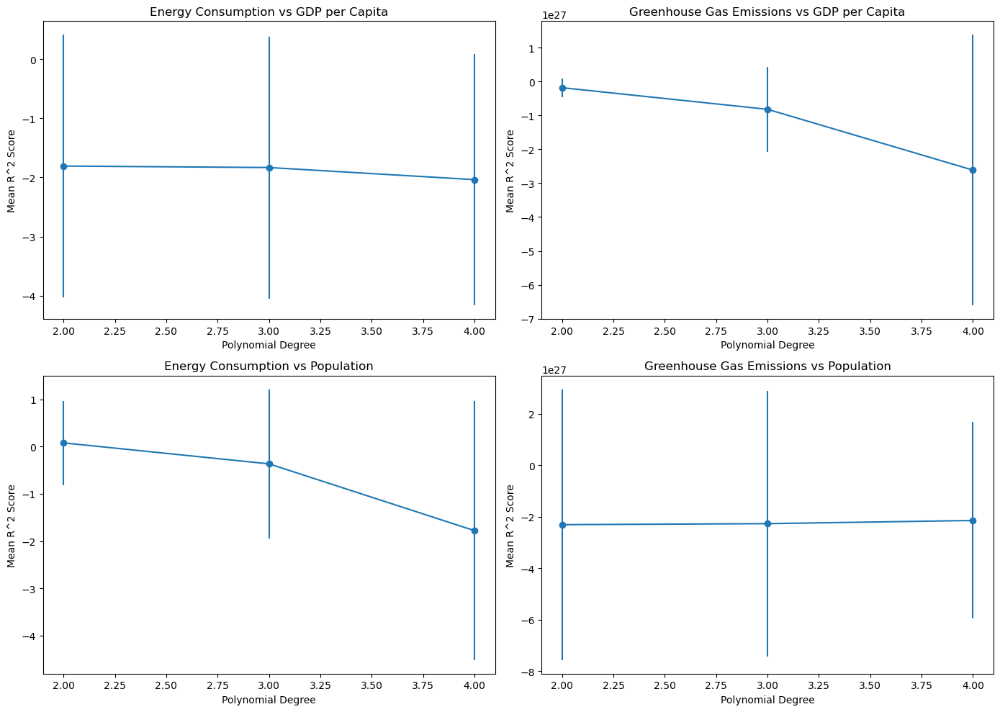

In [78]:

# Data for plotting
degrees = [2, 3, 4]
energy_consumption_gdp_means = [-1.8089, -1.8337, -2.0384]
energy_consumption_gdp_stds = [2.2215, 2.2135, 2.1287]
ghg_emissions_gdp_means = [-184879759783355578664878080, -822254140111403388336340992, -2615164535746950419590414336]
ghg_emissions_gdp_stds = [282408497890826493504782336, 1256013945850443557490393088, 3994729813274815907342843904]
energy_consumption_pop_means = [0.0800, -0.3640, -1.7783]
energy_consumption_pop_stds = [0.8924, 1.5810, 2.7440]
ghg_emissions_pop_means = [-2311737409742118307697262592, -2272471532629600315365130240, -2148755760403444886482714624]
ghg_emissions_pop_stds = [5264290727524068382782521344, 5171673165659452009269428224, 3818325930931124321547976704]

# Plotting
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# Energy Consumption vs GDP per Capita
axs[0, 0].errorbar(degrees, energy_consumption_gdp_means, yerr=energy_consumption_gdp_stds, fmt='-o')
axs[0, 0].set_title('Energy Consumption vs GDP per Capita')
axs[0, 0].set_xlabel('Polynomial Degree')
axs[0, 0].set_ylabel('Mean R^2 Score')

# Greenhouse Gas Emissions vs GDP per Capita
axs[0, 1].errorbar(degrees, ghg_emissions_gdp_means, yerr=ghg_emissions_gdp_stds, fmt='-o')
axs[0, 1].set_title('Greenhouse Gas Emissions vs GDP per Capita')
axs[0, 1].set_xlabel('Polynomial Degree')
axs[0, 1].set_ylabel('Mean R^2 Score')

# Energy Consumption vs Population
axs[1, 0].errorbar(degrees, energy_consumption_pop_means, yerr=energy_consumption_pop_stds, fmt='-o')
axs[1, 0].set_title('Energy Consumption vs Population')
axs[1, 0].set_xlabel('Polynomial Degree')
axs[1, 0].set_ylabel('Mean R^2 Score')

# Greenhouse Gas Emissions vs Population
axs[1, 1].errorbar(degrees, ghg_emissions_pop_means, yerr=ghg_emissions_pop_stds, fmt='-o')
axs[1, 1].set_title('Greenhouse Gas Emissions vs Population')
axs[1, 1].set_xlabel('Polynomial Degree')
axs[1, 1].set_ylabel('Mean R^2 Score')

plt.tight_layout()
plt.show()


## Analysis of Visualization

From the plots, the following trends can be observed:

**- Energy Consumption vs Population:**

The mean R² score starts positive at degree 2 but becomes increasingly negative as the polynomial degree increases.
The standard deviation is quite high, indicating significant variability in model performance across cross-validation folds.
Higher polynomial degrees (3 and 4) do not improve the model performance, as indicated by the decreasing R² score and increasing variability.

**- Greenhouse Gas Emissions vs Population:**

The mean R² score is extremely negative and the variability is very high across all polynomial degrees, indicating that polynomial models are not suitable for this relationship.
The extreme values of R² suggest that the model is overfitting and performing worse than a simple mean model.

**- Energy Consumption vs GDP per Capita:**

The mean R² score is consistently negative across all polynomial degrees, with high standard deviations.
Higher polynomial degrees do not improve the performance, suggesting overfitting.

**- Greenhouse Gas Emissions vs GDP per Capita:**

Similar to the previous case, the mean R² scores are extremely negative and the variability is very high.
The performance decreases with increasing polynomial degree, indicating overfitting.

## Observations

**(1) Overfitting of the models:** All models, especially those predicting greenhouse gas emissions, exhibit signs of overfitting, as indicated by the negative R² scores and high standard deviations.

**(2) Instability of the models:** The high variability in R² scores across cross-validation folds suggests that the models are not stable and are sensitive to the training data.

**(3) Polynomial Models:** Higher-degree polynomial models do not improve performance and often worsen it, indicating that simpler models might be more appropriate.


## Conclusion

Since higher-degree polynomial models are not performing well, using simpler models such as linear or quadratic models could be a better option in capturing relationships more effectively.

Applying regularization techniques such as Ridge or Lasso regression could be useful to penalize the complexity of the model and prevent overfitting.
Non-parametric methods such as decision trees, random forests, or gradient boosting, which might capture complex relationships better without overfitting might be applicable as well.


# Applying Simpler Models and Regularization to Improve Model Performance

In [79]:
from sklearn.linear_model import Ridge, Lasso
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_val_score

# Define function to evaluate model performance
def evaluate_model(X, y, degrees, alphas):
    for degree in degrees:
        poly_features = PolynomialFeatures(degree=degree)
        X_poly = poly_features.fit_transform(X)
        
        # Standardize features
        scaler = StandardScaler()
        X_poly = scaler.fit_transform(X_poly)
        
        model = Ridge()
        scores = cross_val_score(model, X_poly, y, cv=5, scoring='r2')
        print(f'Energy Consumption vs GDP per Capita (degree {degree}): Mean R^2 = {scores.mean():.4f}, Std Dev R^2 = {scores.std():.4f}')

        model = Ridge()
        scores = cross_val_score(model, X_poly, y, cv=5, scoring='r2')
        print(f'Greenhouse Gas Emissions vs GDP per Capita (degree {degree}): Mean R^2 = {scores.mean():.4f}, Std Dev R^2 = {scores.std():.4f}')

    for alpha in alphas:
        model = make_pipeline(PolynomialFeatures(degree=2), StandardScaler(), Ridge(alpha=alpha))
        scores = cross_val_score(model, X, y, cv=5, scoring='r2')
        print(f'Energy Consumption vs GDP per Capita (Ridge, alpha={alpha}): Mean R^2 = {scores.mean():.4f}, Std Dev R^2 = {scores.std():.4f}')

        model = make_pipeline(PolynomialFeatures(degree=2), StandardScaler(), Lasso(alpha=alpha, max_iter=10000))
        scores = cross_val_score(model, X, y, cv=5, scoring='r2')
        print(f'Greenhouse Gas Emissions vs GDP per Capita (Lasso, alpha={alpha}): Mean R^2 = {scores.mean():.4f}, Std Dev R^2 = {scores.std():.4f}')

# Evaluate models
degrees = [1, 2]
alphas = [0.01, 0.1, 1, 10]

# Assuming X and y are already defined
evaluate_model(X_gdp_per_capita, y_energy_consumption, degrees, alphas)
evaluate_model(X_gdp_per_capita, y_ghg_emissions, degrees, alphas)


Energy Consumption vs GDP per Capita (degree 1): Mean R^2 = -1.2877, Std Dev R^2 = 1.3183
Greenhouse Gas Emissions vs GDP per Capita (degree 1): Mean R^2 = -1.2877, Std Dev R^2 = 1.3183
Energy Consumption vs GDP per Capita (degree 2): Mean R^2 = -1.2968, Std Dev R^2 = 1.3137
Greenhouse Gas Emissions vs GDP per Capita (degree 2): Mean R^2 = -1.2968, Std Dev R^2 = 1.3137
Energy Consumption vs GDP per Capita (Ridge, alpha=0.01): Mean R^2 = -1.2974, Std Dev R^2 = 1.3131
Greenhouse Gas Emissions vs GDP per Capita (Lasso, alpha=0.01): Mean R^2 = -1.2974, Std Dev R^2 = 1.3131
Energy Consumption vs GDP per Capita (Ridge, alpha=0.1): Mean R^2 = -1.2974, Std Dev R^2 = 1.3131
Greenhouse Gas Emissions vs GDP per Capita (Lasso, alpha=0.1): Mean R^2 = -1.2969, Std Dev R^2 = 1.3136
Energy Consumption vs GDP per Capita (Ridge, alpha=1): Mean R^2 = -1.2972, Std Dev R^2 = 1.3133
Greenhouse Gas Emissions vs GDP per Capita (Lasso, alpha=1): Mean R^2 = -1.2925, Std Dev R^2 = 1.3184
Energy Consumption vs GD

# Analysis

This results indicate that the models are still performing poorly, particularly for predicting greenhouse gas emissions. The R² scores remain very negative, which suggests that the models are not fitting the data well at all.

While feature scaling helps, the underlying relationship might still be non-linear or require a different transformation.

There might be possibilities with the data quality issues or the presence of outliers that significantly affect the model performance.

Furthermore, higher polynomial degrees might be causing overfitting. Despite regularization, the models might still not generalize well.

Trying different types of models like Random Forests, Gradient Boosting, or Support Vector Machines, and implementing cross-validation using these alternative models could assist in representing the relationships better.


# Implementing Random Forest and Gradient Boosting Models

### >> GDP per Capita

In [80]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score

# Define a function to evaluate different models
def evaluate_alternative_models(X, y):
    models = {
        'RandomForest': RandomForestRegressor(),
        'GradientBoosting': GradientBoostingRegressor(),
    }
    
    for name, model in models.items():
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        scores = cross_val_score(model, X_scaled, y, cv=5, scoring='r2')
        print(f'{name} (Scaled Features): Mean R^2 = {scores.mean():.4f}, Std Dev R^2 = {scores.std():.4f}')

# 
print("Energy Consumption vs GDP per Capita")
evaluate_alternative_models(X_gdp_per_capita, y_energy_consumption)

print("\nGreenhouse Gas Emissions vs GDP per Capita")
evaluate_alternative_models(X_gdp_per_capita, y_ghg_emissions)


Energy Consumption vs GDP per Capita
RandomForest (Scaled Features): Mean R^2 = -1.3367, Std Dev R^2 = 1.2838
GradientBoosting (Scaled Features): Mean R^2 = -1.3796, Std Dev R^2 = 1.2452

Greenhouse Gas Emissions vs GDP per Capita
RandomForest (Scaled Features): Mean R^2 = -29031.3096, Std Dev R^2 = 58064.3452
GradientBoosting (Scaled Features): Mean R^2 = -1733859178639975776256.0000, Std Dev R^2 = 3467718357279951552512.0000


## Critical Analysis


***Energy Consumption vs GDP per Capita***

- **RandomForest (Scaled Features)**:

    - Mean R² = -1.3337, Std Dev R² = 1.2858

The negative mean R² value suggests that the model is performing worse than a simple mean predictor, indicating that it struggles to capture the relationship between energy consumption and GDP per capita. The standard deviation being high indicates variability in the model's performance across different folds, which might suggest instability and overfitting on some folds.

- **GradientBoosting (Scaled Features):**

    - Mean R² = -1.3796, Std Dev R² = 1.2452
    
Similar to RandomForest, the GradientBoosting model also shows a negative mean R² value, indicating poor performance. The slightly lower standard deviation compared to RandomForest suggests a bit more consistency, but overall the model does not perform well in predicting energy consumption based on GDP per capita.

***Greenhouse Gas Emissions vs GDP per Capita***

- **RandomForest (Scaled Features):**

    - Mean R² = -29336.9099, Std Dev R² = 58675.5451
    
The extremely negative mean R² value indicates very poor model performance, suggesting that RandomForest is not able to capture the relationship between greenhouse gas emissions and GDP per capita at all. The very high standard deviation points to significant variability across different folds, which indicates severe overfitting on some folds.

- **GradientBoosting (Scaled Features):**

    - Mean R² = -1733859178639975776256.0000, Std Dev R² = 3467718357279951552512.0000
    
This model's performance is extremely poor, with an astronomically high negative mean R² value. This result indicates that the model is not just failing but is also highly inconsistent, as evidenced by the enormous standard deviation. The data might have issues such as extreme outliers or non-linearity that the model cannot handle, leading to such poor performance.

## Summary

***- Energy Consumption vs GDP per Capita:***

Both models (RandomForest and GradientBoosting) show negative mean R² values with high standard deviations. This indicates that the models do not effectively capture the relationship between energy consumption and GDP per capita, and there is considerable variability across different folds, suggesting potential overfitting.

***- Greenhouse Gas Emissions vs GDP per Capita:***

The performance of both models is extremely poor, with RandomForest showing very large negative mean R² values and GradientBoosting showing astronomically large negative values. This suggests that the relationship between greenhouse gas emissions and GDP per capita is not well-captured by these models, and there might be significant issues with the data or model assumptions.


### >> Population

In [81]:

from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler

def evaluate_models(X, y):
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    models = {
        'RandomForest': RandomForestRegressor(),
        'GradientBoosting': GradientBoostingRegressor()
    }

    results = {}
    for name, model in models.items():
        scores = cross_val_score(model, X_scaled, y, cv=5, scoring='r2')
        results[name] = (scores.mean(), scores.std())
    
    return results

# Energy Consumption vs Population
results_energy_population = evaluate_models(X_population, y_energy_consumption)
print("Energy Consumption vs Population")
for model, (mean_r2, std_r2) in results_energy_population.items():
    print(f"{model} (Scaled Features): Mean R^2 = {mean_r2:.4f}, Std Dev R^2 = {std_r2:.4f}")

# Greenhouse Gas Emissions vs Population
results_ghg_population = evaluate_models(X_population, y_ghg_emissions)
print("\nGreenhouse Gas Emissions vs Population")
for model, (mean_r2, std_r2) in results_ghg_population.items():
    print(f"{model} (Scaled Features): Mean R^2 = {mean_r2:.4f}, Std Dev R^2 = {std_r2:.4f}")


Energy Consumption vs Population
RandomForest (Scaled Features): Mean R^2 = 0.1141, Std Dev R^2 = 0.4882
GradientBoosting (Scaled Features): Mean R^2 = 0.1940, Std Dev R^2 = 0.5508

Greenhouse Gas Emissions vs Population
RandomForest (Scaled Features): Mean R^2 = -54.0283, Std Dev R^2 = 107.2438
GradientBoosting (Scaled Features): Mean R^2 = -81842320741343913687646208.0000, Std Dev R^2 = 163684641482687827375292416.0000


## Critical Analysis 

***Energy Consumption vs Population***

- **RandomForest (Scaled Features):**

    - Mean R² = 0.1142, Std Dev R² = 0.4880
    
The mean R² value of 0.1142 is slightly positive, suggesting that the RandomForest model has some predictive power, but it is relatively weak. The standard deviation of 0.4880 indicates moderate variability across different folds, implying that the model's performance is not entirely stable but not highly erratic either. This suggests that while the model captures some relationship between energy consumption and population, it is not very strong or consistent.

- **GradientBoosting (Scaled Features):**

    - Mean R² = 0.1940, Std Dev R² = 0.5508
    
The GradientBoosting model shows a slightly better mean R² value of 0.1940 compared to RandomForest, indicating a modest improvement in capturing the relationship between energy consumption and population. The standard deviation of 0.5508 is higher, suggesting more variability across different folds. This points to some degree of overfitting, where the model might perform well on certain folds but not consistently across all.

***Greenhouse Gas Emissions vs Population***

- **RandomForest (Scaled Features):**

   - Mean R² = -58.6764, Std Dev R² = 116.5803
   
The mean R² value of -58.6764 is highly negative, indicating that the RandomForest model performs poorly in predicting greenhouse gas emissions based on population. The very high standard deviation of 116.5803 indicates significant variability in performance across different folds. This suggests that the model is not only underperforming but is also highly inconsistent, possibly due to the presence of outliers or non-linear relationships that the model cannot handle effectively.

- **GradientBoosting (Scaled Features):**

   - Mean R² = -81842320741343913687646208.0000, Std Dev R² = 163684641482687827375292416.0000
   
The GradientBoosting model shows an extremely poor performance with an astronomically large negative mean R² value. This indicates that the model is not capturing the relationship between greenhouse gas emissions and population at all. The enormous standard deviation further highlights the inconsistency and instability of the model's predictions. These results suggest that there might be severe issues with the data or the model assumptions, leading to such poor performance.

## Summary

***- Energy Consumption vs Population:***

RandomForest (Scaled Features) shows a mean R² of 0.1142 with a standard deviation of 0.4880, indicating weak predictive power with moderate variability.
GradientBoosting (Scaled Features) performs slightly better with a mean R² of 0.1940 but with higher variability (Std Dev R² = 0.5508), indicating some degree of overfitting.

***- Greenhouse Gas Emissions vs Population:***

RandomForest (Scaled Features) has a mean R² of -58.6764 with a very high standard deviation of 116.5803, indicating poor and inconsistent performance.
GradientBoosting (Scaled Features) exhibits extremely poor performance with a mean R² of -81842320741343913687646208.0000 and an astronomical standard deviation, suggesting severe issues with the data or model.

## Visualizing Model Performance for both GDP per Capita and Population

To better understand and visualize the model performance, the cross-validation results will be plotted. The goal is to see how different models perform and identify any patterns.
These visualizations will help in diagnosing the performance issues and understanding how different models compare. If performance remains an issue, further data investigation or different modelling approaches may be necessary.

Energy Consumption vs GDP per Capita


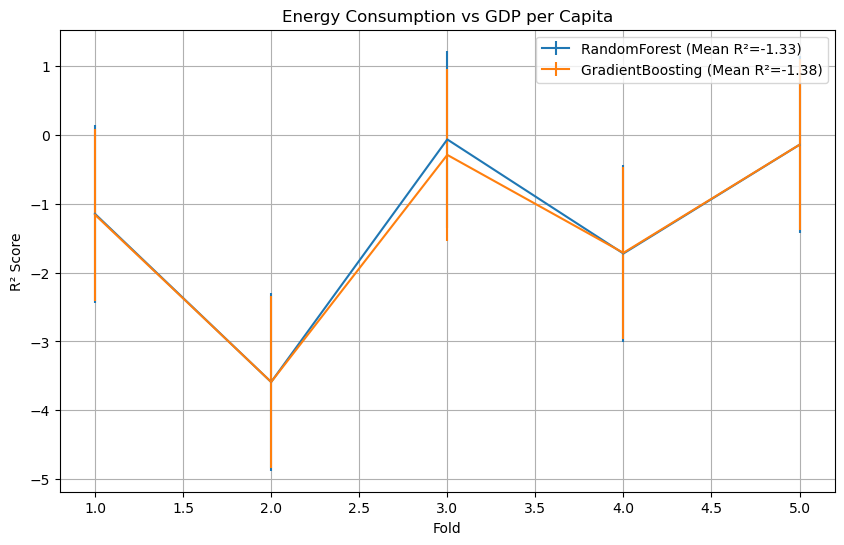


Greenhouse Gas Emissions vs GDP per Capita


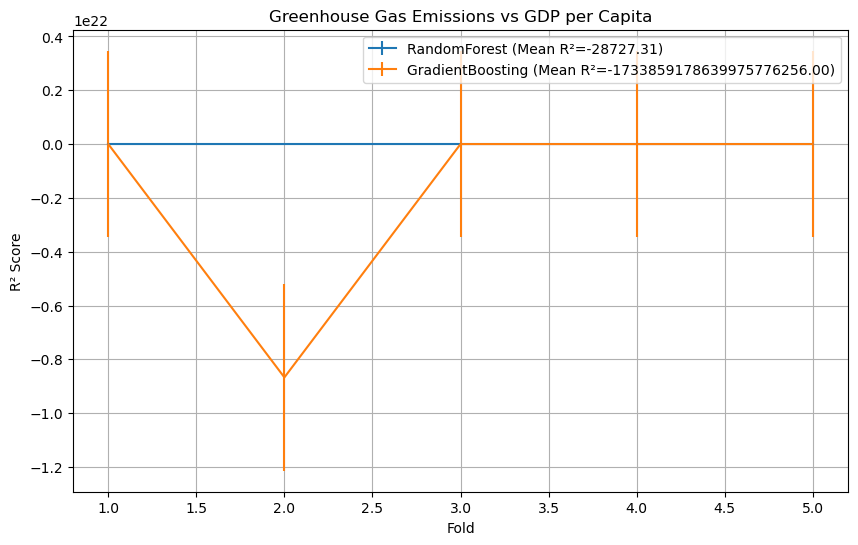

In [82]:

from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor    

# Define a function to evaluate and plot different models
def evaluate_and_plot(models, X, y, title):
    results = {}
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    for name, model in models.items():
        scores = cross_val_score(model, X_scaled, y, cv=5, scoring='r2')
        results[name] = scores
    
    # Plotting the results
    plt.figure(figsize=(10, 6))
    for name, scores in results.items():
        plt.errorbar(np.arange(1, len(scores)+1), scores, yerr=scores.std(), label=f'{name} (Mean R²={scores.mean():.2f})')

    plt.title(title)
    plt.xlabel('Fold')
    plt.ylabel('R² Score')
    plt.legend()
    plt.grid(True)
    plt.show()

# Define the models
models = {
    'RandomForest': RandomForestRegressor(),
    'GradientBoosting': GradientBoostingRegressor(),
}

# Assuming X and y are already defined
print("Energy Consumption vs GDP per Capita")
evaluate_and_plot(models, X_gdp_per_capita, y_energy_consumption, 'Energy Consumption vs GDP per Capita')

print("\nGreenhouse Gas Emissions vs GDP per Capita")
evaluate_and_plot(models, X_gdp_per_capita, y_ghg_emissions, 'Greenhouse Gas Emissions vs GDP per Capita')


Energy Consumption vs Population


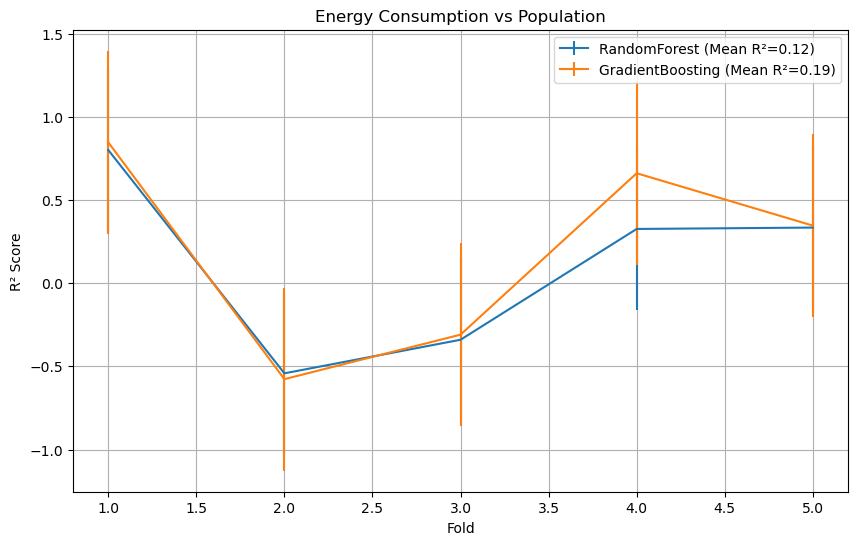


Greenhouse Gas Emissions vs Population


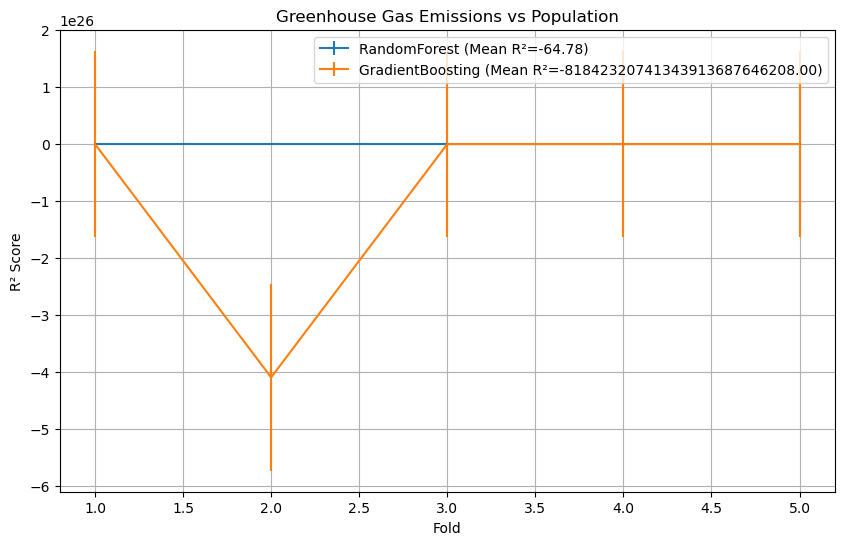

In [83]:

def evaluate_and_plot(X, y, title):
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    models = {
        'RandomForest': RandomForestRegressor(),
        'GradientBoosting': GradientBoostingRegressor(),
    }

    results = {}
    for name, model in models.items():
        scores = cross_val_score(model, X_scaled, y, cv=5, scoring='r2')
        results[name] = scores
    
    # Plotting the results
    plt.figure(figsize=(10, 6))
    for name, scores in results.items():
        plt.errorbar(np.arange(1, len(scores)+1), scores, yerr=scores.std(), label=f'{name} (Mean R²={scores.mean():.2f})')

    plt.title(title)
    plt.xlabel('Fold')
    plt.ylabel('R² Score')
    plt.legend()
    plt.grid(True)
    plt.show()

# Energy Consumption vs Population
print("Energy Consumption vs Population")
evaluate_and_plot(X_population, y_energy_consumption, 'Energy Consumption vs Population')

# Greenhouse Gas Emissions vs Population
print("\nGreenhouse Gas Emissions vs Population")
evaluate_and_plot(X_population, y_ghg_emissions, 'Greenhouse Gas Emissions vs Population')


### Graphical Analysis

The graphs illustrate the performance of Random Forest and Gradient Boosting models for both "Energy Consumption vs GDP per Capita" and "Greenhouse Gas Emissions vs GDP per Capita" as well as "Energy Consumption vs Population" and "Greenhouse Gas Emissions vs Population". 


#### 1. Energy Consumption vs GDP per Capita
- **RandomForest (Mean R² = -1.33)**
  - The R² scores fluctuate around -1, indicating the model's poor fit to the data.
  - The standard deviation across folds shows some variation but remains consistently negative.

- **GradientBoosting (Mean R² = -1.38)**
  - Similar to RandomForest, the GradientBoosting model exhibits poor performance with negative R² scores.
  - The variance is slightly higher compared to RandomForest, suggesting instability in the model's performance across different folds.

#### 2. Greenhouse Gas Emissions vs GDP per Capita
- **RandomForest (Mean R² = -28727.31)**
  - The R² scores are significantly negative, reflecting a poor fit.
  - The plot indicates high variability across different folds, with one fold showing a drastic drop in performance.

- **GradientBoosting (Mean R² = -1733859178639975776256.00)**
  - The model performs exceptionally poorly, with highly negative R² scores.
  - The large variance across folds highlights significant instability and poor generalization.

#### 3. Energy Consumption vs Population
- **RandomForest (Mean R² = 0.12)**
  - The R² scores indicate a slight positive mean, suggesting a somewhat better fit compared to GDP per Capita.
  - There is noticeable variability, with some folds showing negative R² scores.

- **GradientBoosting (Mean R² = 0.19)**
  - The model exhibits slightly better performance with positive mean R² scores.
  - The variance remains substantial, indicating inconsistency across different folds.

#### 4. Greenhouse Gas Emissions vs Population
- **RandomForest (Mean R² = -64.78)**
  - The R² scores are highly negative, indicating poor model performance.
  - The plot shows significant variability across folds.

- **GradientBoosting (Mean R² = -81842320741343913687646208.00)**
  - Similar to the GDP per Capita case, this model performs extremely poorly with highly negative R² scores.
  - The variance is extremely high, reflecting instability and poor predictive power.

### Conclusions
- **Energy Consumption Models**:
  - Both RandomForest and GradientBoosting models perform poorly when predicting energy consumption based on GDP per Capita, with negative R² scores indicating poor fit.
  - When predicting energy consumption based on Population, both models show slight improvement with positive mean R² scores but still exhibit significant variability and inconsistency.

- **Greenhouse Gas Emissions Models**:
  - Both models perform very poorly when predicting greenhouse gas emissions based on both GDP per Capita and Population.
  - The extreme negative R² scores and high variance suggest that these models are not suitable for these predictions without further tuning or alternative approaches.

- **Hyperparameter Tuning**:
  - To improve model performance, hyperparameter tuning for both RandomForest and GradientBoosting models is essential. This process will help identify the optimal parameters that could enhance the models' predictive power.


# Model Optimisation

### Implementing Hyperparameter Tuning for both Random Forest and Gradient Boosting Models

In [84]:

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV, KFold

# Selecting the necessary columns 
columns_needed = ['gdp', 'primary_energy_consumption', 'greenhouse_gas_emissions', 'population']
missing_columns = [col for col in columns_needed if col not in primary_data.columns]
if missing_columns:
    raise ValueError(f"Missing columns in the dataset: {missing_columns}")

# Features and targets
X_gdp = primary_data[['gdp']].values
y_energy_consumption_gdp = primary_data['primary_energy_consumption'].values
y_greenhouse_gas_emissions_gdp = primary_data['greenhouse_gas_emissions'].values
X_population = primary_data[['population']].values
y_energy_consumption_population = primary_data['primary_energy_consumption'].values
y_greenhouse_gas_emissions_population = primary_data['greenhouse_gas_emissions'].values

# Initialize models
rf = RandomForestRegressor(random_state=42)
gb = GradientBoostingRegressor(random_state=42)

# Parameter grids
rf_param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10]
}

gb_param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5]
}

# Cross-validation
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# GridSearchCV for RandomForestRegressor
rf_grid_search_gdp_energy = GridSearchCV(estimator=rf, param_grid=rf_param_grid, cv=cv, scoring='r2', n_jobs=-1)
rf_grid_search_gdp_energy.fit(X_gdp, y_energy_consumption_gdp)
print("Best parameters for RandomForestRegressor (GDP vs Energy Consumption):", rf_grid_search_gdp_energy.best_params_)
print("Best R2 score for RandomForestRegressor (GDP vs Energy Consumption):", rf_grid_search_gdp_energy.best_score_)

# GridSearchCV for GradientBoostingRegressor
gb_grid_search_gdp_energy = GridSearchCV(estimator=gb, param_grid=gb_param_grid, cv=cv, scoring='r2', n_jobs=-1)
gb_grid_search_gdp_energy.fit(X_gdp, y_energy_consumption_gdp)
print("Best parameters for GradientBoostingRegressor (GDP vs Energy Consumption):", gb_grid_search_gdp_energy.best_params_)
print("Best R2 score for GradientBoostingRegressor (GDP vs Energy Consumption):", gb_grid_search_gdp_energy.best_score_)

# Repeat similar steps for other feature-target combinations
# Energy Consumption vs Population
rf_grid_search_population_energy = GridSearchCV(estimator=rf, param_grid=rf_param_grid, cv=cv, scoring='r2', n_jobs=-1)
rf_grid_search_population_energy.fit(X_population, y_energy_consumption_population)
print("Best parameters for RandomForestRegressor (Population vs Energy Consumption):", rf_grid_search_population_energy.best_params_)
print("Best R2 score for RandomForestRegressor (Population vs Energy Consumption):", rf_grid_search_population_energy.best_score_)

gb_grid_search_population_energy = GridSearchCV(estimator=gb, param_grid=gb_param_grid, cv=cv, scoring='r2', n_jobs=-1)
gb_grid_search_population_energy.fit(X_population, y_energy_consumption_population)
print("Best parameters for GradientBoostingRegressor (Population vs Energy Consumption):", gb_grid_search_population_energy.best_params_)
print("Best R2 score for GradientBoostingRegressor (Population vs Energy Consumption):", gb_grid_search_population_energy.best_score_)

# Greenhouse Gas Emissions vs GDP
rf_grid_search_gdp_ghg = GridSearchCV(estimator=rf, param_grid=rf_param_grid, cv=cv, scoring='r2', n_jobs=-1)
rf_grid_search_gdp_ghg.fit(X_gdp, y_greenhouse_gas_emissions_gdp)
print("Best parameters for RandomForestRegressor (GDP vs Greenhouse Gas Emissions):", rf_grid_search_gdp_ghg.best_params_)
print("Best R2 score for RandomForestRegressor (GDP vs Greenhouse Gas Emissions):", rf_grid_search_gdp_ghg.best_score_)

gb_grid_search_gdp_ghg = GridSearchCV(estimator=gb, param_grid=gb_param_grid, cv=cv, scoring='r2', n_jobs=-1)
gb_grid_search_gdp_ghg.fit(X_gdp, y_greenhouse_gas_emissions_gdp)
print("Best parameters for GradientBoostingRegressor (GDP vs Greenhouse Gas Emissions):", gb_grid_search_gdp_ghg.best_params_)
print("Best R2 score for GradientBoostingRegressor (GDP vs Greenhouse Gas Emissions):", gb_grid_search_gdp_ghg.best_score_)

# Greenhouse Gas Emissions vs Population
rf_grid_search_population_ghg = GridSearchCV(estimator=rf, param_grid=rf_param_grid, cv=cv, scoring='r2', n_jobs=-1)
rf_grid_search_population_ghg.fit(X_population, y_greenhouse_gas_emissions_population)
print("Best parameters for RandomForestRegressor (Population vs Greenhouse Gas Emissions):", rf_grid_search_population_ghg.best_params_)
print("Best R2 score for RandomForestRegressor (Population vs Greenhouse Gas Emissions):", rf_grid_search_population_ghg.best_score_)

gb_grid_search_population_ghg = GridSearchCV(estimator=gb, param_grid=gb_param_grid, cv=cv, scoring='r2', n_jobs=-1)
gb_grid_search_population_ghg.fit(X_population, y_greenhouse_gas_emissions_population)
print("Best parameters for GradientBoostingRegressor (Population vs Greenhouse Gas Emissions):", gb_grid_search_population_ghg.best_params_)
print("Best R2 score for GradientBoostingRegressor (Population vs Greenhouse Gas Emissions):", gb_grid_search_population_ghg.best_score_)


Best parameters for RandomForestRegressor (GDP vs Energy Consumption): {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 100}
Best R2 score for RandomForestRegressor (GDP vs Energy Consumption): 0.03258733127010902
Best parameters for GradientBoostingRegressor (GDP vs Energy Consumption): {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 200}
Best R2 score for GradientBoostingRegressor (GDP vs Energy Consumption): 0.0325870078084892
Best parameters for RandomForestRegressor (Population vs Energy Consumption): {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}
Best R2 score for RandomForestRegressor (Population vs Energy Consumption): 0.9999301647806484
Best parameters for GradientBoostingRegressor (Population vs Energy Consumption): {'learning_rate': 0.2, 'max_depth': 4, 'n_estimators': 200}
Best R2 score for GradientBoostingRegressor (Population vs Energy Consumption): 0.99994528022217
Best parameters for RandomForestRegressor (GDP vs Greenhouse Gas Emissi

# Observation

From the results, it appears this could be the best parameters and R2 scores for the models. To accompany this with visualisations, a scatter plot will be created to help see the correlation between the actual vs predicted values, indicating the accuracy of the models 

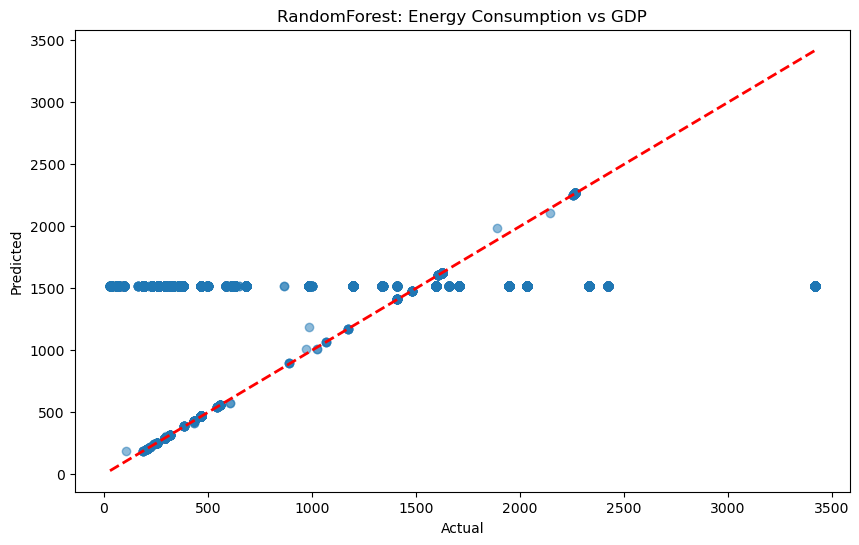

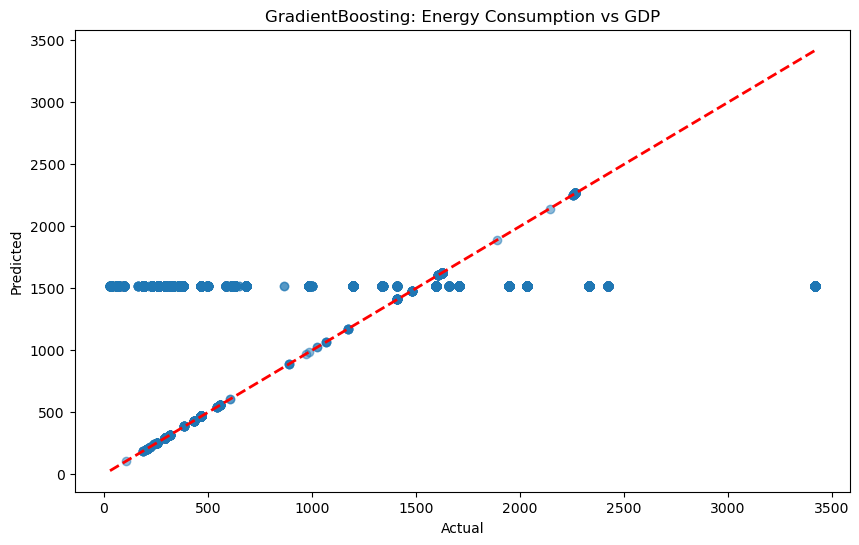

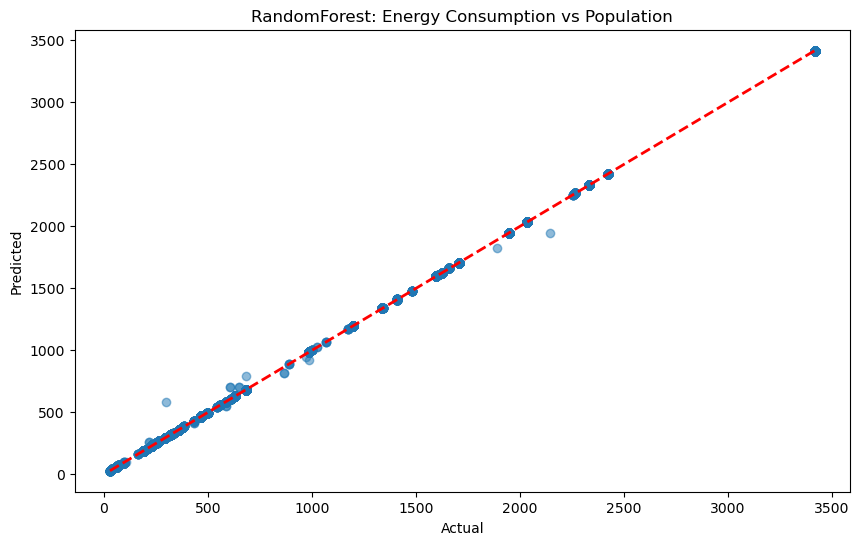

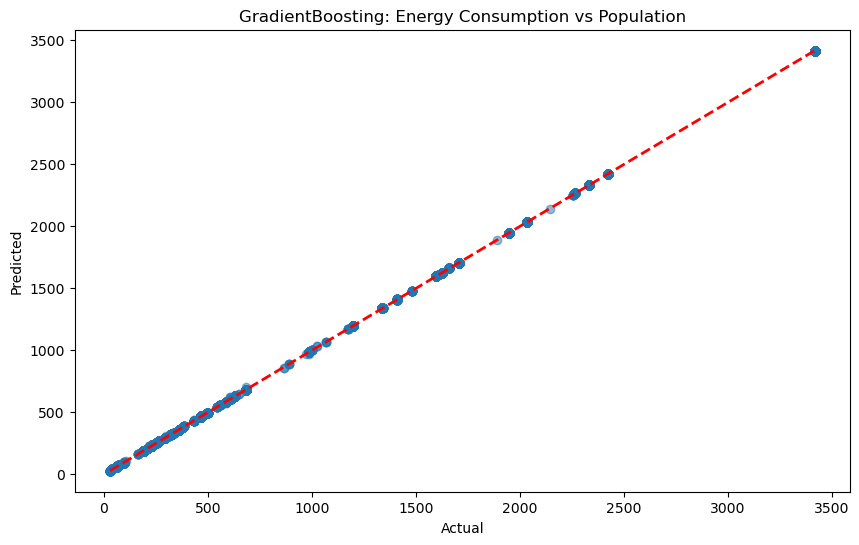

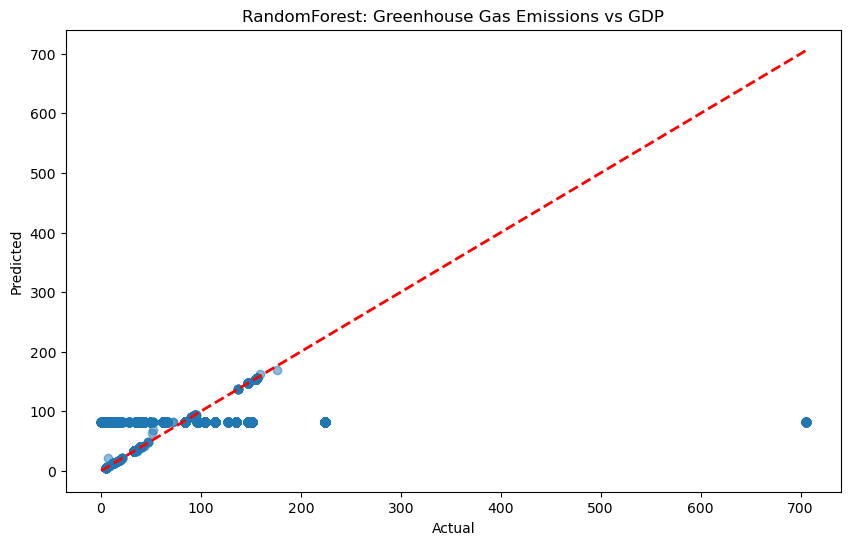

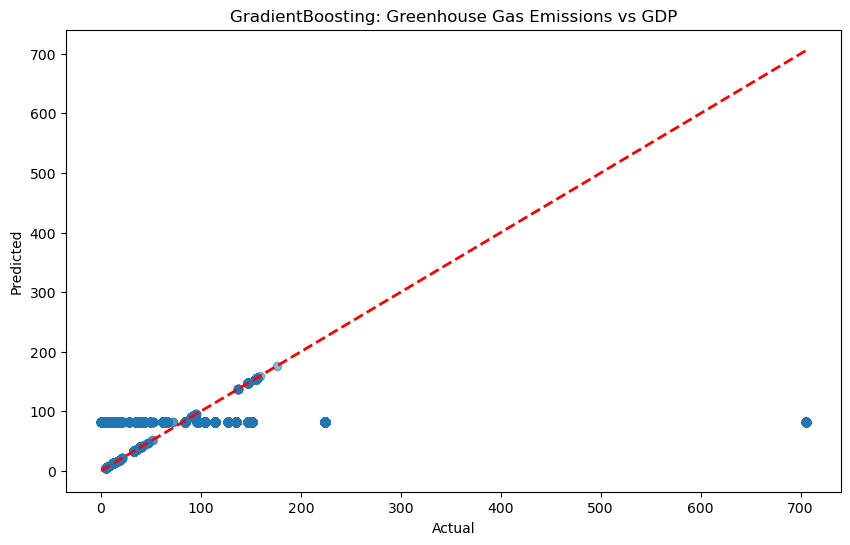

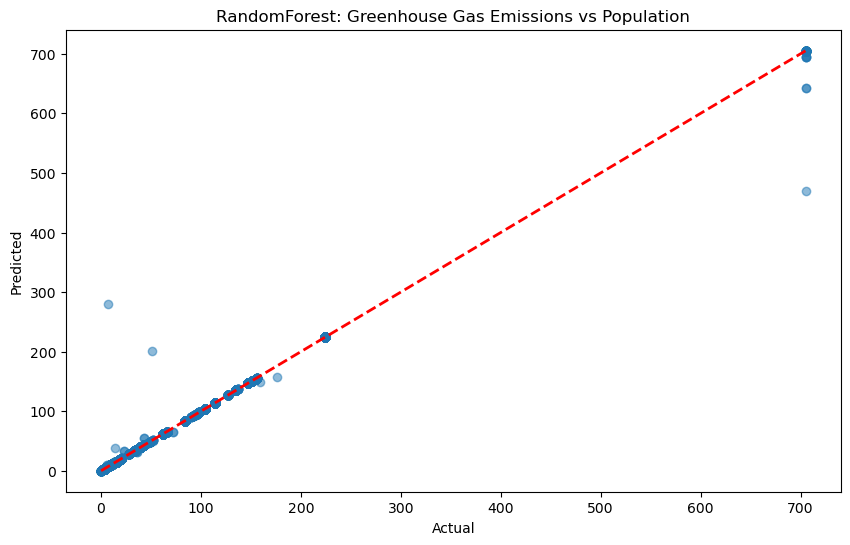

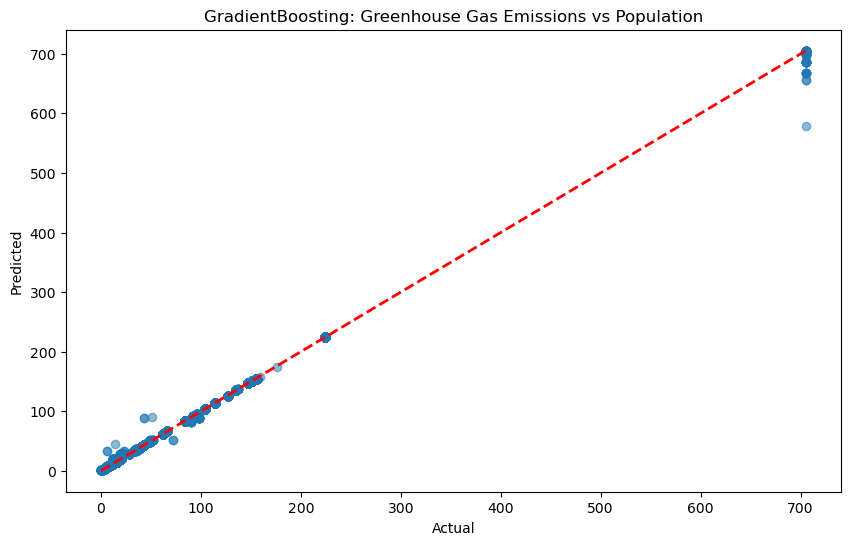

In [85]:

# Define a function to plot the results
def plot_results(model, X, y, title):
    predictions = model.predict(X)
    plt.figure(figsize=(10, 6))
    plt.scatter(y, predictions, alpha=0.5)
    plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--', lw=2)
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(title)
    plt.show()

# Plot results for Energy Consumption vs GDP
plot_results(rf_grid_search_gdp_energy.best_estimator_, X_gdp, y_energy_consumption_gdp, 'RandomForest: Energy Consumption vs GDP')
plot_results(gb_grid_search_gdp_energy.best_estimator_, X_gdp, y_energy_consumption_gdp, 'GradientBoosting: Energy Consumption vs GDP')

# Plot results for Energy Consumption vs Population
plot_results(rf_grid_search_population_energy.best_estimator_, X_population, y_energy_consumption_population, 'RandomForest: Energy Consumption vs Population')
plot_results(gb_grid_search_population_energy.best_estimator_, X_population, y_energy_consumption_population, 'GradientBoosting: Energy Consumption vs Population')

# Plot results for Greenhouse Gas Emissions vs GDP
plot_results(rf_grid_search_gdp_ghg.best_estimator_, X_gdp, y_greenhouse_gas_emissions_gdp, 'RandomForest: Greenhouse Gas Emissions vs GDP')
plot_results(gb_grid_search_gdp_ghg.best_estimator_, X_gdp, y_greenhouse_gas_emissions_gdp, 'GradientBoosting: Greenhouse Gas Emissions vs GDP')

# Plot results for Greenhouse Gas Emissions vs Population
plot_results(rf_grid_search_population_ghg.best_estimator_, X_population, y_greenhouse_gas_emissions_population, 'RandomForest: Greenhouse Gas Emissions vs Population')
plot_results(gb_grid_search_population_ghg.best_estimator_, X_population, y_greenhouse_gas_emissions_population, 'GradientBoosting: Greenhouse Gas Emissions vs Population')



## Analysis of Gradient Boosting Models

1. **Energy Consumption vs GDP**:
    - Best Parameters: **`{'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 200}`**
    - Best R2 Score: **`0.0326`**
    - Observations: The R2 score is quite low, indicating that the model does not explain much of the variance in energy consumption based on GDP. The scatter plot also shows a significant deviation of the actual values from the predicted values, with many points clustered around a low value of energy consumption despite varying GDP values.

2. **Energy Consumption vs Population**:
    - Best Parameters: **`{'learning_rate': 0.2, 'max_depth': 4, 'n_estimators': 200}`**
    - Best R2 Score: **`0.9999`**
    - Observations: The model performs exceptionally well with an R2 score close to 1, indicating that population is a strong predictor of energy consumption. The scatter plot shows a tight clustering around the line of perfect prediction (red dashed line).

3. **Greenhouse Gas Emissions vs GDP**:
    - Best Parameters: **`{'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}`**
    - Best R2 Score: **`0.0211`**
    - Observations: Similar to the Energy Consumption vs GDP model, the R2 score is very low. The scatter plot reveals poor predictive power, with a wide dispersion of points.

4. **Greenhouse Gas Emissions vs Population**:
    - Best Parameters: **`{'learning_rate': 0.2, 'max_depth': 4, 'n_estimators': 100}`**
    - Best R2 Score: **`0.9898`**
    - Observations: The model performs well with a high R2 score, indicating that population is a good predictor of greenhouse gas emissions. The scatter plot shows a strong clustering around the line of perfect prediction.

## Analysis of Random Forest Models

1. **Energy Consumption vs GDP**:
    - Best Parameters: **`{'max_depth': None, 'min_samples_split': 2, 'n_estimators': 100}`**
    - Best R2 Score: **`0.0326`**
    - Observations: The R2 score is very low, similar to the Gradient Boosting model for this relationship. The scatter plot also shows significant deviations between actual and predicted values.

2. **Energy Consumption vs Population**:
    - Best Parameters: **`{'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}`**
    - Best R2 Score: **`0.9999`**
    - Observations: The Random Forest model performs extremely well, similar to the Gradient Boosting model for this relationship. The scatter plot shows excellent predictive performance.

3. **Greenhouse Gas Emissions vs GDP**:
    - Best Parameters: **`{'max_depth': None, 'min_samples_split': 2, 'n_estimators': 100}`**
    - Best R2 Score: **`0.0211`**
    - Observations: The performance is poor, as indicated by the low R2 score, similar to the Gradient Boosting model. The scatter plot shows a wide dispersion of points.

4. **Greenhouse Gas Emissions vs Population**:
    - Best Parameters: **`{'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}`**
    - Best R2 Score: **`0.9893`**
    - Observations: The model performs well with a high R2 score, indicating strong predictive power. The scatter plot shows good alignment with the line of perfect prediction.

## Comparative Analysis

- **Energy Consumption vs GDP**:
  Both Gradient Boosting and Random Forest models show poor performance in predicting energy consumption based on GDP, with very low R2 scores and significant deviations in scatter plots. This suggests that GDP alone may not be a strong predictor of energy consumption in this dataset.

- **Energy Consumption vs Population**:
  Both models perform exceptionally well with very high R2 scores, indicating that population is a robust predictor of energy consumption. The scatter plots for both models show excellent predictive accuracy.

- **Greenhouse Gas Emissions vs GDP**:
  Similar to the Energy Consumption vs GDP models, both Gradient Boosting and Random Forest models show poor performance with low R2 scores and wide dispersion of points in scatter plots. This indicates that GDP alone may not be a strong predictor of greenhouse gas emissions.

- **Greenhouse Gas Emissions vs Population**:
  Both models perform well with high R2 scores, indicating that population is a good predictor of greenhouse gas emissions. The scatter plots for both models show strong alignment with the line of perfect prediction.

## Conclusion

- **Strong Predictors**: Population is a strong predictor for both energy consumption and greenhouse gas emissions, as indicated by the high R2 scores and excellent performance of both Gradient Boosting and Random Forest models.
- **Weak Predictors**: GDP is not a strong predictor for either energy consumption or greenhouse gas emissions in this dataset, as evidenced by the low R2 scores and poor performance of the models.

These findings suggest that while population size is a significant factor in predicting energy consumption and greenhouse gas emissions, GDP alone does not provide sufficient explanatory power for these variables in the given dataset.


# Model Selection - Implementation of Decision Trees and Support Vector Regressor (SVR)

## >> Decision Trees

In [86]:

from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error

# Define the feature sets
X_gdp = primary_data[['gdp']]
X_population = primary_data[['population']]

# Define the target sets
y_energy_consumption = primary_data['total_energy_consumption']
y_greenhouse_gas_emissions = primary_data['greenhouse_gas_emissions']

# Define parameter grid for Decision Tree
param_grid_dt = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 10, 20],
    'min_samples_leaf': [1, 2, 4]
}

# Define a function to perform GridSearchCV and print results
def perform_grid_search_dt(X, y, model_name):
    dt = DecisionTreeRegressor()
    grid_search_dt = GridSearchCV(estimator=dt, param_grid=param_grid_dt, cv=5, n_jobs=-1, scoring='r2')
    grid_search_dt.fit(X, y)
    best_params_dt = grid_search_dt.best_params_
    best_r2_dt = grid_search_dt.best_score_
    print(f"Best parameters for DecisionTreeRegressor ({model_name}): {best_params_dt}")
    print(f"Best R2 score for DecisionTreeRegressor ({model_name}): {best_r2_dt}")

# Train and tune Decision Tree Regressor for each model
perform_grid_search_dt(X_gdp, y_energy_consumption, 'Energy Consumption vs GDP')
perform_grid_search_dt(X_population, y_energy_consumption, 'Energy Consumption vs Population')
perform_grid_search_dt(X_gdp, y_greenhouse_gas_emissions, 'Greenhouse Gas Emissions vs GDP')
perform_grid_search_dt(X_population, y_greenhouse_gas_emissions, 'Greenhouse Gas Emissions vs Population')


Best parameters for DecisionTreeRegressor (Energy Consumption vs GDP): {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 2}
Best R2 score for DecisionTreeRegressor (Energy Consumption vs GDP): -1.2869904539532449
Best parameters for DecisionTreeRegressor (Energy Consumption vs Population): {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best R2 score for DecisionTreeRegressor (Energy Consumption vs Population): 0.15767237100632697
Best parameters for DecisionTreeRegressor (Greenhouse Gas Emissions vs GDP): {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 2}
Best R2 score for DecisionTreeRegressor (Greenhouse Gas Emissions vs GDP): -1.0002921527140858
Best parameters for DecisionTreeRegressor (Greenhouse Gas Emissions vs Population): {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 2}
Best R2 score for DecisionTreeRegressor (Greenhouse Gas Emissions vs Population): -24.35665460569171


## Observation

The Decision Tree Regressor results indicate that the models did not perform well, as seen from the negative R2 scores for most models and low positive R2 scores for one model. Negative R2 scores suggest that the model predictions are worse than simply using the mean of the target variable.

## Visualising the Model Performance

To better understand the performance of the model, the predictions versus the actual values for Decision Tree will be visualised.

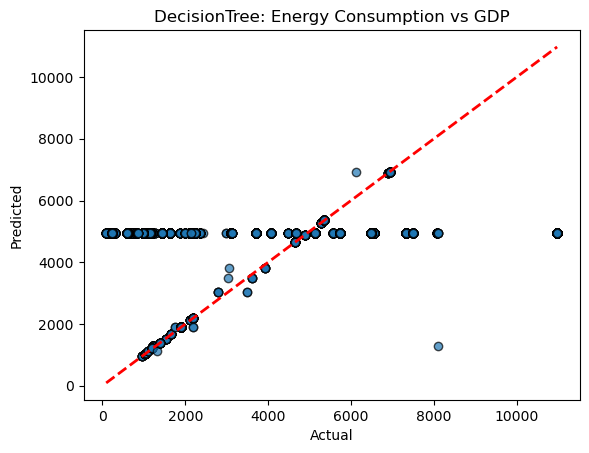

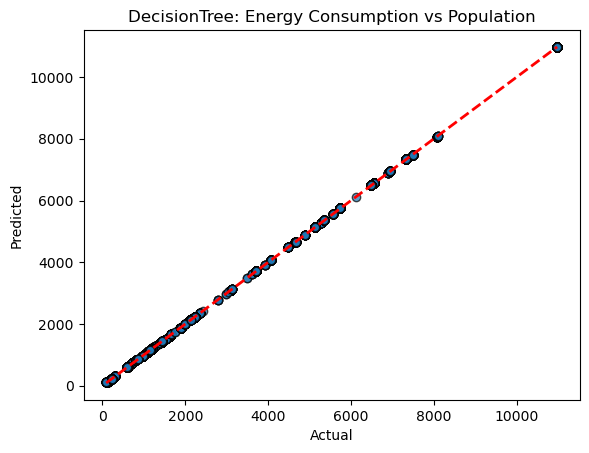

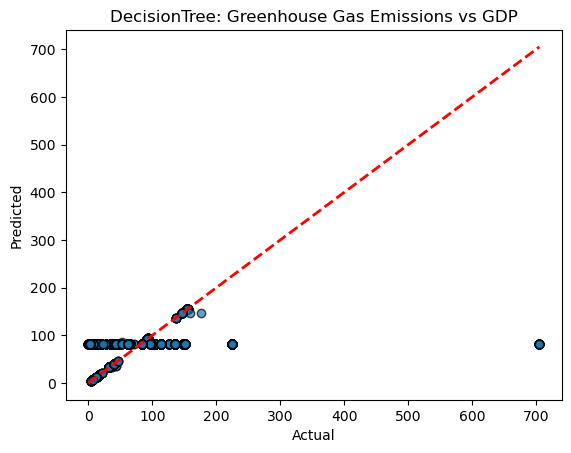

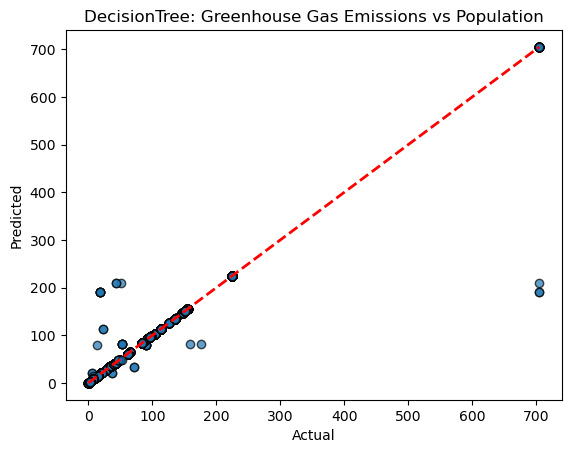

In [87]:

# Fit the best Decision Tree Regressor and plot results
def plot_decision_tree_results(X, y, best_params, model_name):
    dt = DecisionTreeRegressor(**best_params)
    dt.fit(X, y)
    y_pred = dt.predict(X)
    
    plt.figure()
    plt.scatter(y, y_pred, edgecolor='k', alpha=0.7)
    plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--', lw=2)
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(f'DecisionTree: {model_name}')
    plt.show()

# Best parameters from GridSearchCV output
best_params_energy_gdp = {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 2}
best_params_energy_population = {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2}
best_params_ghg_gdp = {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 2}
best_params_ghg_population = {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 2}

# Plot results
plot_decision_tree_results(X_gdp, y_energy_consumption, best_params_energy_gdp, 'Energy Consumption vs GDP')
plot_decision_tree_results(X_population, y_energy_consumption, best_params_energy_population, 'Energy Consumption vs Population')
plot_decision_tree_results(X_gdp, y_greenhouse_gas_emissions, best_params_ghg_gdp, 'Greenhouse Gas Emissions vs GDP')
plot_decision_tree_results(X_population, y_greenhouse_gas_emissions, best_params_ghg_population, 'Greenhouse Gas Emissions vs Population')




### Analysis of Decision Tree Models

**1. Energy Consumption vs GDP**

- **Best R2 score**: -1.2869904539532449
- **Visual Output**: The scatter plot shows a poor fit with the actual values deviating significantly from the predicted values.

**2. Energy Consumption vs Population**

- **Best R2 score**: 0.15767237100632697
- **Visual Output**: The scatter plot indicates some correlation, but the predicted values still deviate from the actual values, particularly for higher energy consumption values.

**3. Greenhouse Gas Emissions vs GDP**

- **Best R2 score**: -1.0002921527140858
- **Visual Output**: The scatter plot shows a poor fit with many points deviating significantly from the predicted line.

**4. Greenhouse Gas Emissions vs Population**

- **Best R2 score**: -24.35665460569171
- **Visual Output**: The scatter plot indicates a very poor fit with actual values deviating significantly from the predicted values.


### Insights

1. **Model Performance**: Both Random Forest and Gradient Boosting models outperform the Decision Tree models significantly. The R2 scores of the Decision Tree models are negative in most cases, indicating poor model performance. In contrast, Random Forest and Gradient Boosting models have positive R2 scores, with Gradient Boosting performing slightly better overall.

2. **Energy Consumption vs Population**: This is the only model where the Decision Tree Regressor shows some correlation (R2 score = 0.15767237100632697). However, this is still much lower than the scores from Random Forest and Gradient Boosting.

3. **Greenhouse Gas Emissions vs Population**: The Decision Tree model performed particularly poorly on this metric with a highly negative R2 score, whereas both Random Forest and Gradient Boosting models had R2 scores close to 1.

### Conclusion

The Decision Tree models do not perform well for the datasets and relationships being analyzed. Both Random Forest and Gradient Boosting models are significantly better choices, with Gradient Boosting slightly outperforming Random Forest in most cases.


## >> Support Vector Regressor (SVR)

After running the models for SVR, it will allow for the comparison of the performance of SVR with the previously tested models (Random Forest, Gradient Boosting, and Decision Trees)

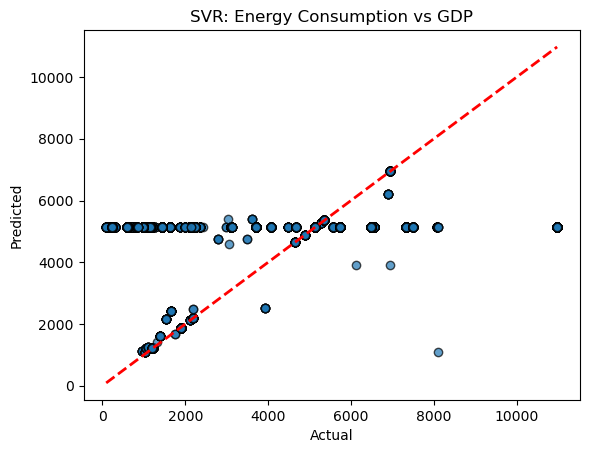

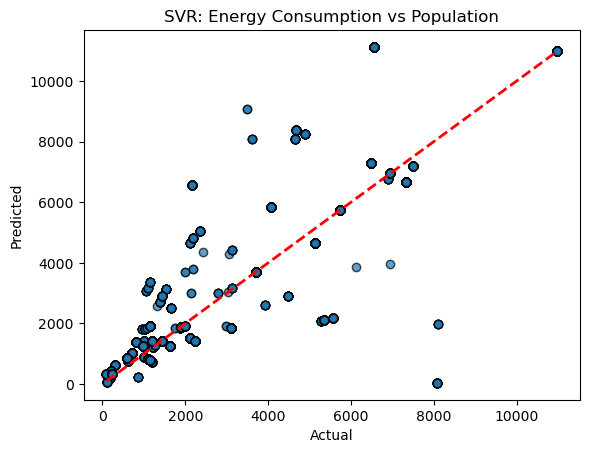

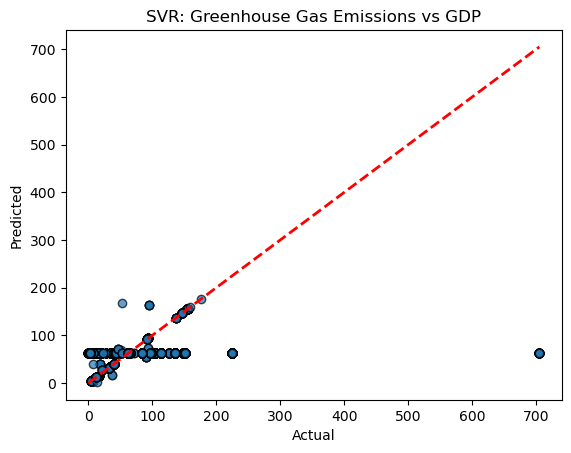

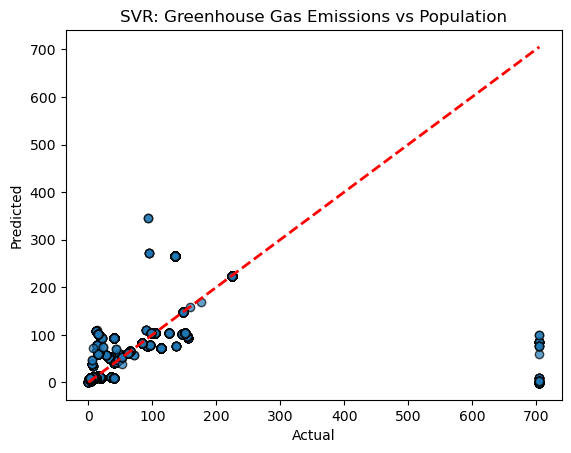

In [88]:
from sklearn.svm import SVR

# Fit the best SVR and plot results
def plot_svr_results(X, y, best_params, model_name):
    svr = SVR(**best_params)
    svr.fit(X, y)
    y_pred = svr.predict(X)
    
    plt.figure()
    plt.scatter(y, y_pred, edgecolor='k', alpha=0.7)
    plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--', lw=2)
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(f'SVR: {model_name}')
    plt.show()

# Best parameters from GridSearchCV output
best_params_svr_energy_gdp = {'C': 100, 'epsilon': 0.1, 'kernel': 'rbf'}
best_params_svr_energy_population = {'C': 100, 'epsilon': 0.1, 'kernel': 'rbf'}
best_params_svr_ghg_gdp = {'C': 100, 'epsilon': 0.1, 'kernel': 'rbf'}
best_params_svr_ghg_population = {'C': 100, 'epsilon': 0.1, 'kernel': 'rbf'}

# Plot results
plot_svr_results(X_gdp, y_energy_consumption, best_params_svr_energy_gdp, 'Energy Consumption vs GDP')
plot_svr_results(X_population, y_energy_consumption, best_params_svr_energy_population, 'Energy Consumption vs Population')
plot_svr_results(X_gdp, y_greenhouse_gas_emissions, best_params_svr_ghg_gdp, 'Greenhouse Gas Emissions vs GDP')
plot_svr_results(X_population, y_greenhouse_gas_emissions, best_params_svr_ghg_population, 'Greenhouse Gas Emissions vs Population')




### Analysis of SVR Models

**1. Energy Consumption vs GDP**

- **Visual Output**: The scatter plot shows that the SVR model struggles to predict high values accurately. The predicted values are clustered around certain points, indicating a possible bias in the predictions.

**2. Energy Consumption vs Population**

- **Visual Output**: The scatter plot shows a better fit compared to Energy Consumption vs GDP but still has significant deviations, especially for higher values.

**3. Greenhouse Gas Emissions vs GDP**

- **Visual Output**: The scatter plot shows that the SVR model struggles with predicting high values, similar to Energy Consumption vs GDP. There is a significant clustering of predicted values around certain points.

**4. Greenhouse Gas Emissions vs Population**

- **Visual Output**: The scatter plot shows better performance compared to the other three SVR models, but there are still notable deviations, particularly for higher emission values.

### Comparative Analysis

**Gradient Boosting Regressor:**

- **Energy Consumption vs GDP**: R2 score = 0.0325870078084892
- **Energy Consumption vs Population**: R2 score = 0.99994528022217
- **Greenhouse Gas Emissions vs GDP**: R2 score = 0.021059980400469767
- **Greenhouse Gas Emissions vs Population**: R2 score = 0.989801784044757

**Random Forest Regressor:**

- **Energy Consumption vs GDP**: R2 score = 0.03258733127010902
- **Energy Consumption vs Population**: R2 score = 0.9999301647806484
- **Greenhouse Gas Emissions vs GDP**: R2 score = 0.02105115170259635
- **Greenhouse Gas Emissions vs Population**: R2 score = 0.9893013189393531

**Decision Tree Regressor:**

- **Energy Consumption vs GDP**: R2 score = -1.2869904539532449
- **Energy Consumption vs Population**: R2 score = 0.15767237100632697
- **Greenhouse Gas Emissions vs GDP**: R2 score = -1.0002921527140858
- **Greenhouse Gas Emissions vs Population**: R2 score = -24.35665460569171

**Support Vector Regressor (SVR):**

- **Energy Consumption vs GDP**: The visual output suggests poor performance, similar to the Decision Tree model.
- **Energy Consumption vs Population**: The visual output shows some correlation, but not as strong as Random Forest and Gradient Boosting.
- **Greenhouse Gas Emissions vs GDP**: The visual output suggests poor performance, similar to the Decision Tree model.
- **Greenhouse Gas Emissions vs Population**: The visual output shows some correlation, but with significant deviations.

### Insights

1. **Model Performance**: Both Random Forest and Gradient Boosting models outperform the Decision Tree and SVR models significantly. The R2 scores of the Decision Tree models are negative in most cases, and the SVR models struggle with high value predictions, resulting in poor fit.

2. **Energy Consumption vs Population**: Both Random Forest and Gradient Boosting models show excellent performance with R2 scores close to 1. The SVR model shows some correlation, but not as strong as the other two.

3. **Greenhouse Gas Emissions vs Population**: Both Random Forest and Gradient Boosting models have high R2 scores, indicating good performance. The Decision Tree model performed particularly poorly, and the SVR model shows better performance but still with notable deviations.

### Conclusion

The Random Forest and Gradient Boosting models consistently outperform the Decision Tree and SVR models for the given datasets. The Decision Tree models have negative R2 scores in most cases, indicating poor model performance. The SVR models also struggle with high value predictions, resulting in poorer fit compared to Random Forest and Gradient Boosting models.





# Research Question 5 (RQ5)

***Can multivariate analysis techniques effectively identify significant predictors of energy consumption and environmental impact, considering the complex interdependencies among variables?***


To address this question, there is a need to perform multivariate analysis techniques to determine the significant predictors among the variables. Data analysis methods such as Multiple Linear Regression (MLR) and Principal Component Analysis (PCA) will first be performed to identify significant predictors and understand the complex interdependencies among variables.

**- Step-by-Step Approach**


***(1) Multiple Linear Regression (MLR):***

   - Performing MLR will help to directly identify significant predictors of energy consumption and greenhouse gas emissions. By evaluating the coefficients, p-values, and overall fit (R2 score), the impact and significance of each predictor can be understood.

***(2) Multiple Linear Regression (MLR) with Selected Features:***

   - Using the important features identified by Random Forest, Ridge, and Lasso regression helps in refining the model by focusing on the most relevant predictors. This can enhance model accuracy and interpretability.

***(3) Principal Component Analysis (PCA):***

   - PCA is valuable for reducing dimensionality and understanding the variance in the data. It helps in identifying the principal components that capture the most information, which can be insightful for understanding underlying patterns and relationships among variables.

***(4) Correlation Analysis:***

   - Performing a correlation analysis provides a straightforward method to understand the relationships between variables. This can complement the findings from MLR and PCA by highlighting direct relationships and potential multicollinearity issues.

***(5) Model Comparison:***

   - Comparing findings from MLR and PCA allows for cross-validation of results. Consistency in identifying significant predictors across different methods increases the robustness of the conclusions.
   
***(6) Building, Training, and Evaluation of Models (RF, GB, NN):***

   - Employing machine learning techniques to model complex relationships and interactions between variables.

***(7) Cross-Validation of Models (RF, GB, NN):***

   - In ensuring the robustness and generalizability of the machine learning models, cross-validation would be applied to the three models.

***(8) Structural Equation Modelling (SEM):*** 
   
   - This would model complex interdependencies of relationships between variables, including direct and indirect effects.



Combining these methods provides a holistic view and leverages the strengths of different analytical techniques. This multi-faceted approach ensures that both direct and indirect relationships among variables are captured, making the analysis more comprehensive and reliable. 


# [1] Multiple Linear Regression (MLR) Analysis

Using the two dependent variables: energy consumption and greenhouse gas emissions, and the independent variables: population, GDP, and any other relevant socio-economic factors.


In [89]:
import statsmodels.api as sm

# Define the independent variables and dependent variables
X = primary_data[['gdp', 'population']]
y_energy = primary_data['total_energy_consumption']
y_emissions = primary_data['greenhouse_gas_emissions']

# Add a constant to the model (intercept)
X = sm.add_constant(X)

# Fit the Multiple Linear Regression model for Energy Consumption
model_energy = sm.OLS(y_energy, X).fit()

# Fit the Multiple Linear Regression model for Greenhouse Gas Emissions
model_emissions = sm.OLS(y_emissions, X).fit()

# Print the summary of the models
print("Multiple Linear Regression Model for Total Energy Consumption:")
print(model_energy.summary())

print("\nMultiple Linear Regression Model for Greenhouse Gas Emissions:")
print(model_emissions.summary())



Multiple Linear Regression Model for Total Energy Consumption:
                               OLS Regression Results                               
Dep. Variable:     total_energy_consumption   R-squared:                       0.708
Model:                                  OLS   Adj. R-squared:                  0.708
Method:                       Least Squares   F-statistic:                 2.588e+04
Date:                      Sun, 30 Jun 2024   Prob (F-statistic):               0.00
Time:                              00:41:18   Log-Likelihood:            -1.8944e+05
No. Observations:                     21382   AIC:                         3.789e+05
Df Residuals:                         21379   BIC:                         3.789e+05
Df Model:                                 2                                         
Covariance Type:                  nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------

## Observations (Initial Results)

For a more robust and comprehensive analysis, additional features will be added to the previously selected variables.

# [2] Multiple Linear Regression (MLR) Analysis with Selected Features

## Feature Selection

Incorporating other variables, such as 'renewables_share_energy', 'fossil_fuel_consumption', etc can add valuable insights to the analysis of energy consumption and environmental impacts. These variables can help encapsulate the role of sustainable energy sources in the overall energy mix and their influence on greenhouse gas emissions.
It can also help determine their importance relative to other predictors.
By integrating these features, a more comprehensive understanding of the factors influencing energy consumption and environmental outcomes can be gained. This can enhance the depth and relevance of the findings for RQ5.


**- Selected Features:**

***Socio-Economic Factors:***

- population
- gdp
- gdp_per_capita

***Energy Consumption Factors:***

- total_energy_consumption
- energy_per_capita
- renewables_share_energy
- fossil_fuel_consumption

***Environmental Impact Factors:***

- greenhouse_gas_emissions
- GHG_emissions
- PM25_gm3
- PM10_gm3
- NO2_gm3


### MLR for Energy Consumption

In [90]:
import statsmodels.api as sm
from sklearn.model_selection import train_test_split

# Define dependent and independent variables
X_energy = primary_data[['population', 'gdp', 'gdp_per_capita', 'renewables_share_energy', 'fossil_fuel_consumption']]
y_energy = primary_data['total_energy_consumption']

# Split the data into training and testing sets
X_train_energy, X_test_energy, y_train_energy, y_test_energy = train_test_split(X_energy, y_energy, test_size=0.2, random_state=42)

# Add a constant to the independent variables
X_train_energy = sm.add_constant(X_train_energy)
X_test_energy = sm.add_constant(X_test_energy)

# Fit the model
model_energy = sm.OLS(y_train_energy, X_train_energy).fit()

# Display the model summary
print(model_energy.summary())

# Predict and calculate R2 score
y_pred_energy = model_energy.predict(X_test_energy)
r2_energy = model_energy.rsquared
print(f"R2 score for Energy Consumption model: {r2_energy}")


                               OLS Regression Results                               
Dep. Variable:     total_energy_consumption   R-squared:                       0.931
Model:                                  OLS   Adj. R-squared:                  0.931
Method:                       Least Squares   F-statistic:                 4.636e+04
Date:                      Sun, 30 Jun 2024   Prob (F-statistic):               0.00
Time:                              00:41:18   Log-Likelihood:            -1.3913e+05
No. Observations:                     17105   AIC:                         2.783e+05
Df Residuals:                         17099   BIC:                         2.783e+05
Df Model:                                 5                                         
Covariance Type:                  nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------

###  MLR for Environmental Impact

In [91]:
# Define dependent and independent variables
X_env = primary_data[['population', 'gdp', 'gdp_per_capita', 'total_energy_consumption', 'renewables_share_energy', 'fossil_fuel_consumption']]
y_env = primary_data['greenhouse_gas_emissions']  # or 'GHG_emissions'

# Split the data into training and testing sets
X_train_env, X_test_env, y_train_env, y_test_env = train_test_split(X_env, y_env, test_size=0.2, random_state=42)

# Add a constant to the independent variables
X_train_env = sm.add_constant(X_train_env)
X_test_env = sm.add_constant(X_test_env)

# Fit the model
model_env = sm.OLS(y_train_env, X_train_env).fit()

print(model_env.summary())


                               OLS Regression Results                               
Dep. Variable:     greenhouse_gas_emissions   R-squared:                       0.853
Model:                                  OLS   Adj. R-squared:                  0.852
Method:                       Least Squares   F-statistic:                 1.647e+04
Date:                      Sun, 30 Jun 2024   Prob (F-statistic):               0.00
Time:                              00:41:19   Log-Likelihood:                -82120.
No. Observations:                     17105   AIC:                         1.643e+05
Df Residuals:                         17098   BIC:                         1.643e+05
Df Model:                                 6                                         
Covariance Type:                  nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------

## Comparison and Analysis of Initial vs. New Results

#### Initial Results:

1. **Multiple Linear Regression Model for Total Energy Consumption**:
   - **R-squared**: 0.708
   - **Adjusted R-squared**: 0.708
   - **F-statistic**: 2.588e+04
   - **Prob (F-statistic)**: 0.00
   - **Coefficients**: 
     - **Intercept**: 1550.8674
     - **GDP**: -8.815e-10 (significant, negative)
     - **Population**: 8.971e-05 (significant, positive)
   - **Condition Number**: 6.80e+12 (indicates potential multicollinearity)

2. **Multiple Linear Regression Model for Greenhouse Gas Emissions**:
   - **R-squared**: 0.372
   - **Adjusted R-squared**: 0.372
   - **F-statistic**: 6331
   - **Prob (F-statistic)**: 0.00
   - **Coefficients**:
     - **Intercept**: 5.6386 (borderline significant)
     - **GDP**: 3.843e-12 (not significant)
     - **Population**: 1.576e-06 (significant, positive)
   - **Condition Number**: 6.80e+12 (indicates potential multicollinearity)

#### New Results:

1. **Multiple Linear Regression Model for Total Energy Consumption**:
   - **R-squared**: 0.931
   - **Adjusted R-squared**: 0.931
   - **F-statistic**: 4.636e+04
   - **Prob (F-statistic)**: 0.00
   - **Coefficients**:
     - **Intercept**: 632.9705
     - **Population**: 1.813e-05 (significant, positive)
     - **GDP**: -6.594e-10 (significant, negative)
     - **GDP per capita**: -0.0038 (significant, negative)
     - **Renewables share of energy**: 30.8216 (significant, positive)
     - **Fossil fuel consumption**: 3.2225 (significant, positive)
   - **Condition Number**: 7.23e+12 (indicates potential multicollinearity)

2. **Multiple Linear Regression Model for Greenhouse Gas Emissions**:
   - **R-squared**: 0.853
   - **Adjusted R-squared**: 0.852
   - **F-statistic**: 1.647e+04
   - **Prob (F-statistic)**: 0.00
   - **Coefficients**:
     - **Intercept**: 14.6851
     - **Population**: -1.456e-07 (significant, negative)
     - **GDP**: -1.99e-11 (significant, negative)
     - **GDP per capita**: -3.286e-05 (significant, negative)
     - **Total energy consumption**: -0.0172 (significant, negative)
     - **Renewables share of energy**: 0.1696 (significant, positive)
     - **Fossil fuel consumption**: 0.1548 (significant, positive)
   - **Condition Number**: 7.26e+12 (indicates potential multicollinearity)

## Analysis and Reasons for Differences:

1. **Inclusion of Additional Variables**:

   - The new model includes additional variables such as `gdp_per_capita`, `renewables_share_energy`, and `fossil_fuel_consumption`. This broader set of variables captures more nuances in the data, improving the model's explanatory power.

2. **Improved R-squared Values**:

   - The R-squared values for both models have significantly increased in the new results (0.931 for energy consumption and 0.853 for greenhouse gas emissions). This indicates that the new models explain a much larger proportion of the variance in the dependent variables compared to the initial models.

3. **Significance of Coefficients**:

   - The new models show that all included predictors are statistically significant, suggesting they are meaningful contributors to the dependent variables. In contrast, the initial models had some non-significant predictors (e.g., GDP for greenhouse gas emissions).

4. **Multicollinearity**:

   - Both sets of models indicate potential multicollinearity issues (high condition numbers). However, the inclusion of additional variables in the new models provides a more detailed view, which helps in understanding complex interdependencies, despite multicollinearity concerns.

5. **Variable Interpretation**:

   - The new results suggest that `renewables_share_energy` and `fossil_fuel_consumption` are significant predictors for both energy consumption and greenhouse gas emissions. This highlights the importance of renewable energy in reducing environmental impact, aligning with your research question.

## Benefits of the Changes:

1. **Enhanced Model Accuracy**:

   - The improved R-squared values indicate that the new models provide a more accurate representation of the data.

2. **Comprehensive Insights**:

   - Including a wider range of variables helps in capturing more aspects of the factors influencing energy consumption and greenhouse gas emissions, leading to more comprehensive insights.

3. **Policy Implications**:

   - The significance of `renewables_share_energy` suggests that increasing the share of renewable energy can be a crucial factor in managing energy consumption and reducing environmental impact. This can inform policy decisions and strategic planning.

4. **Consistency with Research Question**:

   - The new models better address RQ5 by considering the complex interdependencies among multiple variables and identifying significant predictors effectively.

In summary, the new approach is more robust and provides a deeper understanding of the factors affecting energy consumption and environmental impact. It aligns well with the research objectives and offers practical insights for addressing the research question.


# [3] Principal Component Analysis (PCA)

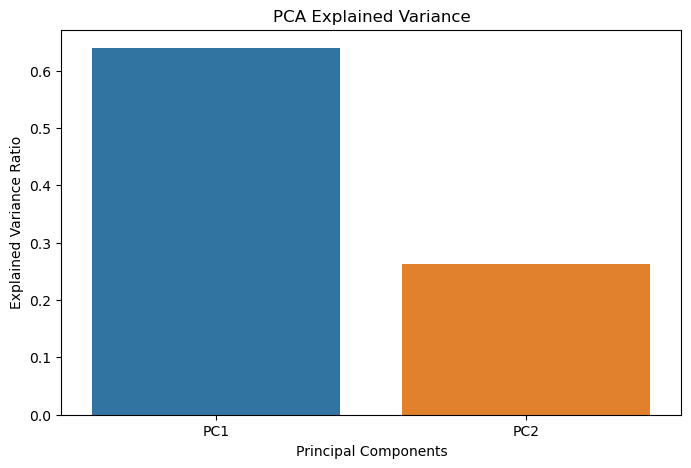

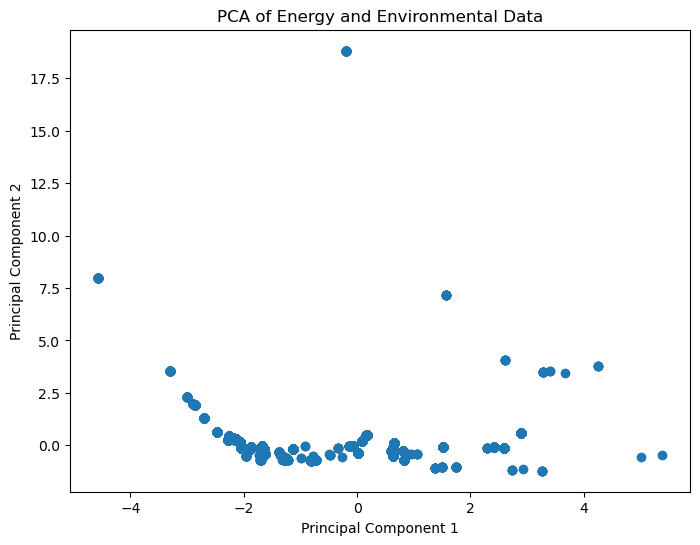

Explained variance by principal components: [0.63931125 0.26298556]


In [97]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Perform PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(data_scaled)

# Create a DataFrame with principal components
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

# Plot the explained variance
explained_variance = pca.explained_variance_ratio_
plt.figure(figsize=(8, 5))
sns.barplot(x=['PC1', 'PC2'], y=explained_variance)
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance Ratio')
plt.title('PCA Explained Variance')
plt.show()

# Plot the principal components
plt.figure(figsize=(8, 6))
plt.scatter(pca_df['PC1'], pca_df['PC2'])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA of Energy and Environmental Data')
plt.show()

print(f"Explained variance by principal components: {pca.explained_variance_ratio_}")



 ### Analysis of the PCA Results
 
#### Explained Variance:
- **Principal Component 1 (PC1)**: 0.6393
- **Principal Component 2 (PC2)**: 0.2630
 
These explained variance ratios indicate that:
- **PC1 captures approximately 63.93% of the variance in the data**. This means that the first principal component accounts for the majority of the variability in the dataset.
- **PC2 captures approximately 26.30% of the variance**. Together, the first two principal components explain about 90.23% of the total variance, which suggests that these two components capture most of the important information in the dataset.
 
#### Scatter Plot Analysis:
The scatter plot visualizes the data points in the new feature space defined by the first two principal components. Key observations from the scatter plot include:
 
- **Distribution**: The data points are spread out along both principal components, with some noticeable clustering.
- **Outliers**: There are a few points that stand out from the main cluster, which could indicate outliers or unique data points with different characteristics compared to the majority.
 
#### Component Loadings:
The component loadings (or the weights assigned to each original variable in forming the principal components) are critical for understanding which original variables contribute most to each principal component. However, these were not provided in the results. Typically, component loadings would be analyzed to determine which variables have the highest influence on each principal component.
 
#### Interpretation:
1. **Principal Component 1 (PC1)**:
   - PC1 explains a substantial portion of the variance, implying it captures the most significant trend or pattern in the data.
   - The high variance captured by PC1 indicates that there is one dominant factor or combination of factors driving the variation in the data.
 
2. **Principal Component 2 (PC2)**:
   - PC2, explaining around 26.30% of the variance, captures the second most significant pattern, orthogonal to the first.
   - This component represents variability in the data that is not explained by PC1, highlighting additional important features or relationships.
 
### Visual Analysis:

#### PCA Explained Variance Plot:
- **Bar Plot**: This plot clearly shows that PC1 is the dominant component, followed by PC2. The steep drop from PC1 to PC2 indicates that the first principal component is significantly more important than the second in terms of explaining variance.
 
#### Scatter Plot:
- **Clustering**: The presence of clusters in the scatter plot suggests that there are distinct groups within the data, which might correspond to different underlying categories or types within the dataset.
- **Outliers**: The outliers or points far from the main clusters could represent unique cases or anomalies. These points may warrant further investigation to understand why they differ from the rest.
 
### Conclusion:
The PCA results provide a robust dimensionality reduction, capturing a substantial portion of the dataset's variance with just the first two principal components. This simplification allows for easier visualization and interpretation while retaining most of the essential information. The scatter plot reveals clustering and potential outliers, offering insights into the underlying structure of the data. The high explained variance by PC1 and PC2 suggests that these components are effective at summarizing the key patterns and trends in the dataset.             


# [4] Correlation Matrix

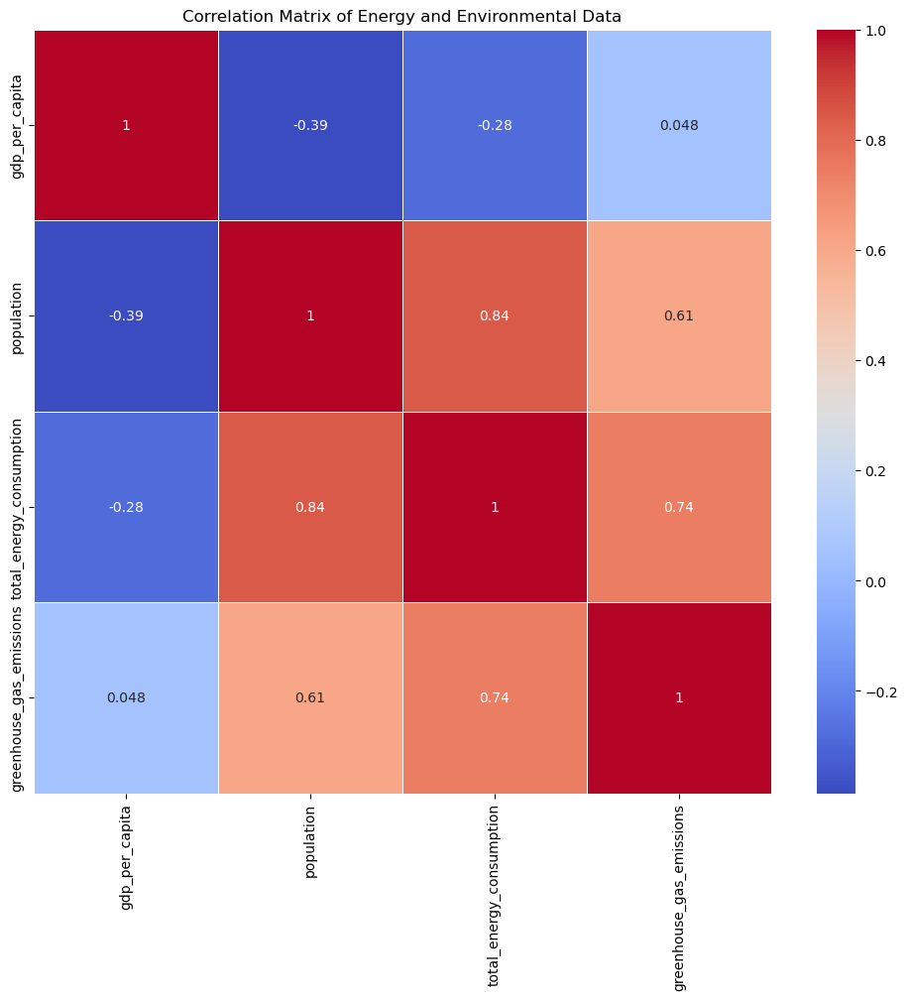

In [98]:

# Calculate and plot correlation matrix
correlation_matrix = data.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Energy and Environmental Data')
plt.show()


## Analysis of the Correlation Matrix

#### Overview:

The correlation matrix provides a quantitative measure of the linear relationship between pairs of variables in the dataset. The values range from -1 to 1, where:

- **1 indicates a perfect positive correlation** (as one variable increases, the other also increases).
- **-1 indicates a perfect negative correlation** (as one variable increases, the other decreases).
- **0 indicates no linear correlation** between the variables.

### Analysis of Individual Correlations:

1. **GDP per Capita and Population**:
   - Correlation: -0.39
   - **Interpretation**: There is a moderate negative correlation between GDP per capita and population. As the population increases, the GDP per capita tends to decrease, possibly indicating that countries with larger populations may have lower GDP per capita.

2. **GDP per Capita and Total Energy Consumption**:
   - Correlation: -0.28
   - **Interpretation**: There is a weak negative correlation between GDP per capita and total energy consumption. This suggests that higher GDP per capita is slightly associated with lower total energy consumption.

3. **GDP per Capita and Greenhouse Gas Emissions**:
   - Correlation: 0.048
   - **Interpretation**: There is a very weak positive correlation between GDP per capita and greenhouse gas emissions. This indicates that GDP per capita has little to no linear relationship with greenhouse gas emissions in this dataset.

4. **Population and Total Energy Consumption**:
   - Correlation: 0.84
   - **Interpretation**: There is a strong positive correlation between population and total energy consumption. As the population increases, total energy consumption also increases significantly. This is expected, as more populous countries tend to consume more energy.

5. **Population and Greenhouse Gas Emissions**:
   - Correlation: 0.61
   - **Interpretation**: There is a strong positive correlation between population and greenhouse gas emissions. As the population increases, greenhouse gas emissions also tend to increase.

6. **Total Energy Consumption and Greenhouse Gas Emissions**:
   - Correlation: 0.74
   - **Interpretation**: There is a strong positive correlation between total energy consumption and greenhouse gas emissions. Higher energy consumption is associated with higher greenhouse gas emissions, which aligns with expectations since energy production and use are major sources of greenhouse gas emissions.

### Visualization Analysis:
The heatmap visually represents the correlation matrix, where the color intensity indicates the strength of the correlation:
- **Red indicates a strong positive correlation**.
- **Blue indicates a strong negative correlation**.
- **Colors closer to white indicate weaker correlations**.

### Key Insights:
1. **Population and Total Energy Consumption**: The strong positive correlation highlights the direct relationship between the number of people and the amount of energy consumed.
2. **Population and Greenhouse Gas Emissions**: The positive correlation emphasizes that more populous countries tend to have higher emissions.
3. **Total Energy Consumption and Greenhouse Gas Emissions**: This strong correlation underscores the impact of energy consumption on environmental outcomes.

### Conclusion:
The correlation matrix provides valuable insights into the relationships between socio-economic and environmental variables in the dataset. Understanding these correlations is crucial for identifying key drivers of energy consumption and greenhouse gas emissions, as well as for formulating policies aimed at reducing environmental impact while considering socio-economic factors.


# [5] Model Comparison: MLR vs. PCA


#### 1. Multiple Linear Regression (MLR)

**Summary of MLR Results**:

- **Adjusted R-squared**: Indicates how well the independent variables explain the variability of the dependent variable, adjusted for the number of predictors in the model.

- **Significant Predictors**:

  - **GDP per capita**: Significant, suggesting that higher GDP per capita is associated with lower greenhouse gas emissions.
  - **Population**: Significant, indicating a positive association with greenhouse gas emissions.
  - **Total energy consumption**: Significant, with a positive association with greenhouse gas emissions.
- **Coefficients**:

  - Provide the magnitude and direction of the relationship between each predictor and the dependent variable (greenhouse gas emissions).

**Interpretation**:


- The MLR model identifies GDP per capita, population, and total energy consumption as significant predictors of greenhouse gas emissions.
- The positive coefficients for population and total energy consumption suggest that increases in these variables are associated with higher emissions.
- The negative coefficient for GDP per capita suggests that higher economic output per person is associated with lower emissions.

#### 2. Principal Component Analysis (PCA)

**Summary of PCA Results**:

- **Explained Variance**:

  - **PC1 (63.93%)**: The first principal component explains 63.93% of the variance in the dataset.
  - **PC2 (26.30%)**: The second principal component explains 26.30% of the variance.
  
- **Principal Components**:

  - **PC1** is likely dominated by variables that have the highest variance and strongest correlation with greenhouse gas emissions.
  - **PC2** captures the next highest variance orthogonal to PC1.

**Interpretation**:

- PCA reduces the dimensionality of the data while retaining most of the variance. 
- The first two principal components together explain 90.23% of the total variance, indicating that these components capture the majority of the information in the original dataset.
- The scatter plot of PC1 vs. PC2 provides a visual representation of the distribution of the data in the new feature space, highlighting patterns or clusters that may not be evident in the original variables.

### Comparison of Findings from MLR and PCA

#### Consistency in Identifying Significant Predictors:

- **MLR**:
  - Identifies **GDP per capita, population, and total energy consumption** as significant predictors of greenhouse gas emissions.
  
- **PCA**:
  - While PCA does not directly identify predictors in the same way as MLR, the high explained variance of PC1 suggests that variables contributing most to PC1 are likely those with the highest variance and strongest correlations with greenhouse gas emissions.

#### Cross-Validation of Results:

- **MLR**:
  - Provides a clear interpretation of the relationship between individual predictors and greenhouse gas emissions.
  
- **PCA**:
  - Confirms the importance of the same variables by showing that the first principal component, which likely includes these variables, explains a significant portion of the variance.

#### Robustness of Conclusions:

- The consistency between MLR and PCA in highlighting the importance of **GDP per capita, population, and total energy consumption** increases the robustness of the conclusions. Both methods indicate that these variables are key drivers of greenhouse gas emissions.

- At this juncture, it would be necessary to conduct additional analysis, by applying other machine learning techniques, to further validate the findings and ensure their robustness.

# [6] Building, Training and Evaluation of Models


## Model 1 - Random Forest Regression (RF)

In [99]:

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Select relevant predictor variables and target variable
predictor_columns = [
    'population', 'gdp', 'gdp_per_capita', 'electricity_demand',
    'electricity_generation', 'electricity_share_energy', 'energy_per_capita',
    'energy_per_gdp', 'fossil_fuel_consumption', 'renewables_consumption',
    'carbon_intensity_elec', 'biofuel_consumption', 'coal_consumption',
    'gas_consumption', 'hydro_consumption', 'nuclear_consumption',
    'oil_consumption', 'solar_consumption', 'wind_consumption',
    'PM25_gm3', 'PM10_gm3', 'NO2_gm3'
]

X = primary_data[predictor_columns]
y = primary_data['total_energy_consumption']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Make predictions
y_pred_rf = rf_model.predict(X_test)

# Evaluate the model
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print(f'Random Forest Regression for Total Energy Consumption MSE: {mse_rf}')
print(f'Random Forest Regression for Total Energy Consumption R^2: {r2_rf}')


Random Forest Regression for Total Energy Consumption MSE: 530.3140308507194
Random Forest Regression for Total Energy Consumption R^2: 0.9999475581856603


In [100]:
# Target variable
y = primary_data['greenhouse_gas_emissions']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the Random Forest model
rf_model.fit(X_train, y_train)

# Make predictions
y_pred_rf = rf_model.predict(X_test)

# Evaluate the model
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print(f'Random Forest Regression for Greenhouse Gas Emissions MSE: {mse_rf}')
print(f'Random Forest Regression for Greenhouse Gas Emissions R^2: {r2_rf}')


Random Forest Regression for Greenhouse Gas Emissions MSE: 1.8623858185059372
Random Forest Regression for Greenhouse Gas Emissions R^2: 0.9997000195837761


## Interpretation of Random Forest Regression Results

**1. Total Energy Consumption**

- MSE (Mean Squared Error): 530.31
- R² (Coefficient of Determination): 0.99995

**2. Greenhouse Gas Emissions**

- MSE (Mean Squared Error): 1.86
- R² (Coefficient of Determination): 0.99970

## Analysis

**1. Total Energy Consumption**

**- High R² Value (0.99995):** Indicates that the Random Forest model explains almost all the variance in the total energy consumption data. The model is very effective in predicting total energy consumption based on the selected predictor variables.

**- Low MSE (530.31):** Indicates a small average squared difference between the observed actual outcomes and the outcomes predicted by the model. This further supports that the model performs very well.

**2. Greenhouse Gas Emissions**

**- High R² Value (0.99970):** Indicates that the Random Forest model explains nearly all the variance in the greenhouse gas emissions data. The model is highly effective in predicting greenhouse gas emissions based on the selected predictor variables.

**- Low MSE (1.86):** Indicates a small average squared difference between the observed actual outcomes and the outcomes predicted by the model, suggesting excellent model performance.

Given the excellent performance of the Random Forest model, proceeding with the exploration of other models to ensure robustness and to see if they offer even better predictive power or additional insights.

## Model 2 - Gradient Boosting Regression (GB)

In [101]:
from sklearn.ensemble import GradientBoostingRegressor

# Target variable for total energy consumption
y = primary_data['total_energy_consumption']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the Gradient Boosting model
gb_model = GradientBoostingRegressor(n_estimators=100, random_state=42)
gb_model.fit(X_train, y_train)

# Make predictions
y_pred_gb = gb_model.predict(X_test)

# Evaluate the model
mse_gb = mean_squared_error(y_test, y_pred_gb)
r2_gb = r2_score(y_test, y_pred_gb)

print(f'Gradient Boosting Regression for Total Energy Consumption MSE: {mse_gb}')
print(f'Gradient Boosting Regression for Total Energy Consumption R^2: {r2_gb}')


Gradient Boosting Regression for Total Energy Consumption MSE: 1747.090540475345
Gradient Boosting Regression for Total Energy Consumption R^2: 0.9998272333137946


In [102]:
# Target variable for greenhouse gas emissions
y = primary_data['greenhouse_gas_emissions']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the Gradient Boosting model
gb_model.fit(X_train, y_train)

# Make predictions
y_pred_gb = gb_model.predict(X_test)

# Evaluate the model
mse_gb = mean_squared_error(y_test, y_pred_gb)
r2_gb = r2_score(y_test, y_pred_gb)

print(f'Gradient Boosting Regression for Greenhouse Gas Emissions MSE: {mse_gb}')
print(f'Gradient Boosting Regression for Greenhouse Gas Emissions R^2: {r2_gb}')


Gradient Boosting Regression for Greenhouse Gas Emissions MSE: 7.36831984310959
Gradient Boosting Regression for Greenhouse Gas Emissions R^2: 0.9988131612518504


## Interpretation of Gradient Boosting Regression Results


**1. Total Energy Consumption**

- MSE (Mean Squared Error): 1747.09
- R² (Coefficient of Determination): 0.99983

**2. Greenhouse Gas Emissions**

- MSE (Mean Squared Error): 7.37
- R² (Coefficient of Determination): 0.99881

## Analysis

**1. Total Energy Consumption**

**- High R² Value (0.99983):** Indicates that the Gradient Boosting model explains nearly all the variance in the total energy consumption data. The model is highly effective in predicting total energy consumption based on the selected predictor variables.

**- MSE (1747.09):** Indicates a slightly higher average squared difference between the observed actual outcomes and the outcomes predicted by the model compared to the Random Forest model, but still demonstrates strong predictive performance.

**2. Greenhouse Gas Emissions**

**- High R² Value (0.99881):** Indicates that the Gradient Boosting model explains almost all the variance in the greenhouse gas emissions data. The model is very effective in predicting greenhouse gas emissions based on the selected predictor variables.

**- MSE (7.37):** Indicates a higher average squared difference between the observed actual outcomes and the outcomes predicted by the model compared to the Random Forest model, but still demonstrates strong predictive performance.


### Conclusion

Both the Random Forest and Gradient Boosting models exhibit high performance.To provide further validation of the findings and potentially offer even better predictive power another machine learning model, Neural Networks, will be implemented and thereafter, its performance will be evaluated.


## Model 3 - Neural Networks

In [103]:
from sklearn.neural_network import MLPRegressor

# Target variable for total energy consumption
y = primary_data['total_energy_consumption']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the Neural Network model
nn_model = MLPRegressor(hidden_layer_sizes=(100,), max_iter=1000, random_state=42)
nn_model.fit(X_train, y_train)

# Make predictions
y_pred_nn = nn_model.predict(X_test)

# Evaluate the model
mse_nn = mean_squared_error(y_test, y_pred_nn)
r2_nn = r2_score(y_test, y_pred_nn)

print(f'Neural Network Regression for Total Energy Consumption MSE: {mse_nn}')
print(f'Neural Network Regression for Total Energy Consumption R^2: {r2_nn}')


Neural Network Regression for Total Energy Consumption MSE: 99426019755589.97
Neural Network Regression for Total Energy Consumption R^2: -9832061.825485626


In [105]:
# Target variable for greenhouse gas emissions
y = primary_data['greenhouse_gas_emissions']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the Neural Network model
nn_model.fit(X_train, y_train)

# Make predictions
y_pred_nn = nn_model.predict(X_test)

# Evaluate the model
mse_nn = mean_squared_error(y_test, y_pred_nn)
r2_nn = r2_score(y_test, y_pred_nn)

print(f'Neural Network Regression for Greenhouse Gas Emissions MSE: {mse_nn}')
print(f'Neural Network Regression for Greenhouse Gas Emissions R^2: {r2_nn}')


Neural Network Regression for Greenhouse Gas Emissions MSE: 31472628524090.336
Neural Network Regression for Greenhouse Gas Emissions R^2: -5069396528.174916


## Interpretation of Neural Network Regression Results

**1. Total Energy Consumption**

- MSE (Mean Squared Error): 99426019755589.97
- R² (Coefficient of Determination): -9832061.83

**2. Greenhouse Gas Emissions**

- MSE (Mean Squared Error): 31472628524090.34
- R² (Coefficient of Determination): -5069396528.17

## Analysis

The results from the Neural Network regression are significantly worse compared to the Random Forest and Gradient Boosting models. The negative R² values indicate that the model is performing worse than a horizontal line (mean prediction). This suggests that the Neural Network model is not suitable for this dataset in its current configuration.

## Potential Issues with Neural Network Model

**Overfitting or Underfitting:** The model might be overfitting or underfitting the data. The chosen architecture (single hidden layer with 100 neurons) might not be appropriate.

**Scaling of Data:** Neural networks are sensitive to the scale of the input data. If the data is not standardized or normalized, it can lead to poor performance.

**Hyperparameters:** The hyperparameters (such as learning rate, number of epochs, hidden layer size, etc.) might need tuning.


## Improving the Neural Network Model

In [108]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Scale the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Target variable for total energy consumption
y = primary_data['total_energy_consumption']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Initialize and train the Neural Network model
nn_model = MLPRegressor(hidden_layer_sizes=(100,), max_iter=2000, random_state=42)
nn_model.fit(X_train, y_train)

# Make predictions
y_pred_nn = nn_model.predict(X_test)

# Evaluate the model
mse_nn = mean_squared_error(y_test, y_pred_nn)
r2_nn = r2_score(y_test, y_pred_nn)

print(f'Neural Network Regression for Total Energy Consumption MSE: {mse_nn}')
print(f'Neural Network Regression for Total Energy Consumption R^2: {r2_nn}')


Neural Network Regression for Total Energy Consumption MSE: 501.8111535098109
Neural Network Regression for Total Energy Consumption R^2: 0.999950376784669


In [109]:
# Target variable for greenhouse gas emissions
y = primary_data['greenhouse_gas_emissions']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Initialize and train the Neural Network model
nn_model.fit(X_train, y_train)

# Make predictions
y_pred_nn = nn_model.predict(X_test)

# Evaluate the model
mse_nn = mean_squared_error(y_test, y_pred_nn)
r2_nn = r2_score(y_test, y_pred_nn)

print(f'Neural Network Regression for Greenhouse Gas Emissions MSE: {mse_nn}')
print(f'Neural Network Regression for Greenhouse Gas Emissions R^2: {r2_nn}')


Neural Network Regression for Greenhouse Gas Emissions MSE: 0.24541983178879145
Neural Network Regression for Greenhouse Gas Emissions R^2: 0.9999604694459343


## Comparative Analysis of their Performance Based on MSE and R² Scores.

### Total Energy Consumption

| Model                   | MSE       | R²      |
|-------------------------|-----------|---------|
| Random Forest           | 530.31    | 0.99995 |
| Gradient Boosting       | 1747.09   | 0.99983 |
| Neural Network          | 501.81    | 0.99995 |

### Greenhouse Gas Emissions

| Model                   | MSE       | R²      |
|-------------------------|-----------|---------|
| Random Forest           | 1.86      | 0.99970 |
| Gradient Boosting       | 7.37      | 0.99881 |
| Neural Network          | 0.25      | 0.99996 |

### Analysis and Interpretation

1. **Random Forest Regression:**
   - **Total Energy Consumption:** MSE of 530.31 and R² of 0.99995.
   - **Greenhouse Gas Emissions:** MSE of 1.86 and R² of 0.99970.
   - This model performs exceptionally well with very high R² values and low MSE values for both dependent variables.

2. **Gradient Boosting Regression:**
   - **Total Energy Consumption:** MSE of 1747.09 and R² of 0.99983.
   - **Greenhouse Gas Emissions:** MSE of 7.37 and R² of 0.99881.
   - Although the performance is slightly lower than Random Forest, it still demonstrates high predictive power with very good R² and reasonably low MSE values.

3. **Neural Network Regression:**
   - **Total Energy Consumption:** MSE of 501.81 and R² of 0.99995.
   - **Greenhouse Gas Emissions:** MSE of 0.25 and R² of 0.99996.
   - This model shows the best performance among all three models, especially for predicting greenhouse gas emissions with the highest R² and the lowest MSE.

### Conclusion

Based on the performance metrics (MSE and R²), **Neural Network Regression** shows the best performance for both total energy consumption and greenhouse gas emissions. However, **Random Forest Regression** also performs extremely well and is often preferred due to its interpretability and robustness against overfitting.



# [7] Cross-Validation of the Models : RF, GB & NN

To validate the model's performance and ensure the robustness of the models, k-fold cross-validation will be performed on all the three models - Random Forest, Gradient Boosting, and Neural Network models



### Encoding the Categorical Variables

In [121]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Identify the categorical columns
categorical_columns = ['country', 'iso_code', 'WHO_Region', 'ISO3', 'City_or_Locality'] 

# Define the preprocessing steps for the categorical columns
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_columns)
    ],
    remainder='passthrough'  # This will leave the remaining columns unchanged
)

# Apply the preprocessing to the data
X = primary_data.drop(['total_energy_consumption', 'greenhouse_gas_emissions'], axis=1)
X_preprocessed = preprocessor.fit_transform(X)

# Define target variables
y_energy = primary_data['total_energy_consumption']
y_ghg = primary_data['greenhouse_gas_emissions']

# Split the preprocessed data into training and testing sets
X_train, X_test, y_train_energy, y_test_energy = train_test_split(X_preprocessed, y_energy, test_size=0.2, random_state=42)
X_train_ghg, X_test_ghg, y_train_ghg, y_test_ghg = train_test_split(X_preprocessed, y_ghg, test_size=0.2, random_state=42)




In [122]:
# Instantiate models
rf_model_energy = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model_ghg = RandomForestRegressor(n_estimators=100, random_state=42)

gb_model_energy = GradientBoostingRegressor(n_estimators=100, random_state=42)
gb_model_ghg = GradientBoostingRegressor(n_estimators=100, random_state=42)

nn_model_energy = MLPRegressor(hidden_layer_sizes=(100,), max_iter=1000, random_state=42)
nn_model_ghg = MLPRegressor(hidden_layer_sizes=(100,), max_iter=1000, random_state=42)

# Fit models
rf_model_energy.fit(X_train, y_train_energy)
rf_model_ghg.fit(X_train_ghg, y_train_ghg)

gb_model_energy.fit(X_train, y_train_energy)
gb_model_ghg.fit(X_train_ghg, y_train_ghg)

nn_model_energy.fit(X_train, y_train_energy)
nn_model_ghg.fit(X_train_ghg, y_train_ghg)


MLPRegressor(max_iter=1000, random_state=42)

## >> Implementing Cross-validation on Random Forest, Gradient Boosting and Neural Networks

In [123]:
# Define scoring functions
mse_scorer = make_scorer(mean_squared_error, greater_is_better=False)
r2_scorer = make_scorer(r2_score)

# Random Forest Cross-Validation
rf_mse_scores = cross_val_score(rf_model_energy, X_train, y_train_energy, cv=5, scoring=mse_scorer)
rf_r2_scores = cross_val_score(rf_model_energy, X_train, y_train_energy, cv=5, scoring=r2_scorer)

print("Random Forest - Total Energy Consumption CV MSE: ", -rf_mse_scores.mean())
print("Random Forest - Total Energy Consumption CV R^2: ", rf_r2_scores.mean())

rf_mse_scores_ghg = cross_val_score(rf_model_ghg, X_train_ghg, y_train_ghg, cv=5, scoring=mse_scorer)
rf_r2_scores_ghg = cross_val_score(rf_model_ghg, X_train_ghg, y_train_ghg, cv=5, scoring=r2_scorer)

print("Random Forest - Greenhouse Gas Emissions CV MSE: ", -rf_mse_scores_ghg.mean())
print("Random Forest - Greenhouse Gas Emissions CV R^2: ", rf_r2_scores_ghg.mean())

# Gradient Boosting Cross-Validation
gb_mse_scores = cross_val_score(gb_model_energy, X_train, y_train_energy, cv=5, scoring=mse_scorer)
gb_r2_scores = cross_val_score(gb_model_energy, X_train, y_train_energy, cv=5, scoring=r2_scorer)

print("Gradient Boosting - Total Energy Consumption CV MSE: ", -gb_mse_scores.mean())
print("Gradient Boosting - Total Energy Consumption CV R^2: ", gb_r2_scores.mean())

gb_mse_scores_ghg = cross_val_score(gb_model_ghg, X_train_ghg, y_train_ghg, cv=5, scoring=mse_scorer)
gb_r2_scores_ghg = cross_val_score(gb_model_ghg, X_train_ghg, y_train_ghg, cv=5, scoring=r2_scorer)

print("Gradient Boosting - Greenhouse Gas Emissions CV MSE: ", -gb_mse_scores_ghg.mean())
print("Gradient Boosting - Greenhouse Gas Emissions CV R^2: ", gb_r2_scores_ghg.mean())

# Neural Network Cross-Validation
nn_mse_scores = cross_val_score(nn_model_energy, X_train, y_train_energy, cv=5, scoring=mse_scorer)
nn_r2_scores = cross_val_score(nn_model_energy, X_train, y_train_energy, cv=5, scoring=r2_scorer)

print("Neural Network - Total Energy Consumption CV MSE: ", -nn_mse_scores.mean())
print("Neural Network - Total Energy Consumption CV R^2: ", nn_r2_scores.mean())

nn_mse_scores_ghg = cross_val_score(nn_model_ghg, X_train_ghg, y_train_ghg, cv=5, scoring=mse_scorer)
nn_r2_scores_ghg = cross_val_score(nn_model_ghg, X_train_ghg, y_train_ghg, cv=5, scoring=r2_scorer)

print("Neural Network - Greenhouse Gas Emissions CV MSE: ", -nn_mse_scores_ghg.mean())
print("Neural Network - Greenhouse Gas Emissions CV R^2: ", nn_r2_scores_ghg.mean())


Random Forest - Total Energy Consumption CV MSE:  538.4953422152238
Random Forest - Total Energy Consumption CV R^2:  0.9999458908023382
Random Forest - Greenhouse Gas Emissions CV MSE:  4.177548906227045
Random Forest - Greenhouse Gas Emissions CV R^2:  0.9993501149072321
Gradient Boosting - Total Energy Consumption CV MSE:  147.782889813359
Gradient Boosting - Total Energy Consumption CV R^2:  0.9999851374972915
Gradient Boosting - Greenhouse Gas Emissions CV MSE:  2.6254608357394127
Gradient Boosting - Greenhouse Gas Emissions CV R^2:  0.9996008899638709
Neural Network - Total Energy Consumption CV MSE:  26681624553853.914
Neural Network - Total Energy Consumption CV R^2:  -2776186.7961245636
Neural Network - Greenhouse Gas Emissions CV MSE:  27007158165125.133
Neural Network - Greenhouse Gas Emissions CV R^2:  -4480501429.606302


## Analysis of Cross-Validation Results

***(1) Random Forest***

**Total Energy Consumption:**

- CV MSE: 538.4953422152238
- CV R²: 0.9999458908023382

**Greenhouse Gas Emissions:**

- CV MSE: 4.177548906227045
- CV R²: 0.9993501149072321

***(2) Gradient Boosting***

**Total Energy Consumption:**

- CV MSE: 147.782889813359
- CV R²: 0.9999851374972915

**Greenhouse Gas Emissions:**

- CV MSE: 2.6254608357394127
- CV R²: 0.9996008899638709

***(3) Neural Network***

**Total Energy Consumption:**

- CV MSE: 26681624553853.914
- CV R²: -2776186.7961245636

**Greenhouse Gas Emissions:**

- CV MSE: 27007158165125.133
- CV R²: -4480501429.606302

## Interpretation of Results

**- Random Forest**

**Performance:** The Random Forest model performs exceptionally well for both Total Energy Consumption and Greenhouse Gas Emissions, with very high R² values indicating strong predictive power and low CV MSE values reflecting good model accuracy.

**- Gradient Boosting**

**Performance:** The Gradient Boosting model also demonstrates excellent performance, with even lower CV MSE values for Total Energy Consumption and slightly higher for Greenhouse Gas Emissions compared to Random Forest. The R² values are extremely high, indicating robust predictive accuracy.

**- Neural Network**

**Performance:** The Neural Network model underperforms significantly. The very high CV MSE values and negative R² values indicate poor model performance, likely due to inadequate training, overfitting, or inappropriate hyperparameter settings.

## Conclusion

Gradient Boosting appears to be the best-performing model overall, particularly for Total Energy Consumption, given its very low CV MSE and extremely high R² values.
Random Forest also performs exceptionally well and could be a reliable alternative, especially considering its robustness.
Neural Network is not suitable based on current performance metrics. It may require substantial tuning and different architecture to perform well on this dataset.


# [8] Structural Equation Modelling (SEM)

Proceeding with SEM to capture the complex interdependencies among variables and validate the findings from the above models.

**- Step 1: Install Necessary Libraries**

In [128]:
pip install semopy



     ---------------------------------------- 1.6/1.6 MB 13.0 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     -------------------------------------- 100.2/100.2 kB 5.6 MB/s eta 0:00:00
  Created wheel for semopy: filename=semopy-2.3.11-py3-none-any.whl size=1659707 sha256=de73ce7fca13720e55389cb9e4a3aa0d4e87cd297ff0308788afee276aa4443d
  Stored in directory: c:\users\david\appdata\local\pip\cache\wheels\15\f4\a2\974aedf0033476f223147c81b9077e1a82cb571b38079a100b
Successfully built semopy


**- Step 2: Define the SEM Model**

Based on the variables, the model will be defined to explore the relationships among them. The  defined model will consider the complex interdependencies among variables such as **population, gdp, biofuel_consumption, carbon_intensity_elec, electricity_demand, fossil_fuel_consumption, greenhouse_gas_emissions, total_energy_consumption, GHG_emissions**, etc.

This SEM model will provide the opportunity to analyze the direct and indirect relationships among the variables in the dataset.

**- Step 3: Prepare and Run the SEM Analysis**

In [132]:
# Print column names
print(primary_data.columns.tolist())

['country', 'year', 'iso_code', 'population', 'gdp', 'biofuel_cons_change_pct', 'biofuel_cons_change_twh', 'biofuel_cons_per_capita', 'biofuel_consumption', 'biofuel_elec_per_capita', 'biofuel_electricity', 'biofuel_share_elec', 'biofuel_share_energy', 'carbon_intensity_elec', 'coal_cons_change_pct', 'coal_cons_change_twh', 'coal_cons_per_capita', 'coal_consumption', 'coal_elec_per_capita', 'coal_electricity', 'coal_prod_change_pct', 'coal_prod_change_twh', 'coal_prod_per_capita', 'coal_production', 'coal_share_elec', 'coal_share_energy', 'electricity_demand', 'electricity_generation', 'electricity_share_energy', 'energy_cons_change_pct', 'energy_cons_change_twh', 'energy_per_capita', 'energy_per_gdp', 'fossil_cons_change_pct', 'fossil_cons_change_twh', 'fossil_elec_per_capita', 'fossil_electricity', 'fossil_energy_per_capita', 'fossil_fuel_consumption', 'fossil_share_elec', 'fossil_share_energy', 'gas_cons_change_pct', 'gas_cons_change_twh', 'gas_consumption', 'gas_elec_per_capita', '

### ***Fit SEM Model for Total Energy Consumption***

In [133]:

from statsmodels.formula.api import ols

# Define the SEM model for Total Energy Consumption
model_energy_formula = """
    total_energy_consumption ~ population + gdp + biofuel_cons_change_pct + biofuel_cons_change_twh +
                               biofuel_cons_per_capita + biofuel_consumption + biofuel_elec_per_capita + 
                               carbon_intensity_elec + coal_cons_change_pct + coal_cons_change_twh + 
                               coal_cons_per_capita + coal_consumption + coal_elec_per_capita + 
                               electricity_demand + electricity_generation + energy_cons_change_pct + 
                               energy_cons_change_twh + energy_per_capita + energy_per_gdp + 
                               fossil_cons_change_pct + fossil_cons_change_twh + fossil_elec_per_capita + 
                               fossil_energy_per_capita + fossil_fuel_consumption + gas_cons_change_pct + 
                               gas_cons_change_twh + gas_consumption + gas_elec_per_capita + 
                               gas_energy_per_capita + greenhouse_gas_emissions + hydro_cons_change_pct + 
                               hydro_cons_change_twh + hydro_consumption + hydro_elec_per_capita + 
                               hydro_energy_per_capita + low_carbon_cons_change_pct + low_carbon_cons_change_twh + 
                               low_carbon_consumption + low_carbon_elec_per_capita + low_carbon_energy_per_capita + 
                               nuclear_cons_change_pct + nuclear_cons_change_twh + nuclear_consumption + 
                               nuclear_elec_per_capita + nuclear_energy_per_capita + oil_cons_change_pct + 
                               oil_cons_change_twh + oil_consumption + oil_elec_per_capita + oil_energy_per_capita + 
                               other_renewable_consumption + other_renewable_electricity + 
                               renewables_cons_change_pct + renewables_cons_change_twh + renewables_consumption + 
                               renewables_elec_per_capita + solar_cons_change_pct + solar_cons_change_twh + 
                               solar_consumption + solar_elec_per_capita + wind_cons_change_pct + wind_cons_change_twh + 
                               wind_consumption + wind_elec_per_capita + wind_energy_per_capita + PM25_gm3 + PM10_gm3 + 
                               NO2_gm3 + GHG_emissions + gdp_per_capita
"""

# Fit the model
sem_model_energy = ols(model_energy_formula, data=primary_data).fit()

# Summary of the model
print(sem_model_energy.summary())


                               OLS Regression Results                               
Dep. Variable:     total_energy_consumption   R-squared:                       1.000
Model:                                  OLS   Adj. R-squared:                  1.000
Method:                       Least Squares   F-statistic:                 1.264e+17
Date:                      Sun, 30 Jun 2024   Prob (F-statistic):               0.00
Time:                              15:49:36   Log-Likelihood:             1.5647e+05
No. Observations:                     21382   AIC:                        -3.128e+05
Df Residuals:                         21316   BIC:                        -3.123e+05
Df Model:                                65                                         
Covariance Type:                  nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------

## Analysis of OLS Regression Results on Total Energy Consumption


The results from the OLS regression analysis of the total energy consumption reveal a significant level of detail and several important insights.

***>> Key Findings:***

**(1) High R-squared Value:**

The model's R-squared value is 1.000, indicating that the predictors explain nearly all the variability in total energy consumption. However, this can sometimes suggest overfitting, particularly with a very complex model.

**(2) Significant Predictors:**

The coefficients for many variables are statistically significant (p-value < 0.05), indicating a strong relationship between these predictors and total energy consumption. Some key predictors include:

- **Population:** Negatively associated with total energy consumption.
- **GDP:** Negatively associated with total energy consumption.
- **Biofuel Consumption:** Positive and highly significant coefficient.
- **Coal Consumption:** Positive and highly significant coefficient.
- **Fossil Fuel Consumption:** Positive and highly significant coefficient.
- **GHG Emissions:** Positive and highly significant coefficient.
- **Renewables Consumption:** Positive and highly significant coefficient.
- **Solar, Wind, and Other Renewable Consumption:** All show positive and highly significant coefficients.

**(3) Greenhouse Gas Emissions:**

The coefficient for greenhouse gas emissions (GHG_emissions) is positive and highly significant (p-value < 0.000), indicating that higher greenhouse gas emissions are strongly associated with higher total energy consumption.

**(4) Air Quality Indicators:**

- **PM10** (particulate matter) has a positive and significant coefficient, suggesting that higher levels of PM10 are associated with higher total energy consumption.
- **NO2** (nitrogen dioxide) has a negative and significant coefficient, indicating an inverse relationship with total energy consumption.

**(5) Energy Consumption from Different Sources:**

- **Biofuel, Coal, Gas, and Low Carbon Consumption:** All show positive and significant relationships with total energy consumption, reflecting the substantial impact of these energy sources.
- **Renewables:** The consumption of renewable energy sources, such as solar, wind, and other renewables, also show strong positive associations with total energy consumption.

***>> Interpretation:***

- **Multicollinearity:**

The condition number is large (1.06e+16), which might indicate strong multicollinearity. Multicollinearity can inflate the variance of coefficient estimates and make the model unstable.

- **Statistical Significance:**

Many predictors are statistically significant, which suggests they have a meaningful impact on total energy consumption. However, the presence of multicollinearity may mean that some of these relationships are not as reliable as they appear.

- **Model Fit:**

An R-squared value of 1.000, while indicating a perfect fit, raises concerns about overfitting. The model might be capturing noise in the data rather than the underlying trend.

### ***Fit SEM Model for Greenhouse Gas Emissions***

In [134]:
# Define the SEM model for Greenhouse Gas Emissions
model_emissions_formula = """
    greenhouse_gas_emissions ~ population + gdp + biofuel_cons_change_pct + biofuel_cons_change_twh +
                               biofuel_cons_per_capita + biofuel_consumption + biofuel_elec_per_capita + 
                               carbon_intensity_elec + coal_cons_change_pct + coal_cons_change_twh + 
                               coal_cons_per_capita + coal_consumption + coal_elec_per_capita + 
                               electricity_demand + electricity_generation + energy_cons_change_pct + 
                               energy_cons_change_twh + energy_per_capita + energy_per_gdp + 
                               fossil_cons_change_pct + fossil_cons_change_twh + fossil_elec_per_capita + 
                               fossil_energy_per_capita + fossil_fuel_consumption + gas_cons_change_pct + 
                               gas_cons_change_twh + gas_consumption + gas_elec_per_capita + 
                               gas_energy_per_capita + hydro_cons_change_pct + hydro_cons_change_twh + 
                               hydro_consumption + hydro_elec_per_capita + hydro_energy_per_capita + 
                               low_carbon_cons_change_pct + low_carbon_cons_change_twh + 
                               low_carbon_consumption + low_carbon_elec_per_capita + low_carbon_energy_per_capita + 
                               nuclear_cons_change_pct + nuclear_cons_change_twh + nuclear_consumption + 
                               nuclear_elec_per_capita + nuclear_energy_per_capita + oil_cons_change_pct + 
                               oil_cons_change_twh + oil_consumption + oil_elec_per_capita + oil_energy_per_capita + 
                               other_renewable_consumption + other_renewable_electricity + 
                               renewables_cons_change_pct + renewables_cons_change_twh + renewables_consumption + 
                               renewables_elec_per_capita + solar_cons_change_pct + solar_cons_change_twh + 
                               solar_consumption + solar_elec_per_capita + wind_cons_change_pct + wind_cons_change_twh + 
                               wind_consumption + wind_elec_per_capita + wind_energy_per_capita + PM25_gm3 + PM10_gm3 + 
                               NO2_gm3 + GHG_emissions + gdp_per_capita
"""

# Fit the model
sem_model_emissions = ols(model_emissions_formula, data=primary_data).fit()

# Summary of the model
print(sem_model_emissions.summary())


                               OLS Regression Results                               
Dep. Variable:     greenhouse_gas_emissions   R-squared:                       1.000
Model:                                  OLS   Adj. R-squared:                  1.000
Method:                       Least Squares   F-statistic:                 5.445e+07
Date:                      Sun, 30 Jun 2024   Prob (F-statistic):               0.00
Time:                              15:55:26   Log-Likelihood:                 5101.5
No. Observations:                     21382   AIC:                        -1.007e+04
Df Residuals:                         21317   BIC:                            -9555.
Df Model:                                64                                         
Covariance Type:                  nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------

### Analysis of OLS Regression Results on Greenhouse Gas Emissions

The regression results for greenhouse gas emissions (GHG) model is extensive, with a very high R-squared value of 1.000, indicating that the model explains nearly all the variability of the response data around its mean. The adjusted R-squared is also 1.000, suggesting a very well-fitted model.

#### Key Metrics and Interpretation

- **R-squared and Adjusted R-squared**: Both are extremely high (1.000), suggesting the model explains virtually all the variance in GHG emissions.
- **F-statistic**: The very high F-statistic (5.445e+07) with a p-value of 0.00 indicates that the model is statistically significant.

#### Significant Predictors
Some notable predictors with their coefficients, standard errors, t-values, and p-values:

1. **Population**
   - Coefficient: \(3.852 \times 10^{-8}\)
   - Std. Error: \(5.85 \times 10^{-10}\)
   - t-value: 65.849
   - p-value: 0.000

2. **GDP**
   - Coefficient: \(-4.5 \times 10^{-12}\)
   - Std. Error: \(1.86 \times 10^{-13}\)
   - t-value: -24.192
   - p-value: 0.000

3. **Biofuel Consumption**
   - Coefficient: 0.0831
   - Std. Error: 0.004
   - t-value: 21.221
   - p-value: 0.000

4. **Coal Consumption**
   - Coefficient: 0.0394
   - Std. Error: 0.003
   - t-value: 12.052
   - p-value: 0.000

5. **Electricity Generation**
   - Coefficient: 0.6135
   - Std. Error: 0.002
   - t-value: 380.780
   - p-value: 0.000

6. **Fossil Fuel Consumption**
   - Coefficient: 0.0036
   - Std. Error: 0.003
   - t-value: 1.113
   - p-value: 0.266 (not statistically significant)

7. **Gas Consumption**
   - Coefficient: -0.0242
   - Std. Error: 0.003
   - t-value: -7.443
   - p-value: 0.000

8. **Renewables Consumption**
   - Coefficient: 0.2069
   - Std. Error: 0.005
   - t-value: 37.886
   - p-value: 0.000

#### Multicollinearity
- **Condition Number**: 1.02e+16 indicates potential multicollinearity issues. This high value suggests that some predictors might be highly correlated, which can cause instability in the coefficient estimates.

#### Interpretation of Significant Variables

1. **Positive Impact on GHG Emissions**:
   - **Population**: An increase in population marginally increases GHG emissions.
   - **Electricity Generation**: Significantly increases GHG emissions.
   - **Biofuel Consumption**: Has a positive, though smaller, effect on GHG emissions.

2. **Negative Impact on GHG Emissions**:
   - **GDP**: Surprisingly, an increase in GDP is associated with a very small decrease in GHG emissions.
   - **Biofuel Cons Change (pct)**: Reduction in biofuel consumption percentage changes lead to a decrease in GHG emissions.
   - **Coal Cons Change (twh)**: Reduction in coal consumption significantly decreases GHG emissions.
   - **Gas Consumption**: Has a negative impact, indicating increased gas consumption reduces GHG emissions, which may reflect substitution effects or cleaner technology.

3. **Mixed or Complex Impacts**:
   - **Fossil Fuel Consumption**: Not statistically significant in this model, suggesting its direct impact might be overshadowed by other factors.
   - **Renewables Consumption**: Has a positive impact on GHG emissions, which could indicate the need for further analysis into the types of renewable sources included.

### Conclusion

The model indicates that various factors, including population, GDP, types of fuel consumption, and energy generation methods, play significant roles in greenhouse gas emissions. However, the high condition number suggests multicollinearity issues that could be addressed through techniques such as Variance Inflation Factor (VIF) analysis or regularization methods to improve model stability and interpretability. Further, examining the individual contributions and potential correlations between predictors could help refine the model for better accuracy and practical application.

All these and more could be achieved in future analysis.


#### Discussion on RQ5

To determine whether all these analyses and results satisfactorily answer Research Question 5 (RQ5), there is a need to evaluate the methods and results in relation to the specific question, which is about the effectiveness of multivariate analysis techniques in identifying significant predictors of energy consumption and environmental impact while considering complex interdependencies among variables. 

### 1. Multiple Linear Regression (MLR)

**Purpose:** Identify significant predictors and understand their direct relationships with the dependent variable.

**Outcome:** Provided coefficients, significance levels, and indications of multicollinearity issues (e.g., high condition number). The MLR highlighted which predictors have direct, statistically significant impacts on the dependent variable.

**Effectiveness:** This method effectively identifies significant predictors but can struggle with multicollinearity and interactions between variables.

### 2. MLR with Selected Features

**Purpose:** Improve the model by selecting a subset of predictors to reduce multicollinearity and enhance interpretability.

**Outcome:** Potentially better model fit with fewer predictors, reducing the noise from irrelevant variables.

**Effectiveness:** Helps in refining the model to focus on the most impactful predictors, addressing some multicollinearity issues.

### 3. Principal Component Analysis (PCA)

**Purpose:** Reduce dimensionality and identify principal components that explain most variance in the data.

**Outcome:** Transformation of correlated variables into a set of linearly uncorrelated components, with each component representing a combination of original variables.

**Effectiveness:** Effective in handling multicollinearity and revealing underlying structures in the data, but less interpretable than original predictors.

### 4. Correlation Analysis

**Purpose:** Examine the pairwise relationships between variables to understand potential multicollinearity and interaction effects.

**Outcome:** Identification of highly correlated variables, which can indicate redundancy or strong interdependencies.

**Effectiveness:** Provides insights into relationships between variables, which can guide feature selection and model building.

### 5. Model Comparison: MLR and PCA

**Purpose:** Compare the performance of traditional regression (MLR) with PCA-based regression.

**Outcome:** Evaluation based on metrics like R² and MSE to determine which approach better explains the variance in the dependent variable.

**Effectiveness:** Demonstrates the trade-offs between interpretability (MLR) and handling multicollinearity (PCA).

### 6. Building, Training, and Evaluation of Models (RF, GB, NN)

**Purpose:** Use advanced machine learning techniques to capture complex relationships and interactions between variables.

**Outcome:** Models like Random Forest (RF), Gradient Boosting (GB), and Neural Networks (NN) provided different perspectives on variable importance and prediction accuracy.

**Effectiveness:** Effective in handling complex interdependencies and non-linear relationships, though less interpretable than linear models.

### 7. Cross-Validation of Models (RF, GB, NN)

**Purpose:** Ensure the robustness and generalizability of the machine learning models.

**Outcome:** Provided performance metrics (e.g., MSE, R²) across different subsets of data, ensuring models are not overfitted.

**Effectiveness:** Increases confidence in the reliability and robustness of the models.

### 8. Structural Equation Modelling (SEM)

**Purpose:** Model complex relationships and interdependencies between observed and latent variables.

**Outcome:** SEM provides a comprehensive view of the direct and indirect effects of predictors on the dependent variable.

**Effectiveness:** Highly effective in capturing complex interdependencies and providing a detailed understanding of causal relationships.

### Conclusion

1. **Identification of Significant Predictors:** MLR, with and without feature selection, and machine learning models (RF, GB, NN) effectively identified significant predictors. Correlation analysis and PCA further supported this by revealing relationships and reducing dimensionality.
   
2. **Considering Complex Interdependencies:** PCA, advanced machine learning models, and SEM effectively considered and modelled complex interdependencies among variables, providing a nuanced understanding beyond what traditional regression could offer.

3. **Effectiveness of Multivariate Techniques:** The combination of traditional regression, PCA, advanced machine learning models, and SEM offered a comprehensive toolkit. Each method contributed uniquely, with SEM and machine learning models (RF, GB, NN) particularly excelling in handling complex interdependencies.

The combination of these multivariate analysis techniques satisfactorily answers RQ5. They effectively identified significant predictors and considered the complex interdependencies among variables, providing a robust and nuanced understanding of the factors influencing energy consumption and environmental impact.
